# Introduction
**Literata Team:** Zheng Maria Yu, Alessio Hu, Jakub Jastrzębski, Joanna Rancew

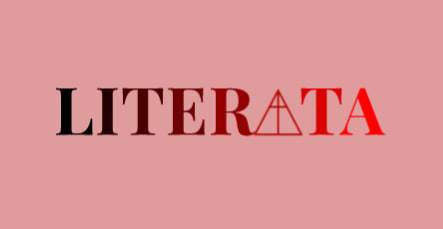




Project: **AUTEXTIFICATION: Automatic Text Identification** that covers both **binary classification** to *distinguish between generated text and human-written text*, and **multi-class classification** to predict *what language model generated particular text*.



The notebook is structured into two main subtasks: **Subtask 1: Human or Generated** and **Subtask 2: Which Generation model**. Each subtask begins with data preprocessing and visualizations. Subsequently, a comprehensive collection of models trained on the dataset is presented, ranging from simple machine learning classifiers to various neural networks and transformers.
To facilitate navigation within the notebook use a table of contents on the left (colab) to easy access to different sections.

# Colab setup and libraries

Our project included several NLP tasks and methodologies thus we decided to use different available libraries to find the best solution. In this section you can find all libraries needed to run models. Remember that for this notebook one should use GPU for calculations. 

In [ ]:
try:
  from google.colab import drive
  drive.mount('/content/drive')
except:
  print("Not on colab, skipping")

Mounted at /content/drive


In [ ]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

from pathlib import Path

# use the correct path
if Path('/content/drive/MyDrive/Colab\ Notebooks/NLP/project').is_dir():
  %cd /content/drive/MyDrive/Colab\ Notebooks/NLP/project
else:
  print("ok")
  # see https://stackoverflow.com/questions/54351852/accessing-shared-with-me-with-colab
  %cd "/content/drive/MyDrive/project"
%ls

ok
/content/drive/.shortcut-targets-by-id/1OeN_JaHxeBBVyQmOEqtcwbeoM4zYY05T/project
 assets/                                  mask.png
 Clustering_datasets.ipynb                model.png
 Copia_di_Literata2.ipynb                 parsed_texts_subtask_1.json
'Copia di Literata.ipynb'                 parsed_texts_subtask_2.json
'Copia di main.ipynb'                     parsed_texts_subtask_2_with_aug.json
'DeeperNN from subtask2'/                 saved_model.pb
 embeddings/                             'Simple models for subtask2'/
 example.tsv                              subtask_1/
 fingerprint.pb                           subtask_1_models/
 GroupAssignment2023.pdf                  subtask_2/
 keras_metadata.pb                        subtask_2_models/
'Kopia Literata_transformer_kuba.ipynb'   subtask_2_translated_data.tsv
 Literata.ipynb                           transformer_task1/
'lr graph.ipynb'                          translated_data.tsv
 main.ipynb                               var

## Spacy requirements
A priori we know that the training data has english and spanish sentences, so we download the en and es packages from spacy.

In [ ]:
# Install spacy dependencies
!pip install -U spacy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 58.5 MB/s eta 0:00:00
  Attempting uninstall: spacy
    Found existing installation: spacy 3.5.2
    Uninstalling spacy-3.5.2:
      Successfully uninstalled spacy-3.5.2


In [ ]:
# Download core for the languages
import sys
languages = ['en','es']

spacy_core = "en_core_web_sm"
!{sys.executable} -m spacy download $spacy_core

spacy_core = "es_core_news_sm"
!{sys.executable} -m spacy download $spacy_core

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 12.8/12.8 MB 4.1 MB/s eta 0:00:00


[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 12.9/12.9 MB 5.4 MB/s eta 0:00:00
[+] Download and installation successful
You can now load the package via spacy.load('es_core_news_sm')


In [ ]:
import spacy
import en_core_web_sm
import es_core_news_sm

## Additional libraries

In [ ]:
# Install attention libraries
!pip install attention

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Install tranformers libraries
!pip3 install -q transformers datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.1/7.1 MB 73.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.6/474.6 kB 50.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 19.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 105.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 15.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 25.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 17.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 56.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 22.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 149.6/149.6 kB 3.4 MB/s eta 0:00:00


In [ ]:
# Install other dependencies
# !pip install pandas
!pip install xgboost
# !pip install scikit-learn
!pip install nltk
# !pip install matplotlib
# !pip install seaborn
!pip install wordcloud
# !pip install tensorflow_hub

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import pandas as pd

import tensorflow as tf
import tensorflow_hub as hub
import xgboost as xgb
import sklearn

import matplotlib.gridspec as gridspec
import seaborn as sns
import matplotlib.pyplot as plt

import os
import random
import string
import warnings
import json
import re
import pickle

from wordcloud import WordCloud, STOPWORDS
from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.decomposition import NMF
from sklearn.metrics import f1_score,classification_report, confusion_matrix
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.pipeline import FeatureUnion
from sklearn.ensemble import RandomForestClassifier
from sklearn.base import BaseEstimator, TransformerMixin


from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, GRU,SimpleRNN
from tensorflow.keras.layers import Dense, Activation, Dropout
from tensorflow.keras.layers import Embedding
from tensorflow.keras.layers import  Bidirectional, SpatialDropout1D
from tensorflow.keras.preprocessing import sequence, text
from tensorflow.keras.layers import Dense, Input,TextVectorization
from tensorflow.keras.optimizers import Adam
from attention import Attention

from tqdm.notebook import tqdm

from collections import defaultdict
from collections import Counter

from matplotlib.ticker import MaxNLocator
%matplotlib inline

warnings.filterwarnings('ignore')
print("Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("Hub version: ", hub.__version__)
print("GPU is", "available" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE")

Version:  2.9.0
Eager mode:  True
Hub version:  0.13.0
GPU is available


## NLTK requirements

In [ ]:
import nltk

In [ ]:
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [ ]:
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
from nltk.probability import FreqDist
from nltk.tokenize import word_tokenize,RegexpTokenizer
from nltk.corpus import stopwords

## Transformers libraries

In [ ]:
import transformers
from transformers import BertTokenizer
from transformers import TFBertModel

## Translator and spell check

In [ ]:
!pip install deep_translator

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from deep_translator import GoogleTranslator

In [ ]:
!pip3 install contextualSpellCheck

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 128.8/128.8 kB 6.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for editdistance: filename=editdistance-0.6.0-cp310-cp310-linux_x86_64.whl size=235618 sha256=009f0769c67368e3a92fb3e6989c4ae8962c42eb72c91982ad1a32a6fca488db
  Stored in directory: /root/.cache/pip/wheels/d2/c2/60/295c59f8772b195d952c943f53ac4936e4ac59fc47a0030a1a
Successfully built editdistance
  Attempting uninstall: editdistance
    Found existing installation: editdistance 0.6.2
    Uninstalling editdistance-0.6.2:
      Successfully uninstalled editdistance-0.6.2


In [ ]:
import contextualSpellCheck

# Utility Functions
In the project we are using a few extra functions for processing the data, extracting additional features, and data visualization. For better readability of the notebook we defined them here.

In [ ]:
# Set random seed for reproducibility
seed = 42
random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)
np.random.seed(seed)

In [ ]:
# from https://github.com/explosion/spaCy/blob/master/spacy/glossary.py
#@title All spacy tags
GLOSSARY = {
    # POS tags
    # Universal POS Tags
    # http://universaldependencies.org/u/pos/
    "ADJ": "adjective",
    "ADP": "adposition",
    "ADV": "adverb",
    "AUX": "auxiliary",
    "CONJ": "conjunction",
    "CCONJ": "coordinating conjunction",
    "DET": "determiner",
    "INTJ": "interjection",
    "NOUN": "noun",
    "NUM": "numeral",
    "PART": "particle",
    "PRON": "pronoun",
    "PROPN": "proper noun",
    "PUNCT": "punctuation",
    "SCONJ": "subordinating conjunction",
    "SYM": "symbol",
    "VERB": "verb",
    "X": "other",
    "EOL": "end of line",
    "SPACE": "space",
    # POS tags (English)
    # OntoNotes 5 / Penn Treebank
    # https://www.ling.upenn.edu/courses/Fall_2003/ling001/penn_treebank_pos.html
    ".": "punctuation mark, sentence closer",
    ",": "punctuation mark, comma",
    "-LRB-": "left round bracket",
    "-RRB-": "right round bracket",
    "``": "opening quotation mark",
    '""': "closing quotation mark",
    "''": "closing quotation mark",
    ":": "punctuation mark, colon or ellipsis",
    "$": "symbol, currency",
    "#": "symbol, number sign",
    "AFX": "affix",
    "CC": "conjunction, coordinating",
    "CD": "cardinal number",
    "DT": "determiner",
    "EX": "existential there",
    "FW": "foreign word",
    "HYPH": "punctuation mark, hyphen",
    "IN": "conjunction, subordinating or preposition",
    "JJ": "adjective (English), other noun-modifier (Chinese)",
    "JJR": "adjective, comparative",
    "JJS": "adjective, superlative",
    "LS": "list item marker",
    "MD": "verb, modal auxiliary",
    "NIL": "missing tag",
    "NN": "noun, singular or mass",
    "NNP": "noun, proper singular",
    "NNPS": "noun, proper plural",
    "NNS": "noun, plural",
    "PDT": "predeterminer",
    "POS": "possessive ending",
    "PRP": "pronoun, personal",
    "PRP$": "pronoun, possessive",
    "RB": "adverb",
    "RBR": "adverb, comparative",
    "RBS": "adverb, superlative",
    "RP": "adverb, particle",
    "TO": 'infinitival "to"',
    "UH": "interjection",
    "VB": "verb, base form",
    "VBD": "verb, past tense",
    "VBG": "verb, gerund or present participle",
    "VBN": "verb, past participle",
    "VBP": "verb, non-3rd person singular present",
    "VBZ": "verb, 3rd person singular present",
    "WDT": "wh-determiner",
    "WP": "wh-pronoun, personal",
    "WP$": "wh-pronoun, possessive",
    "WRB": "wh-adverb",
    "SP": "space (English), sentence-final particle (Chinese)",
    "ADD": "email",
    "NFP": "superfluous punctuation",
    "GW": "additional word in multi-word expression",
    "XX": "unknown",
    "BES": 'auxiliary "be"',
    "HVS": 'forms of "have"',
    "_SP": "whitespace",
    # POS Tags (German)
    # TIGER Treebank
    # http://www.ims.uni-stuttgart.de/forschung/ressourcen/korpora/TIGERCorpus/annotation/tiger_introduction.pdf
    "$(": "other sentence-internal punctuation mark",
    "$,": "comma",
    "$.": "sentence-final punctuation mark",
    "ADJA": "adjective, attributive",
    "ADJD": "adjective, adverbial or predicative",
    "APPO": "postposition",
    "APPR": "preposition; circumposition left",
    "APPRART": "preposition with article",
    "APZR": "circumposition right",
    "ART": "definite or indefinite article",
    "CARD": "cardinal number",
    "FM": "foreign language material",
    "ITJ": "interjection",
    "KOKOM": "comparative conjunction",
    "KON": "coordinate conjunction",
    "KOUI": 'subordinate conjunction with "zu" and infinitive',
    "KOUS": "subordinate conjunction with sentence",
    "NE": "proper noun",
    "NNE": "proper noun",
    "PAV": "pronominal adverb",
    "PROAV": "pronominal adverb",
    "PDAT": "attributive demonstrative pronoun",
    "PDS": "substituting demonstrative pronoun",
    "PIAT": "attributive indefinite pronoun without determiner",
    "PIDAT": "attributive indefinite pronoun with determiner",
    "PIS": "substituting indefinite pronoun",
    "PPER": "non-reflexive personal pronoun",
    "PPOSAT": "attributive possessive pronoun",
    "PPOSS": "substituting possessive pronoun",
    "PRELAT": "attributive relative pronoun",
    "PRELS": "substituting relative pronoun",
    "PRF": "reflexive personal pronoun",
    "PTKA": "particle with adjective or adverb",
    "PTKANT": "answer particle",
    "PTKNEG": "negative particle",
    "PTKVZ": "separable verbal particle",
    "PTKZU": '"zu" before infinitive',
    "PWAT": "attributive interrogative pronoun",
    "PWAV": "adverbial interrogative or relative pronoun",
    "PWS": "substituting interrogative pronoun",
    "TRUNC": "word remnant",
    "VAFIN": "finite verb, auxiliary",
    "VAIMP": "imperative, auxiliary",
    "VAINF": "infinitive, auxiliary",
    "VAPP": "perfect participle, auxiliary",
    "VMFIN": "finite verb, modal",
    "VMINF": "infinitive, modal",
    "VMPP": "perfect participle, modal",
    "VVFIN": "finite verb, full",
    "VVIMP": "imperative, full",
    "VVINF": "infinitive, full",
    "VVIZU": 'infinitive with "zu", full',
    "VVPP": "perfect participle, full",
    "XY": "non-word containing non-letter",
    # POS Tags (Chinese)
    # OntoNotes / Chinese Penn Treebank
    # https://repository.upenn.edu/cgi/viewcontent.cgi?article=1039&context=ircs_reports
    "AD": "adverb",
    "AS": "aspect marker",
    "BA": "把 in ba-construction",
    # "CD": "cardinal number",
    "CS": "subordinating conjunction",
    "DEC": "的 in a relative clause",
    "DEG": "associative 的",
    "DER": "得 in V-de const. and V-de-R",
    "DEV": "地 before VP",
    "ETC": "for words 等, 等等",
    # "FW": "foreign words"
    "IJ": "interjection",
    # "JJ": "other noun-modifier",
    "LB": "被 in long bei-const",
    "LC": "localizer",
    "M": "measure word",
    "MSP": "other particle",
    # "NN": "common noun",
    "NR": "proper noun",
    "NT": "temporal noun",
    "OD": "ordinal number",
    "ON": "onomatopoeia",
    "P": "preposition excluding 把 and 被",
    "PN": "pronoun",
    "PU": "punctuation",
    "SB": "被 in short bei-const",
    # "SP": "sentence-final particle",
    "VA": "predicative adjective",
    "VC": "是 (copula)",
    "VE": "有 as the main verb",
    "VV": "other verb",
    # Noun chunks
    "NP": "noun phrase",
    "PP": "prepositional phrase",
    "VP": "verb phrase",
    "ADVP": "adverb phrase",
    "ADJP": "adjective phrase",
    "SBAR": "subordinating conjunction",
    "PRT": "particle",
    "PNP": "prepositional noun phrase",
    # Dependency Labels (English)
    # ClearNLP / Universal Dependencies
    # https://github.com/clir/clearnlp-guidelines/blob/master/md/specifications/dependency_labels.md
    "acl": "clausal modifier of noun (adjectival clause)",
    "acomp": "adjectival complement",
    "advcl": "adverbial clause modifier",
    "advmod": "adverbial modifier",
    "agent": "agent",
    "amod": "adjectival modifier",
    "appos": "appositional modifier",
    "attr": "attribute",
    "aux": "auxiliary",
    "auxpass": "auxiliary (passive)",
    "case": "case marking",
    "cc": "coordinating conjunction",
    "ccomp": "clausal complement",
    "clf": "classifier",
    "complm": "complementizer",
    "compound": "compound",
    "conj": "conjunct",
    "cop": "copula",
    "csubj": "clausal subject",
    "csubjpass": "clausal subject (passive)",
    "dative": "dative",
    "dep": "unclassified dependent",
    "det": "determiner",
    "discourse": "discourse element",
    "dislocated": "dislocated elements",
    "dobj": "direct object",
    "expl": "expletive",
    "fixed": "fixed multiword expression",
    "flat": "flat multiword expression",
    "goeswith": "goes with",
    "hmod": "modifier in hyphenation",
    "hyph": "hyphen",
    "infmod": "infinitival modifier",
    "intj": "interjection",
    "iobj": "indirect object",
    "list": "list",
    "mark": "marker",
    "meta": "meta modifier",
    "neg": "negation modifier",
    "nmod": "modifier of nominal",
    "nn": "noun compound modifier",
    "npadvmod": "noun phrase as adverbial modifier",
    "nsubj": "nominal subject",
    "nsubjpass": "nominal subject (passive)",
    "nounmod": "modifier of nominal",
    "npmod": "noun phrase as adverbial modifier",
    "num": "number modifier",
    "number": "number compound modifier",
    "nummod": "numeric modifier",
    "oprd": "object predicate",
    "obj": "object",
    "obl": "oblique nominal",
    "orphan": "orphan",
    "parataxis": "parataxis",
    "partmod": "participal modifier",
    "pcomp": "complement of preposition",
    "pobj": "object of preposition",
    "poss": "possession modifier",
    "possessive": "possessive modifier",
    "preconj": "pre-correlative conjunction",
    "prep": "prepositional modifier",
    "prt": "particle",
    "punct": "punctuation",
    "quantmod": "modifier of quantifier",
    "rcmod": "relative clause modifier",
    "relcl": "relative clause modifier",
    "reparandum": "overridden disfluency",
    "root": "root",
    "ROOT": "root",
    "vocative": "vocative",
    "xcomp": "open clausal complement",
    # Dependency labels (German)
    # TIGER Treebank
    # http://www.ims.uni-stuttgart.de/forschung/ressourcen/korpora/TIGERCorpus/annotation/tiger_introduction.pdf
    # currently missing: 'cc' (comparative complement) because of conflict
    # with English labels
    "ac": "adpositional case marker",
    "adc": "adjective component",
    "ag": "genitive attribute",
    "ams": "measure argument of adjective",
    "app": "apposition",
    "avc": "adverbial phrase component",
    "cd": "coordinating conjunction",
    "cj": "conjunct",
    "cm": "comparative conjunction",
    "cp": "complementizer",
    "cvc": "collocational verb construction",
    "da": "dative",
    "dh": "discourse-level head",
    "dm": "discourse marker",
    "ep": "expletive es",
    "hd": "head",
    "ju": "junctor",
    "mnr": "postnominal modifier",
    "mo": "modifier",
    "ng": "negation",
    "nk": "noun kernel element",
    "nmc": "numerical component",
    "oa": "accusative object",
    "oc": "clausal object",
    "og": "genitive object",
    "op": "prepositional object",
    "par": "parenthetical element",
    "pd": "predicate",
    "pg": "phrasal genitive",
    "ph": "placeholder",
    "pm": "morphological particle",
    "pnc": "proper noun component",
    "rc": "relative clause",
    "re": "repeated element",
    "rs": "reported speech",
    "sb": "subject",
    "sbp": "passivized subject (PP)",
    "sp": "subject or predicate",
    "svp": "separable verb prefix",
    "uc": "unit component",
    "vo": "vocative",
    # Named Entity Recognition
    # OntoNotes 5
    # https://catalog.ldc.upenn.edu/docs/LDC2013T19/OntoNotes-Release-5.0.pdf
    "PERSON": "People, including fictional",
    "NORP": "Nationalities or religious or political groups",
    "FACILITY": "Buildings, airports, highways, bridges, etc.",
    "FAC": "Buildings, airports, highways, bridges, etc.",
    "ORG": "Companies, agencies, institutions, etc.",
    "GPE": "Countries, cities, states",
    "LOC": "Non-GPE locations, mountain ranges, bodies of water",
    "PRODUCT": "Objects, vehicles, foods, etc. (not services)",
    "EVENT": "Named hurricanes, battles, wars, sports events, etc.",
    "WORK_OF_ART": "Titles of books, songs, etc.",
    "LAW": "Named documents made into laws.",
    "LANGUAGE": "Any named language",
    "DATE": "Absolute or relative dates or periods",
    "TIME": "Times smaller than a day",
    "PERCENT": 'Percentage, including "%"',
    "MONEY": "Monetary values, including unit",
    "QUANTITY": "Measurements, as of weight or distance",
    "ORDINAL": '"first", "second", etc.',
    "CARDINAL": "Numerals that do not fall under another type",
    # Named Entity Recognition
    # Wikipedia
    # http://www.sciencedirect.com/science/article/pii/S0004370212000276
    # https://pdfs.semanticscholar.org/5744/578cc243d92287f47448870bb426c66cc941.pdf
    "PER": "Named person or family.",
    "MISC": "Miscellaneous entities, e.g. events, nationalities, products or works of art",
    # https://github.com/ltgoslo/norne
    "EVT": "Festivals, cultural events, sports events, weather phenomena, wars, etc.",
    "PROD": "Product, i.e. artificially produced entities including speeches, radio shows, programming languages, contracts, laws and ideas",
    "DRV": "Words (and phrases?) that are dervied from a name, but not a name in themselves, e.g. 'Oslo-mannen' ('the man from Oslo')",
    "GPE_LOC": "Geo-political entity, with a locative sense, e.g. 'John lives in Spain'",
    "GPE_ORG": "Geo-political entity, with an organisation sense, e.g. 'Spain declined to meet with Belgium'",
}

In [ ]:
#@title MyCustomFeatures
# In this cell we define and extract additional custom features for training the models
# Current available features: average word length, number of grammar mistakes in the sentence

pattern = r'_('+ '|'.join([re.escape(POS) for POS in list(GLOSSARY.keys())])+')'
print(pattern)

stops = set(stopwords.words('english'))
tokenizer = RegexpTokenizer(r'\w+')

# Grammar mistakes

en_model =en_core_web_sm.load()
contextualSpellCheck.add_to_pipe(en_model) 

# Define your custom feature extractor
# https://michelleful.github.io/code-blog/2015/06/20/pipelines/
class MyCustomFeatures(BaseEstimator, TransformerMixin):
  def __init__(self):
    pass

  def get_feature_names_out(self, input_features=None):
    return ['Avg words length', 'Num grammar mistakes']

  def remove_punctuation(self, sentence):
    # and clean text
    words = []
    for word in sentence.split():
      if "PUNCT" not in word:
        '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
        and remove words containing numbers.'''
        word = word.lower()
        word = re.sub('\[.*?\]', '', word)
        word = re.sub('https?://\S+|www\.\S+', '', word)
        word = re.sub('<.*?>+', '', word)
        word = re.sub('[%s]' % re.escape(string.punctuation), '', word)
        word = re.sub('\n', '', word)
        word = re.sub('\w*\d\w*', '', word)
        word = word.translate(str.maketrans('', '', string.punctuation))
        words.append(word)
    return " ".join(words)

  def get_grammar_mistakes(self, sentence):
    number_of_mistakes=0
    # the spanish translation did not work that's why we were trying to use:
    # text_translated = GoogleTranslator(target='en').translate(text=sentence)
    doc = en_model(text_translated)
    number_of_mistakes = len(doc._.suggestions_spellCheck)
    return number_of_mistakes

  def extract_custom_features(self, sentence):
    sentence_without_pos = self.remove_punctuation(self.remove_pos_tags(sentence))
    avg_len = np.mean([len(word) for word in sentence_without_pos.split()])
    # if NaN, simple mean
    if avg_len != avg_len:
      avg_len = np.mean([len(word) for word in sentence.split()])
    number_of_mistakes = self.get_grammar_mistakes(sentence_without_pos) 
    return [
        avg_len,
        number_of_mistakes
    ]

  def remove_pos_tags(self, sentence):
    sentence_without_pos = re.sub(pattern,'', sentence)
    sentence_without_pos = re.sub(r'\s+', ' ', sentence_without_pos).strip()
    return sentence_without_pos    

  def transform(self, sentences, y=None):
    # the sentences are tagged with POS, remove the POS tags
    return [
        self.extract_custom_features(sentence)
        #self.extract_custom_features(sentence)
         for sentence in sentences
        ]

  def fit(self, df, y=None):
    """Returns `self` unless something different happens in train and test"""
    return self

_(ADJ|ADP|ADV|AUX|CONJ|CCONJ|DET|INTJ|NOUN|NUM|PART|PRON|PROPN|PUNCT|SCONJ|SYM|VERB|X|EOL|SPACE|\.|,|\-LRB\-|\-RRB\-|``|""|''|:|\$|\#|AFX|CC|CD|DT|EX|FW|HYPH|IN|JJ|JJR|JJS|LS|MD|NIL|NN|NNP|NNPS|NNS|PDT|POS|PRP|PRP\$|RB|RBR|RBS|RP|TO|UH|VB|VBD|VBG|VBN|VBP|VBZ|WDT|WP|WP\$|WRB|SP|ADD|NFP|GW|XX|BES|HVS|_SP|\$\(|\$,|\$\.|ADJA|ADJD|APPO|APPR|APPRART|APZR|ART|CARD|FM|ITJ|KOKOM|KON|KOUI|KOUS|NE|NNE|PAV|PROAV|PDAT|PDS|PIAT|PIDAT|PIS|PPER|PPOSAT|PPOSS|PRELAT|PRELS|PRF|PTKA|PTKANT|PTKNEG|PTKVZ|PTKZU|PWAT|PWAV|PWS|TRUNC|VAFIN|VAIMP|VAINF|VAPP|VMFIN|VMINF|VMPP|VVFIN|VVIMP|VVINF|VVIZU|VVPP|XY|AD|AS|BA|CS|DEC|DEG|DER|DEV|ETC|IJ|LB|LC|M|MSP|NR|NT|OD|ON|P|PN|PU|SB|VA|VC|VE|VV|NP|PP|VP|ADVP|ADJP|SBAR|PRT|PNP|acl|acomp|advcl|advmod|agent|amod|appos|attr|aux|auxpass|case|cc|ccomp|clf|complm|compound|conj|cop|csubj|csubjpass|dative|dep|det|discourse|dislocated|dobj|expl|fixed|flat|goeswith|hmod|hyph|infmod|intj|iobj|list|mark|meta|neg|nmod|nn|npadvmod|nsubj|nsubjpass|nounmod|npmod|num|number|nummod|oprd|ob

In [ ]:
#@title plot_dist3
# Function from Kaggle
# Used here to generate charts on number of characters in each type of text
def plot_dist3(df, feature, title):
    # Creating a customized chart. and giving in figsize and setting up everyothing.
    fig = plt.figure(constrained_layout=True, figsize=(18, 8))
    # Creating a grid of 3 cols and 3 rows.
    grid = gridspec.GridSpec(ncols=3, nrows=3, figure=fig)

    # Customizing the histogram grid.
    ax1 = fig.add_subplot(grid[0, :2])
    # Set the title.
    ax1.set_title('Histogram')
    # plot the histogram.
    sns.distplot(df.loc[:, feature],
                 hist=True,
                 kde=True,
                 ax=ax1,
                 color='#e74c3c')
    ax1.set(ylabel='Frequency')
    ax1.xaxis.set_major_locator(MaxNLocator(nbins=20))

    # Customizing the ecdf_plot.
    ax2 = fig.add_subplot(grid[1, :2])
    # Set the title.
    ax2.set_title('Empirical CDF')
    # Plotting the ecdf_Plot.
    sns.distplot(df.loc[:, feature],
                 ax=ax2,
                 kde_kws={'cumulative': True},
                 hist_kws={'cumulative': True},
                 color='#e74c3c')
    ax2.xaxis.set_major_locator(MaxNLocator(nbins=20))
    ax2.set(ylabel='Cumulative Probability')

    # Customizing the Box Plot.
    ax3 = fig.add_subplot(grid[:, 2])
    # Set title.
    ax3.set_title('Box Plot')
    # Plotting the box plot.
    sns.boxplot(x=feature, data=df, orient='v', ax=ax3, color='#e74c3c')
    ax3.yaxis.set_major_locator(MaxNLocator(nbins=25))

    plt.suptitle(f'{title}', fontsize=24)

def plot_dist3_label(dataset, label, attribute, description):
    plot_dist3(dataset[dataset['label'] == label], attribute, description)


In [ ]:
#@title plot_word_number_histogram
# Function used to plot word counts for each class
def plot_word_number_histogram(textno, label):
    fig, axes = plt.subplots(ncols=1, nrows=1, figsize=(18, 6), sharey=True)
    sns.distplot(textno.str.split().map(lambda x: len(x)), ax=axes, color='#e74c3c')
    axes.set_xlabel('Word Count')
    axes.set_ylabel('Frequency')
    axes.set_title(label)
    fig.suptitle('Words per text of class {}'.format(label), fontsize=24, va='baseline')
    fig.tight_layout()

In [ ]:
#@title plot_wordcloud
# Function used to plot the most common word clouds
from PIL import Image
mask = np.array(Image.open('mask.png'))

def plot_wordcloud(text, title, title_size):

    """ A function for creating wordcloud images """
    words = text
    allwords = []
    for wordlist in words:
        allwords += wordlist.split(' ')
    mostcommon = FreqDist(allwords).most_common(140)
    wordcloud = WordCloud(
        width=1200,
        height=800,
        background_color='black',
        stopwords=set(STOPWORDS),
        max_words=150,
        scale=3,
        mask=mask,
        contour_width=0.1,
        contour_color='grey',
    ).generate(str(mostcommon))

    def grey_color_func(word,
                        font_size,
                        position,
                        orientation,
                        random_state=None,
                        **kwargs):
        # A definition for creating grey color shades.
        return 'hsl(0, 0%%, %d%%)' % random.randint(60, 100)

    fig = plt.figure(figsize=(18, 18), facecolor='white')
    plt.imshow(wordcloud.recolor(color_func=grey_color_func, random_state=42),
               interpolation='bilinear')
    plt.axis('off')
    plt.title(title,
              fontdict={
                  'size': title_size,
                  'verticalalignment': 'bottom'
              })
    plt.tight_layout(pad=0)
    plt.show()

In [ ]:
#@title unigrams
# Function used to display the most common unigrams
def unigrams(dataset, classes_names, num_row, num_col, figsize=(18,8),camp='text_clean'):
      lis = [dataset[dataset['label'] == label][camp] for label in classes_names]

      # Displaying most common words.
      fig, axes = plt.subplots(num_row, num_col, figsize=figsize)
      axes = axes.flatten()

      from collections import Counter
      from nltk.corpus import stopwords
      stop = set(stopwords.words('english')+stopwords.words('spanish'))

      for sample_text, ax in zip(lis, axes):
          new = sample_text.str.split()
          new = new.values.tolist()
          corpus = [word for sample_text in new for word in sample_text]
          counter = Counter(corpus)
          most = counter.most_common()
          x, y = [], []
          for word, count in most:
              if word.lower() not in stop:
                  x.append(word)
                  y.append(count)
              if len(x) == len(y) and len(x) >= 30:
                break
          sns.barplot(x=y, y=x, palette='plasma', ax=ax)

      for i in range(len(axes)):
        ax = axes[i]
        ax.set_title(classes_names[i])
        ax.set_xlabel('Count')
        ax.set_ylabel('Word')

      fig.suptitle('Most Common Unigrams', fontsize=24, va='baseline')
      plt.tight_layout()

In [ ]:
#@title ngrams
# Function used to display the most common ngrams
def ngrams(n, dataset, classes_names, title, num_row=1, num_col=2, figsize=(18, 8),camp='text_clean'):
    """A Function to plot most common ngrams"""
    lis = [dataset[dataset['label'] == label][camp] for label in classes_names]

    def _get_top_ngram(corpus, n=None):
        #getting top ngrams
        vec = CountVectorizer(ngram_range=(n, n),
                              max_df=0.9,
                              stop_words=['english','spanish']).fit(corpus)
        bag_of_words = vec.transform(corpus)
        sum_words = bag_of_words.sum(axis=0)
        words_freq = [(word, sum_words[0, idx])
                      for word, idx in vec.vocabulary_.items()]
        words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)
        return words_freq[:15]

    fig, axes = plt.subplots(num_row, num_col, figsize=figsize)
    axes = axes.flatten()

    for sample_text, ax in zip(lis, axes):
      new = sample_text.str.split()
      new = new.values.tolist()
      corpus = [word for sample_text in new for word in sample_text]
      top_n_bigrams = _get_top_ngram(sample_text, n)[:15]
      x, y = map(list, zip(*top_n_bigrams))
      sns.barplot(x=y, y=x, palette='plasma', ax=ax)

    for i in range(len(axes)):
      ax = axes[i]
      ax.set_title(classes_names[i])
      ax.set_xlabel('Count')
      ax.set_ylabel('Word')

    fig.suptitle(title, fontsize=24, va='baseline')
    plt.tight_layout()

In [ ]:
#@title pos_tagging
# Function used for pos-tagging: the corresponding POS tags are appended to the original words
def pos_tagging(dataset, filename):
    en_model = en_core_web_sm.load()
    es_model = es_core_news_sm.load()
    def pos(x,key='text'):
        if x.language=='es':
            parsed_text = es_model(x[key])
        else:
            parsed_text = en_model(x[key])
        return [(w.text, w.pos_, w.lemma_) for w in parsed_text]
    dataset["text_pos"]=dataset.apply(lambda x: pos(x),axis=1)
    dataset["text_clean_pos"]=dataset.apply(lambda x: pos(x,key='text_clean'),axis=1)
    # save to JSON

    df = dataset.copy()
    df.text_pos=df.text_pos.apply(lambda i: json.dumps(i))
    df.text_clean_pos=df.text_clean_pos.apply(lambda i: json.dumps(i))
    df.text=df.text.apply(lambda i: json.dumps(i))
    df.text_clean=df.text_clean.apply(lambda i: json.dumps(i))
    df.to_csv(filename,index=False)

    return dataset

In [ ]:
#@title clean_data
# Function used for data cleaning:
# - Remove stopwords
# - Make text lowercase
# - Remove text in square brackets
# - Remove Links
# - Remove punctuations
# - Remove words containing numbers
stopword_en = nltk.corpus.stopwords.words('english')
stopword_es = nltk.corpus.stopwords.words('spanish')
stopword = set(stopword_en + stopword_es)
def clean_data(df):
      def clean(text):
            '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
            and remove words containing numbers.'''
            text = text.lower()
            text = re.sub('\[.*?\]', '', text)
            text = re.sub('https?://\S+|www\.\S+', '', text)
            text = re.sub('<.*?>+', '', text)
            text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
            text = re.sub('\n', '', text)
            text = re.sub('\w*\d\w*', '', text)
            return text
      # Applying the cleaning function to both test and training datasets
      df['text_clean'] = df['text'].apply(lambda x: clean(x))
      df['text_clean'] = df['text_clean'].apply(word_tokenize)
      df['text_clean'] = df['text_clean'].apply(lambda x: [word for word in x if word not in stopword])
      df['text_clean'] = [' '.join(map(str, word)) for word in df['text_clean']]
      return df

In [ ]:
#@title translation_augmentation
# Function used in the subtask 2 for augmenting the dataset, given the scarcity of samples
# Augmented samples are generated from translation, English samples are translated into Spanish and vice versa
def translation_augmentation(dataset):
    dataset_translated = dataset.copy()
    for i in tqdm(range(len(dataset_translated))):
        text_data = dataset.iloc[i]['text']
        label = dataset.iloc[i]['label']
        language = dataset.iloc[i]['language']
        id = dataset.iloc[i]['id']
        text_translated = ""
        if language == 'en':
            text_translated = GoogleTranslator(source='en', target='es').translate(text=text_data)
        else:
            text_translated = GoogleTranslator(source='es', target='en').translate(text=text_data)
        dataset_translated.loc[i,'text'] = text_translated
        dataset_translated.loc[i,'id'] = ('en' if language == 'es' else 'es')+"_"+str(id)
        dataset_translated.loc[i,'language'] = ('en' if language == 'es' else 'es')
    return dataset_translated

# Subtask 1: Human or Generated
Task: Participants will be provided a text, and they will have to determine whether the text has been automatically generated or not. To encourage models to learn features that generalize to new writing styles, three domains will be used for training, and two different domains for testing.
(source: https://sites.google.com/view/autextification) 

The first task is a binary classification.  Our approach involves training models on a combined dataset of both English and Spanish samples. To prepare the data, we conduct essential text cleaning and perform POS tagging. Additionally, we incorporate visualization and clustering to gain a deeper understanding of the dataset.
Next we present all models prepared for this task. 

## Data Preparation & Statistics

###**Dataset**: 
The dataset consists of short text passages that have either been written by a
human or have been generated automatically by a Language Model. Both English and Spanish datasets are loaded in the dataframe with their ids and labels.

In [ ]:
# Load dataset from file
dataset_dir = 'subtask_1'
languages = ['en','es']
datasets = [] 
for language in languages:
  df = pd.read_csv('{}/{}/train.tsv'.format(dataset_dir, language), sep='\t')
  df['language'] = language
  datasets.append(df)
dataset = pd.concat(datasets,axis=0)
dataset

,id,text,label,language
0,12322,you need to stop the engine and wait until it ...,generated,en
1,1682,The Commission shall publish the report; an in...,generated,en
2,22592,"I have not been tweeting a lot lately, but I d...",generated,en
3,17390,I pass my exam and really thankgod for that bu...,human,en
4,30453,The template will have 3 parts: a mustache sha...,human,en
...,...,...,...,...
32057,16850,"Mamá, ¿por qué no me despertaste? Te hable 5 v...",human,es
32058,6265,. Artículo 2. Los Estados miembros aplicarán l...,human,es
32059,11284,Mi memoria es:  5% de los médicos tienen una ...,generated,es
32060,860,APROBAR el proyecto de resolución que se adjun...,generated,es


The entire dataset results to have 65907 text passages, specifically there are 33845 English samples and 32062 Spanish samples.

In [ ]:
avg_chars = dataset['text'].apply(lambda x: len(str(x))).mean()
print("Average number of characters for text passage:", avg_chars)
avg_words = dataset['text'].apply(lambda x: len(x.split(" "))).mean()
print("Average number of words for text passage:", avg_words)
print("Average word length:", avg_chars / avg_words)

Average number of characters for text passage: 306.1236742682871
Average number of words for text passage: 52.89020893076608
Average word length: 5.787908205637961


In [ ]:
print("Average n° characters for human text:", dataset[dataset.label=='human']['text'].apply(lambda x: len(str(x))).mean())
print("Average n° characters for generated text:", dataset[dataset.label=='generated']['text'].apply(lambda x: len(str(x))).mean())
print("Average n° words for human text:",dataset[dataset.label=='human']['text'].apply(lambda x: len(x.split(" "))).mean())
print("Average n° words for generated text:",dataset[dataset.label=='generated']['text'].apply(lambda x: len(x.split(" "))).mean())

Average n° characters for human text: 297.12575762190477
Average n° characters for generated text: 315.05602588135696
Average n° words for human text: 51.51999512685408
Average n° words for generated text: 54.25043841083631


In [ ]:
print("Average n° characters for English text:", dataset[dataset.language=='en']['text'].apply(lambda x: len(str(x))).mean())
print("Average n° characters for Spanish text:", dataset[dataset.language=='es']['text'].apply(lambda x: len(str(x))).mean())
print("Average n° words for English text:",dataset[dataset.language=='en']['text'].apply(lambda x: len(x.split(" "))).mean())
print("Average n° words for Spanish text:",dataset[dataset.language=='es']['text'].apply(lambda x: len(x.split(" "))).mean())

Average n° characters for English text: 305.25058354262075
Average n° characters for Spanish text: 307.04531844551184
Average n° words for English text: 53.65992022455311
Average n° words for Spanish text: 52.077693219387434


### Data Preprocessing

In [ ]:
# Data cleaning: remove stopwords, punctuations, numbers, etc.
dataset=clean_data(dataset)
dataset.head()

,id,text,label,language,text_clean
0,12322,you need to stop the engine and wait until it ...,generated,en,need stop engine wait stops would check safe
1,1682,The Commission shall publish the report; an in...,generated,en,commission shall publish report interim report...
2,22592,"I have not been tweeting a lot lately, but I d...",generated,en,tweeting lot lately november really good month...
3,17390,I pass my exam and really thankgod for that bu...,human,en,pass exam really thankgod idk go shsmy result ah
4,30453,The template will have 3 parts: a mustache sha...,human,en,template parts mustache shape bow tie shape sk...


In [ ]:
# Part-of-Speech tagging (POS)
path="subtask_1/parsed_texts_subtask_1.csv"
try:
    dataset=pd.read_csv(path)
    dataset.text_pos = dataset.text_pos.apply(lambda i: json.loads(i))
    dataset.text = dataset.text.apply(lambda i: json.loads(i))
    dataset.text_clean = dataset.text_clean.apply(lambda i: json.loads(i))
    dataset.text_clean_pos = dataset.text_clean_pos.apply(lambda i: json.loads(i))
except Exception as e:
    print(e)
    dataset = pos_tagging(dataset, path)

dataset.head(10)

,id,text,label,language,text_clean,text_pos,text_clean_pos
0,12322,you need to stop the engine and wait until it ...,generated,en,need stop engine wait stops would check safe,"[[you, PRON, you], [need, VERB, need], [to, PA...","[[need, VERB, need], [stop, NOUN, stop], [engi..."
1,1682,The Commission shall publish the report; an in...,generated,en,commission shall publish report interim report...,"[[The, DET, the], [Commission, PROPN, Commissi...","[[commission, PROPN, commission], [shall, AUX,..."
2,22592,"I have not been tweeting a lot lately, but I d...",generated,en,tweeting lot lately november really good month...,"[[I, PRON, I], [have, AUX, have], [not, PART, ...","[[tweeting, VERB, tweet], [lot, NOUN, lot], [l..."
3,17390,I pass my exam and really thankgod for that bu...,human,en,pass exam really thankgod idk go shsmy result ah,"[[I, PRON, I], [pass, VERB, pass], [my, PRON, ...","[[pass, VERB, pass], [exam, NOUN, exam], [real..."
4,30453,The template will have 3 parts: a mustache sha...,human,en,template parts mustache shape bow tie shape sk...,"[[The, DET, the], [template, NOUN, template], ...","[[template, NOUN, template], [parts, NOUN, par..."
5,20327,@Jonasbrothers Guys.. U rock!! I love all of y...,generated,en,jonasbrothers guys u rock love songs thanks lo...,"[[@Jonasbrothers, NOUN, @jonasbrother], [Guys,...","[[jonasbrothers, VERB, jonasbrother], [guys, P..."
6,200,"2., paragraph 3., amend as follows: 3. In the ...",generated,en,paragraph amend follows case derogated vehicle...,"[[2, X, 2], [., NOUN, .], [,, PUNCT, ,], [para...","[[paragraph, PROPN, paragraph], [amend, PROPN,..."
7,30664,Get those products and disassemble them. If yo...,human,en,get products disassemble ’ building jetpack un...,"[[Get, VERB, get], [those, DET, those], [produ...","[[get, VERB, get], [products, NOUN, product], ..."
8,12332,Watchin Finding Nemo mah son of a bitch was ju...,generated,en,watchin finding nemo mah bitch worst thing eve...,"[[Watchin, PROPN, Watchin], [Finding, PROPN, F...","[[watchin, PROPN, watchin], [finding, VERB, fi..."
9,22678,"Once you have done this, place them on top of ...",generated,en,done place top preheated oven minutes transfer...,"[[Once, SCONJ, once], [you, PRON, you], [have,...","[[done, VERB, do], [place, NOUN, place], [top,..."


In [ ]:
# Not lemmatized, with POS
sample=dataset.text_pos.iloc[0]
sample_text = ' '.join([str(w[0])+'_'+str(w[1]) for w in sample])
print(sample_text)

# Lemmatized, with POS
sample_text = ' '.join([str(w[2])+'_'+str(w[1]) for w in sample])
print(sample_text)

# Without POS not lemmatized
sample_text = ' '.join([str(w[0]) for w in sample])
print(sample_text)

# Without POS lemmatized
sample_text = ' '.join([str(w[2]) for w in sample])
print(sample_text)

you_PRON need_VERB to_PART stop_VERB the_DET engine_NOUN and_CCONJ wait_VERB until_SCONJ it_PRON stops_VERB ._PUNCT This_PRON is_AUX how_SCONJ I_PRON would_AUX do_VERB it_PRON :_PUNCT //_PUNCT Check_VERB if_SCONJ its_PRON safe_ADJ
you_PRON need_VERB to_PART stop_VERB the_DET engine_NOUN and_CCONJ wait_VERB until_SCONJ it_PRON stop_VERB ._PUNCT this_PRON be_AUX how_SCONJ I_PRON would_AUX do_VERB it_PRON :_PUNCT //_PUNCT check_VERB if_SCONJ its_PRON safe_ADJ
you need to stop the engine and wait until it stops . This is how I would do it : // Check if its safe
you need to stop the engine and wait until it stop . this be how I would do it : // check if its safe


### Visualization


In [ ]:
classes_names=['generated','human']

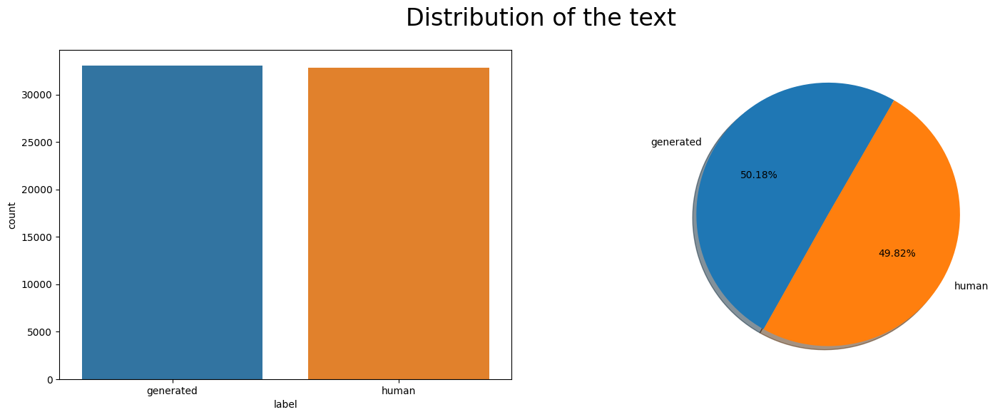

In [ ]:
# Displaying target distribution.
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(18, 6), dpi=100)
sns.countplot(data=dataset, x='label', ax=axes[0])
axes[1].pie(dataset['label'].value_counts(),
            labels=dataset['label'].value_counts().index,
            autopct='%1.2f%%',
            shadow=True,
            startangle=60)
fig.suptitle('Distribution of the text', fontsize=24)
plt.show()

**Comment:** From the plot we can see that the dataset it is balanced and it is crucial for training part of the task.

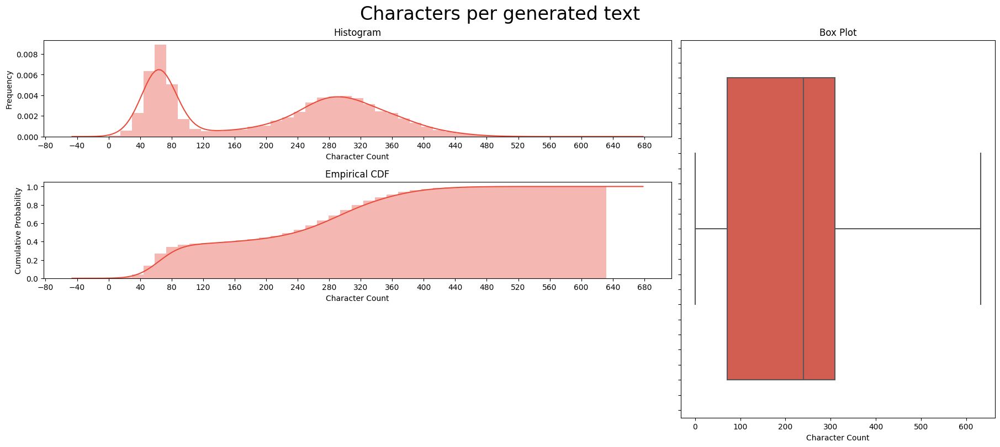

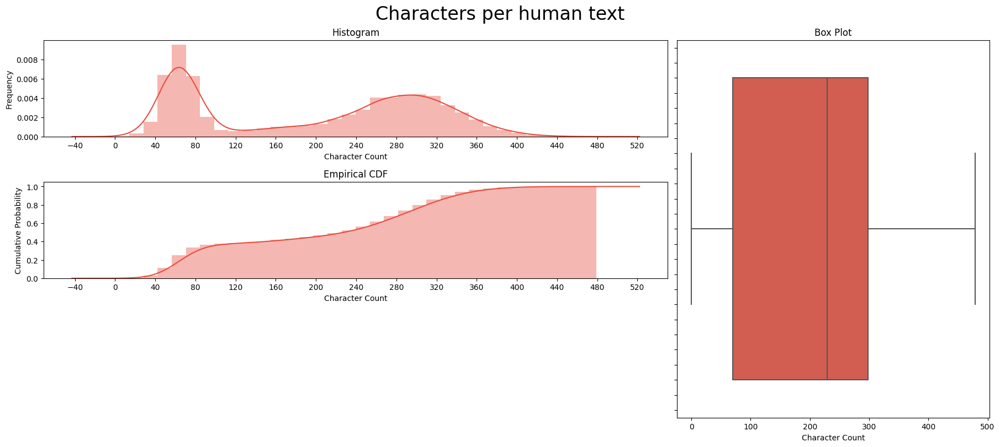

In [ ]:
dataset['Character Count'] = dataset['text_clean'].apply(lambda x: len(str(x)))
for label in classes_names:
  plot_dist3_label(dataset, label, 'Character Count', 'Characters per {} text'.format(label))

**Comment:** We can see that the average length of the text is sufficient. The generated and written texts are long enough to calculate statistics of syntactic information of the words.

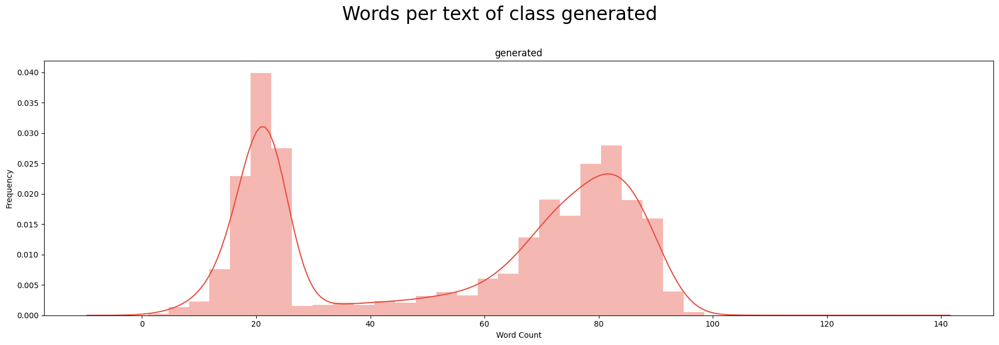

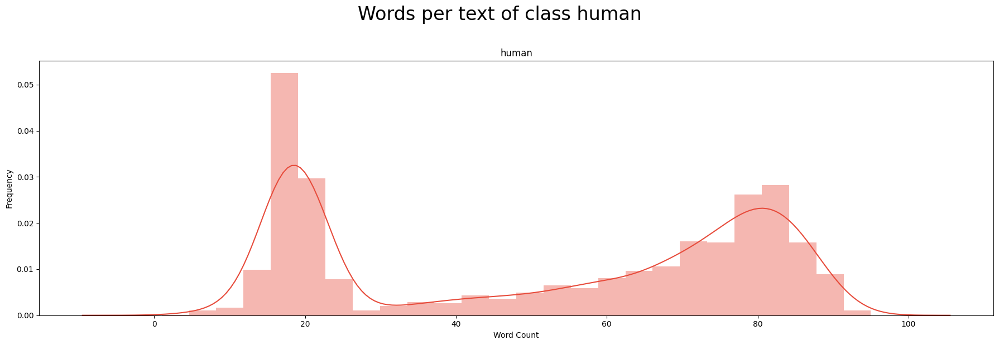

In [ ]:
for label in classes_names:
  plot_word_number_histogram(dataset[dataset['label'] == label]['text'], label)

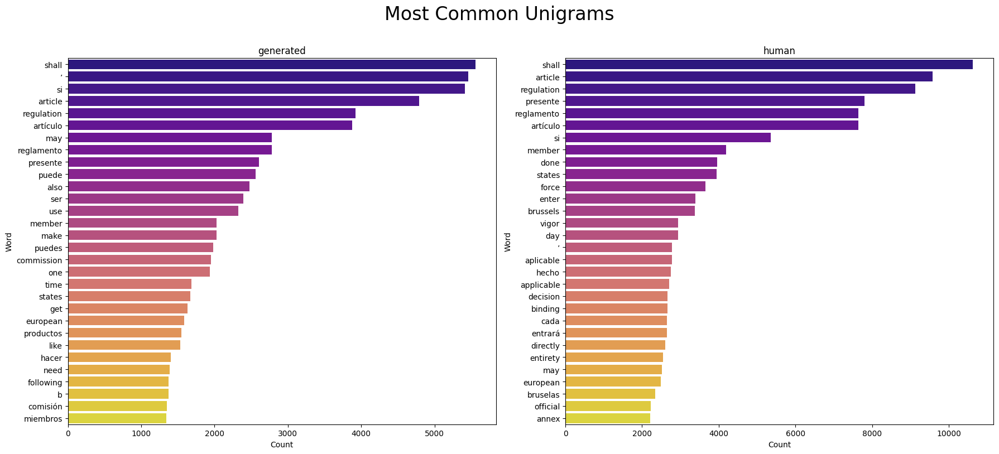

In [ ]:
unigrams(dataset, classes_names, 1, 2)

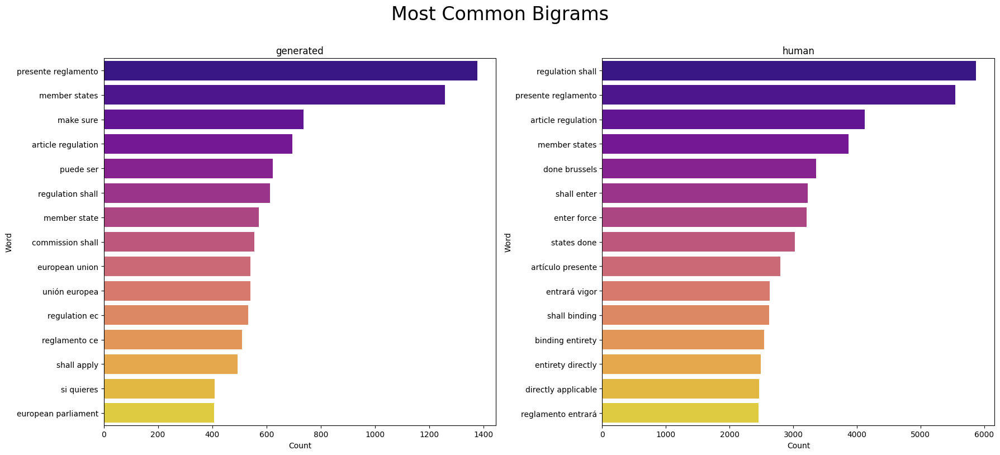

In [ ]:
ngrams(2, dataset, classes_names, 'Most Common Bigrams')

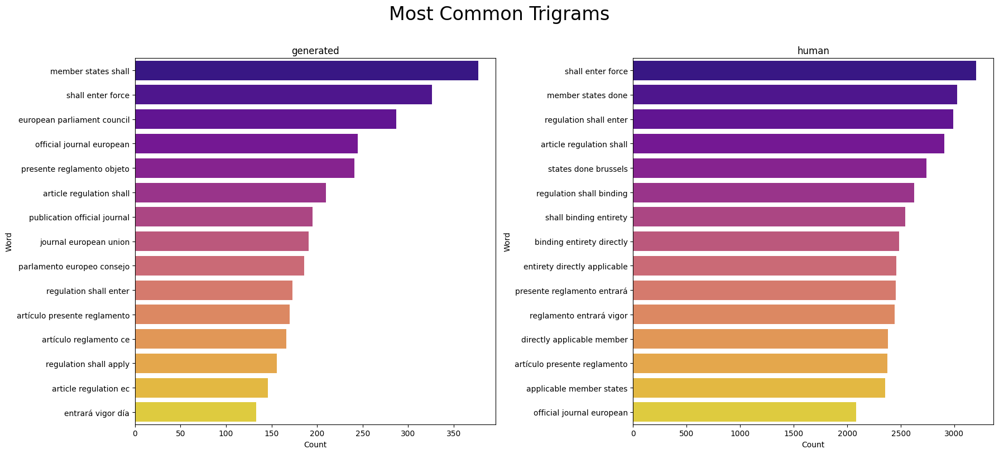

In [ ]:
ngrams(3, dataset, classes_names, 'Most Common Trigrams')

**Comment:** We can observe that some most common n-grams are  both in generated and written texts lists. The important feature is also the language of the texts that influence the common n-grams list and other syntactic information. There are some similarities and some differences that is why we decided not to remove the most common n-grams from the texts.

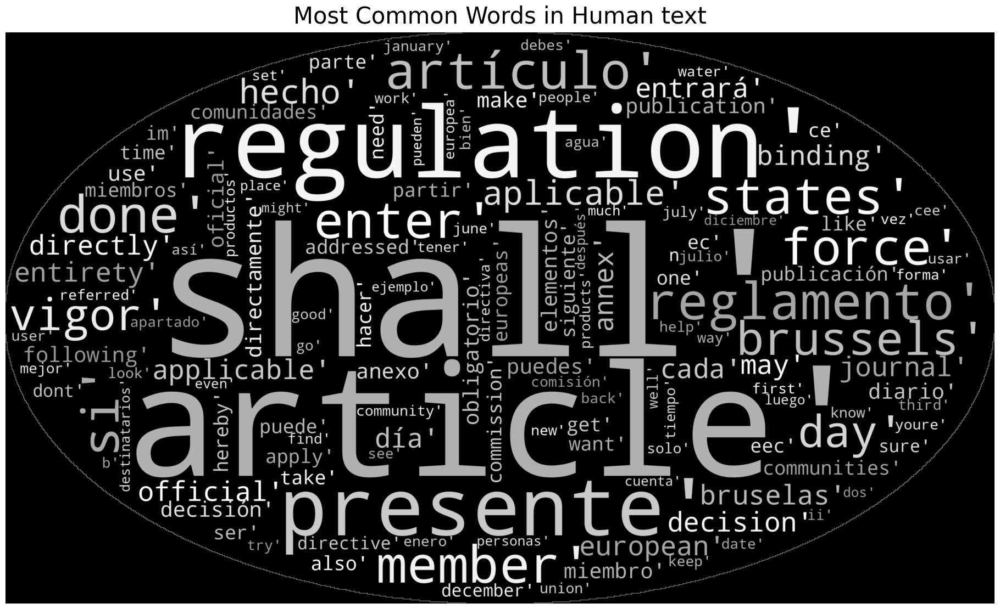

In [ ]:
plot_wordcloud(dataset[dataset['label'] == 'human']['text_clean'],
               'Most Common Words in Human text',
               title_size=30)

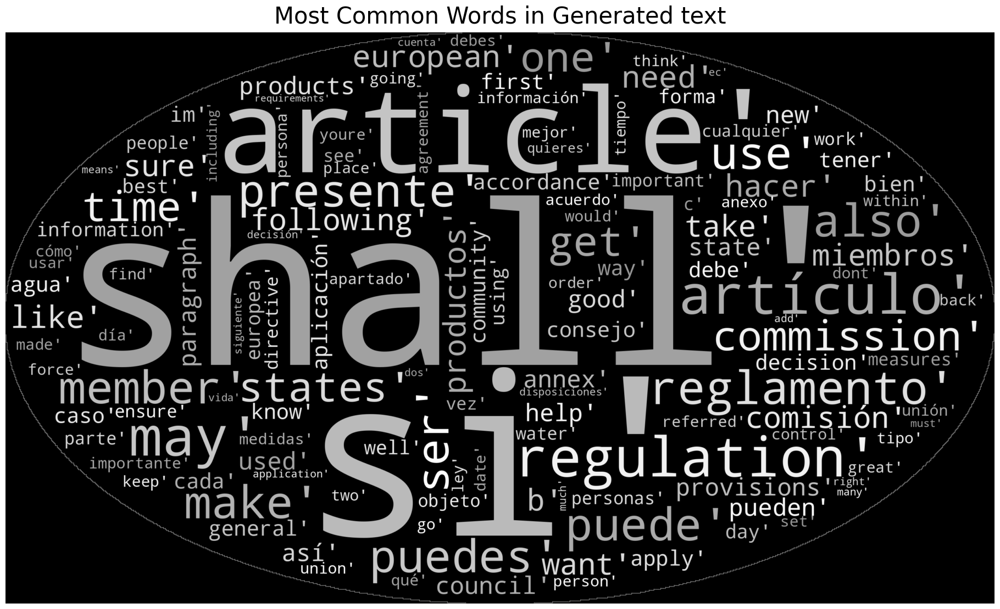

In [ ]:
plot_wordcloud(dataset[dataset['label'] == 'generated']['text_clean'],
               'Most Common Words in Generated text',
               title_size=30)

## Clustering
Even though the dataset had the information if the text was generated or not - we decided to apply clustering to the data:

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

def read_dataset(languages, dataset_dir):
  datasets = [] 
  for language in languages:
    df = pd.read_csv('{}/{}/train.tsv'.format(dataset_dir, language), sep='\t')
    df['language'] = language
    datasets.append(df)
  return pd.concat(datasets,axis=0)

def vectorize(documents):
  vectorizer = TfidfVectorizer(max_df=0.6, min_df=4)
  vectorizer.fit(documents)
  vocab = vectorizer.get_feature_names_out() 
  return vectorizer.transform(documents), vocab

#read all of en and es sentences
dataset_en_es = read_dataset(languages = ['es','en'], dataset_dir = 'subtask_1')
#read only english sentences
dataset_en = read_dataset(languages = ['en'], dataset_dir = 'subtask_1')
# classes_dict
labels = np.unique(dataset_en_es["label"])
classes_dict = dict(zip(labels, range(0,len(labels))))
classes_names = list(classes_dict.keys())
print(classes_dict)
print(classes_names)

#extracting sentences in a string format from datasets
documents_es_en = [f"{sample}" for sample in dataset_en_es["text"]]
documents_en = [f"{sample}" for sample in dataset_en["text"]]

#vectorization by TfidfVectorizer
vector_documents_en_es, vocab_en_es = vectorize(documents_es_en)
vector_documents_en, vocab_en = vectorize(documents_en)

{'generated': 0, 'human': 1}
['generated', 'human']


### K-means for 2 labels
Knowing that for subtask 1 we look for only 2 labels, we want to check if they can be really extracted from the dataset.

In [ ]:
from sklearn.cluster import KMeans

k = len(set(labels))
print(f"Number of labels {k}")

kmeans_en_es = KMeans(n_clusters=k, max_iter=100, n_init=3, verbose=True, random_state=2137)
kmeans_en_es.fit(vector_documents_en_es);

kmeans_en = KMeans(n_clusters=k, max_iter=100, n_init=3, verbose=True, random_state=2137)
kmeans_en.fit(vector_documents_en);

Number of labels 2
Initialization complete
Iteration 0, inertia 126011.65454496525.
Iteration 1, inertia 61661.486414400584.
Iteration 2, inertia 61660.758706868924.
Iteration 3, inertia 61660.756515814755.
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 128042.17172210029.
Iteration 1, inertia 61728.085775462954.
Iteration 2, inertia 61664.207492968824.
Iteration 3, inertia 61660.76614683989.
Iteration 4, inertia 61660.756515814755.
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 125223.43535806725.
Iteration 1, inertia 61661.099882660565.
Iteration 2, inertia 61660.75808924461.
Iteration 3, inertia 61660.756515814755.
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 63909.595675441975.
Iteration 1, inertia 32299.54568982793.
Iteration 2, inertia 32090.33918850775.
Iteration 3, inertia 32044.817865641322.
Iteration 4, inertia 32020.913153211324.
Iteration 5, 

In [ ]:
print("Top terms per cluster for both languages:")

for i in range(kmeans_en_es.n_clusters):
    centroid = kmeans_en_es.cluster_centers_[i]    
    sorted_terms = centroid.argsort()[::-1]
    print(f"Cluster {i}:\t{[vocab_en_es[j] for j in sorted_terms[:10]]}")

print("Top terms per cluster for english dataset:")

for i in range(kmeans_en.n_clusters):
    centroid = kmeans_en.cluster_centers_[i]    
    sorted_terms = centroid.argsort()[::-1]
    print(f"Cluster {i}:\t{[vocab_en[j] for j in sorted_terms[:10]]}")

Top terms per cluster for both languages:
Cluster 0:	['de', 'el', 'la', 'en', 'que', 'los', 'del', 'se', 'las', 'para']
Cluster 1:	['the', 'to', 'of', 'in', 'and', 'you', 'this', 'is', 'shall', 'for']
Top terms per cluster for english dataset:
Cluster 0:	['you', 'your', 'in', 'it', 'is', 'for', 'that', 'or', 'this', 'be']
Cluster 1:	['regulation', 'shall', 'article', 'in', 'this', 'its', 'force', 'member', 'states', 'enter']


In [ ]:
### visualization

from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import TruncatedSVD

def truncate(vector):
  svd = TruncatedSVD(3)
  reduced_data = svd.fit_transform(vector)
  svd = TruncatedSVD(2)
  reduced_data_2D = svd.fit_transform(vector)
  [x,y,z] = np.transpose(reduced_data)
  [x2,y2] = np.transpose(reduced_data_2D)
  return [x,y,z], [x2,y2]


[x_en_es,y_en_es,z_en_es], [x_en_es_2,y_en_es_2] = truncate(vector_documents_en_es)
[x_en,y_en,z_en], [x_en_2,y_en_2] = truncate(vector_documents_en)

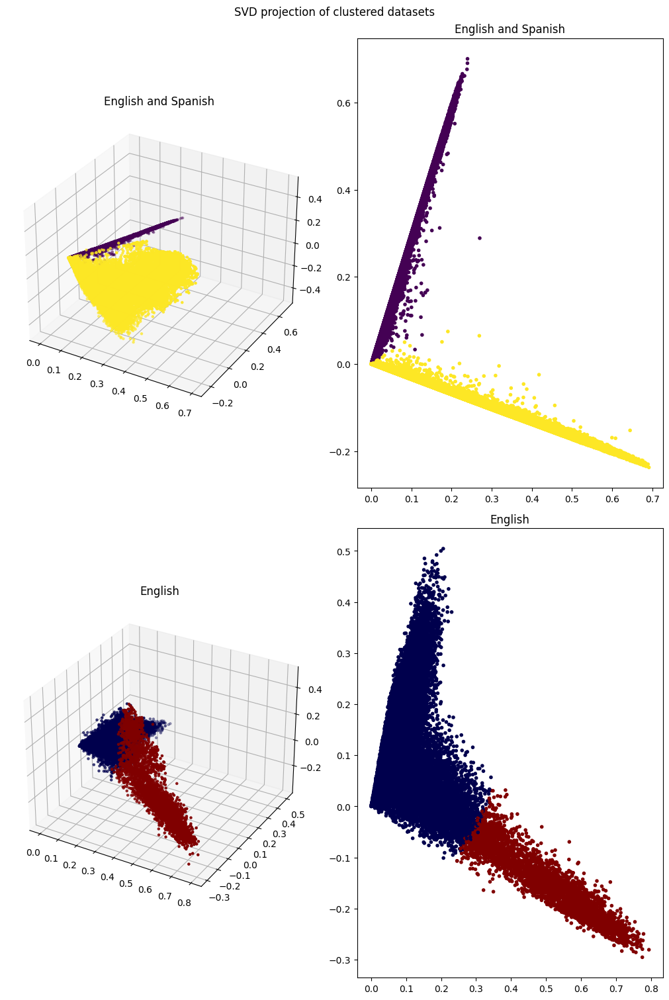

In [ ]:
fig = plt.figure(layout="constrained", figsize=(10,15))
ax = fig.subplot_mosaic('''ab
                          cd''', per_subplot_kw={
        "a": {"projection": "3d"},
        "c": {"projection": "3d"}
        })

fig.suptitle('SVD projection of clustered datasets')
ax["a"].scatter(x_en_es, y_en_es, z_en_es, c=kmeans_en_es.labels_, marker='.');
ax['a'].title.set_text('English and Spanish')
ax["b"].scatter(x_en_es_2,y_en_es_2, c=kmeans_en_es.labels_, marker='.');
ax['b'].title.set_text('English and Spanish')
ax["c"].scatter(x_en, y_en, z_en, c=kmeans_en.labels_, marker='.', cmap = "seismic");
ax['c'].title.set_text('English')
ax["d"].scatter(x_en_2,y_en_2, c=kmeans_en.labels_, marker='.',  cmap = "seismic");
ax['d'].title.set_text('English')

**Comment:** In the first 2 charts we can see that the clustering may depend on the language of the text. We rerun the clustering again only for English texts and were able to distinguish 2 classes.

### Topic modeling for 2 labels

Also only for english data set we want to check how many different topics can be extracted from text samples.

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


No. training docs: 23691
No. testing docs: 10154
iteration: 1 of max_iter: 50
iteration: 2 of max_iter: 50
iteration: 3 of max_iter: 50
iteration: 4 of max_iter: 50
iteration: 5 of max_iter: 50
iteration: 6 of max_iter: 50
iteration: 7 of max_iter: 50
iteration: 8 of max_iter: 50
iteration: 9 of max_iter: 50
iteration: 10 of max_iter: 50
iteration: 11 of max_iter: 50
iteration: 12 of max_iter: 50
iteration: 13 of max_iter: 50
iteration: 14 of max_iter: 50
iteration: 15 of max_iter: 50
iteration: 16 of max_iter: 50
iteration: 17 of max_iter: 50
iteration: 18 of max_iter: 50
iteration: 19 of max_iter: 50
iteration: 20 of max_iter: 50
iteration: 21 of max_iter: 50
iteration: 22 of max_iter: 50
iteration: 23 of max_iter: 50
iteration: 24 of max_iter: 50
iteration: 25 of max_iter: 50
iteration: 26 of max_iter: 50
iteration: 27 of max_iter: 50
iteration: 28 of max_iter: 50
iteration: 29 of max_iter: 50
iteration: 30 of max_iter: 50
iteration: 31 of max_iter: 50
iteration: 32 of max_iter: 50


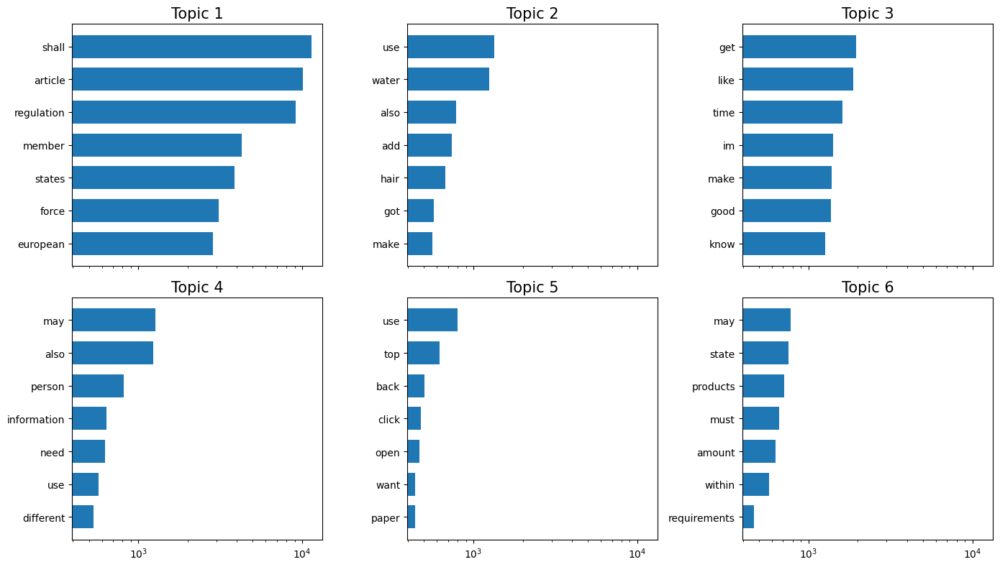

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
import re, string
from nltk.tokenize import word_tokenize


stopword_en = nltk.corpus.stopwords.words('english')
stopword_es = nltk.corpus.stopwords.words('spanish')
stopword = set(stopword_en + stopword_es)
def clean_data(df):
      def clean(text):
            '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
            and remove words containing numbers.'''
            text = text.lower()
            text = re.sub('\[.*?\]', '', text)
            text = re.sub('https?://\S+|www\.\S+', '', text)
            text = re.sub('<.*?>+', '', text)
            text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
            text = re.sub('\n', '', text)
            text = re.sub('\w*\d\w*', '', text)
            return text
      # Applying the cleaning function to both test and training datasets
      df['text_clean'] = df['text'].apply(lambda x: clean(x))
      df['text_clean'] = df['text_clean'].apply(word_tokenize)
      df['text_clean'] = df['text_clean'].apply(lambda x: [word for word in x if word not in stopword])
      df['text_clean'] = [' '.join(map(str, word)) for word in df['text_clean']]
      return df

from sklearn.model_selection import train_test_split


dataset_en = read_dataset(languages = ['en'], dataset_dir = 'subtask_1')
clean_data(dataset_en)
labels_for_split = [f"{sample}" for sample in dataset_en["label"]]
documents_en = [f"{sample}" for sample in dataset_en["text_clean"]]


documents_train, documents_test, label_train, label_test = train_test_split(documents_en, labels_for_split, test_size=0.3)
print('No. training docs:', len(documents_train))
print('No. testing docs:', len(documents_test))

from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(min_df=4,max_df=.6)
vector_documents_train = vectorizer.fit_transform(documents_train)

vocab = vectorizer.get_feature_names_out()
len(vocab)

#LDA

from sklearn.decomposition import LatentDirichletAllocation

lda = LatentDirichletAllocation(n_components=6, verbose=1, learning_method='online', max_iter=50)
lda.fit(vector_documents_train);

vector_documents_test = vectorizer.transform(documents_test)
lda.perplexity(vector_documents_test)


num_words = 7
cols = 3
rows = 2

fig, axes = plt.subplots(rows, cols, figsize=(14, 4 * rows), sharex=True)
axes = axes.flatten()
for topic_idx, topic in enumerate(lda.components_):
    top_terms_index = topic.argsort()[:-num_words - 1:-1]
    top_terms = [vocab[i] for i in top_terms_index]
    weights = topic[top_terms_index]
    ax = axes[topic_idx]
    ax.barh(top_terms, weights, height=0.7)
    ax.set_title(f'Topic {topic_idx +1}',fontdict={'fontsize': 15})
    ax.invert_yaxis()
    ax.set_xscale('log')

plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
plt.tight_layout()
plt.show()

## ML Classifiers

First we present simple machine learning classifiers: Logistic Regression, Naive Bayes, Random Forest and XGBoost. Each model is learned on features extracted during the data preprocessing.

### Convert text to feature vector

In [ ]:
# x: original text
# x_lemma: lemmatized text
# x_clean: cleaned text (lemmatized + cleaning i.d. remove stopwords, punctuations, some numbers)
# x_pos: text with pos appended through _
# x_with_additional_feature: pos-tagged text with additional features included

y = np.asarray(dataset['label']=='generated').astype(int)
x=dataset.text
x_lemma=dataset.text_pos.apply(lambda i: ' '.join([str(j[2]) for j in i]))
x_clean=dataset.text_clean_pos.apply(lambda i: ' '.join([str(j[2]) for j in i]))
x_pos=dataset.text_pos.apply(lambda i: ' '.join([str(j[2])+'_'+str(j[1])for j in i]))
x_with_additional_feature=np.array([[i]+MyCustomFeatures.extract_custom_features(MyCustomFeatures(),i) for i in tqdm(x_pos)])
len(x),len(x_lemma),len(x_clean),len(x_pos),x_with_additional_feature.shape,len(y)

  0%|          | 0/65907 [00:00<?, ?it/s]

(65907, 65907, 65907, 65907, (65907, 3), 65907)

In [ ]:
# Split into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size=0.2, random_state=seed)
x_lemma_train, x_lemma_test, y_train, y_test = train_test_split(x_lemma, y,test_size=0.2, random_state=seed)
x_clean_train, x_clean_test, y_train, y_test = train_test_split(x_clean, y,test_size=0.2, random_state=seed)
x_pos_train, x_pos_test, y_train, y_test = train_test_split(x_pos, y,test_size=0.2, random_state=seed)
x_waf_train, x_waf_test, y_train, y_test = train_test_split(x_with_additional_feature, y,test_size=0.2, random_state=seed)

In [ ]:
# Feed train_data and test_data to a chosen vectorizer
def vectorize(train_data,test_data,vectorizer):
    vectorizer.fit(train_data)
    train_vector=vectorizer.transform(train_data)
    test_vector=vectorizer.transform(test_data)
    return train_vector,test_vector

In [ ]:
def my_preprocessor(doc):
  # Should do POS here, but too slow!, no
  return MyCustomFeatures.remove_punctuation(None,doc)

customized_vectorizer = FeatureUnion([
  ('custom', MyCustomFeatures()),
  ('cv', TfidfVectorizer(preprocessor=my_preprocessor)),
  # ('cv', CountVectorizer(preprocessor=my_preprocessor))
])

count_vectorizer = CountVectorizer()
tfidf_vectorizer = TfidfVectorizer(min_df=2, max_df=0.5, ngram_range=(1, 2))

In [ ]:
# Train and evaluate the model, plot the confusion matrix
def evaluate(model,train_data,train_label,test_data,test_label,path=None):
    model.fit(train_data,train_label)
    pred_y = model.predict(test_data)
    print(sklearn.metrics.classification_report(test_label, pred_y))
    cm = confusion_matrix(test_label, pred_y, normalize='true')

    # Plot the confusion matrix
    plt.figure(figsize=(8,6))
    sns.heatmap(cm.T, annot=True, xticklabels=classes_names, yticklabels=classes_names)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.show()
    if path is not None:
        pickle.dump(model,open(path,'wb'))

### Logistic Regression

#### Base Case: with original data vector

              precision    recall  f1-score   support

           0       0.78      0.77      0.78      6554
           1       0.78      0.79      0.78      6628

    accuracy                           0.78     13182
   macro avg       0.78      0.78      0.78     13182
weighted avg       0.78      0.78      0.78     13182



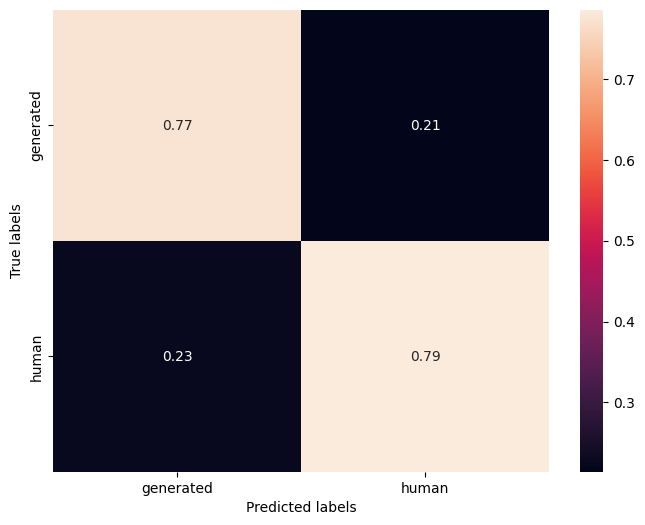

In [ ]:
# with CountVectorizer
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_train,x_test,count_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

              precision    recall  f1-score   support

           0       0.81      0.78      0.80      6554
           1       0.79      0.82      0.81      6628

    accuracy                           0.80     13182
   macro avg       0.80      0.80      0.80     13182
weighted avg       0.80      0.80      0.80     13182



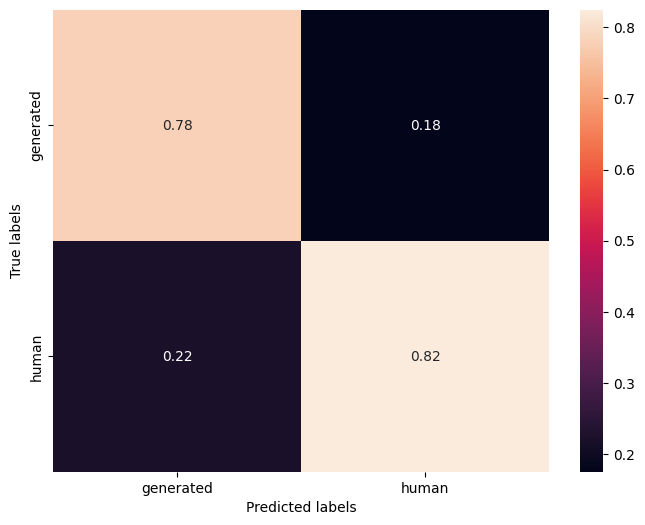

In [ ]:
# with TFIDFVectorizer
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_train,x_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

              precision    recall  f1-score   support

           0       0.79      0.77      0.78      6554
           1       0.77      0.80      0.78      6628

    accuracy                           0.78     13182
   macro avg       0.78      0.78      0.78     13182
weighted avg       0.78      0.78      0.78     13182



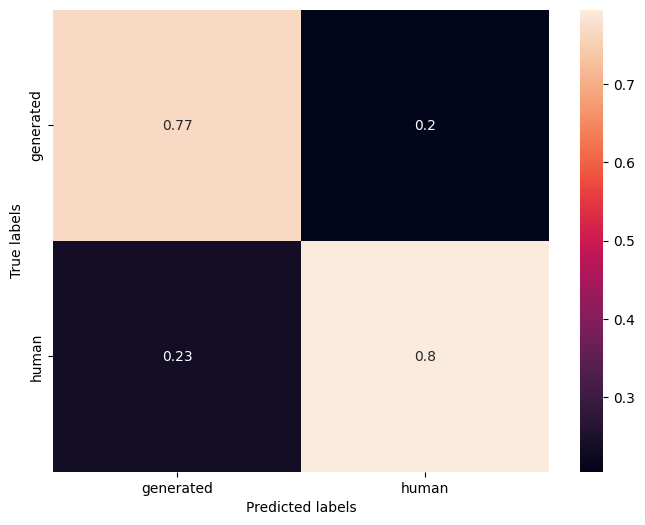

In [ ]:
# with CustomizedVectorizer
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_train,x_test,customized_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

#### Advanced: with preprocessed data

              precision    recall  f1-score   support

           0       0.77      0.74      0.76      6554
           1       0.75      0.78      0.77      6628

    accuracy                           0.76     13182
   macro avg       0.76      0.76      0.76     13182
weighted avg       0.76      0.76      0.76     13182



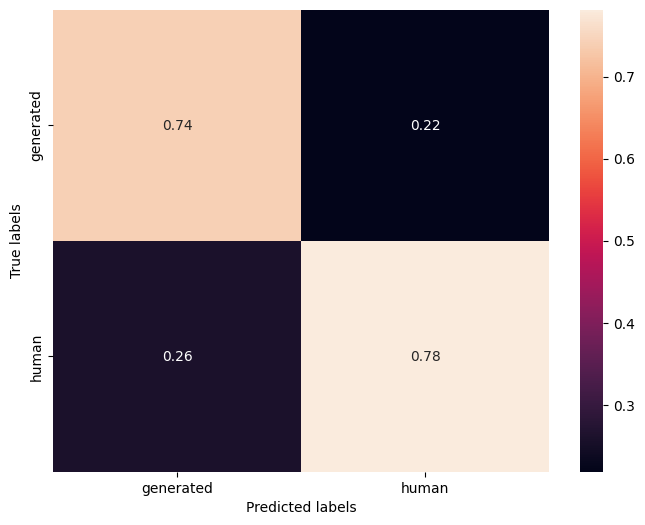

In [ ]:
# with cleaned data
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_clean_train,x_clean_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

              precision    recall  f1-score   support

           0       0.81      0.78      0.79      6554
           1       0.79      0.82      0.80      6628

    accuracy                           0.80     13182
   macro avg       0.80      0.80      0.80     13182
weighted avg       0.80      0.80      0.80     13182



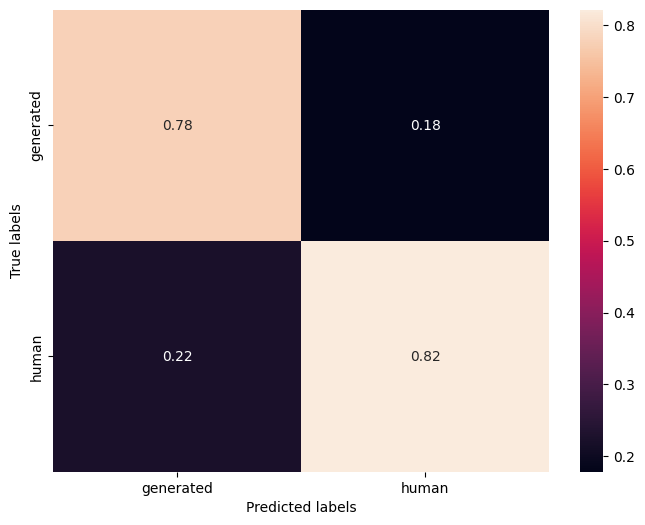

In [ ]:
# with lemmatized data
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_lemma_train,x_lemma_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

              precision    recall  f1-score   support

           0       0.82      0.79      0.81      6554
           1       0.80      0.83      0.82      6628

    accuracy                           0.81     13182
   macro avg       0.81      0.81      0.81     13182
weighted avg       0.81      0.81      0.81     13182



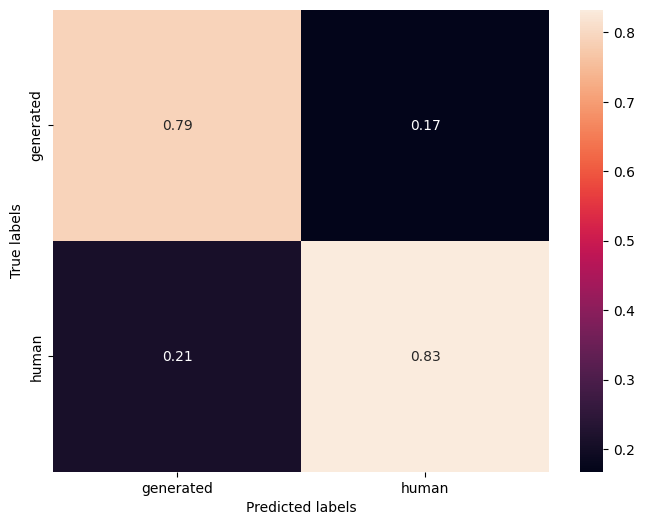

In [ ]:
# data with postag
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_pos_train,x_pos_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

              precision    recall  f1-score   support

           0       0.82      0.79      0.80      6554
           1       0.80      0.83      0.81      6628

    accuracy                           0.81     13182
   macro avg       0.81      0.81      0.81     13182
weighted avg       0.81      0.81      0.81     13182



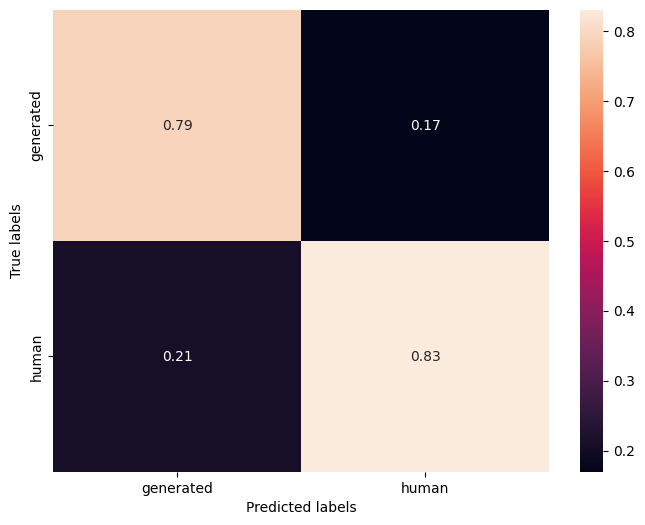

In [ ]:
# data with additional features:
from scipy.sparse import hstack
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_waf_train[:,0],x_waf_test[:,0],tfidf_vectorizer)
train_vector=hstack((train_vector,x_waf_train[:,1:].astype(np.float64)))
test_vector=hstack((test_vector,x_waf_test[:,1:].astype(np.float64)))
evaluate(model,train_vector,y_train,test_vector,y_test)

**Observations:** Model trained on the data with POS tags performs better, so we basically choose to use the POS-tagged dataset in training the next models. 

### Naive Bayes

              precision    recall  f1-score   support

           0       0.84      0.59      0.69      6554
           1       0.69      0.89      0.77      6628

    accuracy                           0.74     13182
   macro avg       0.76      0.74      0.73     13182
weighted avg       0.76      0.74      0.74     13182



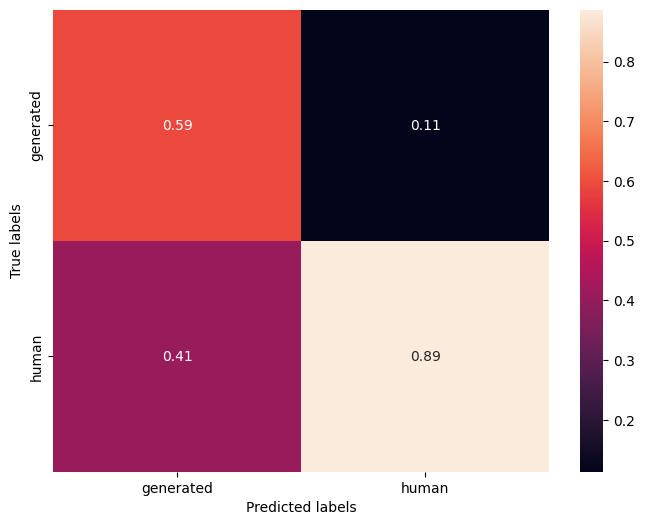

In [ ]:
# with TFIDFVectorizer
model=MultinomialNB()
train_vector,test_vector=vectorize(x_pos_train,x_pos_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

### RandomForest

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 196 tasks      | elapsed:  9.3min
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed: 19.6min finished
[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done  46 tasks      | elapsed:    0.5s
[Parallel(n_jobs=2)]: Done 196 tasks      | elapsed:    2.1s
[Parallel(n_jobs=2)]: Done 400 out of 400 | elapsed:    4.3s finished


              precision    recall  f1-score   support

           0       0.82      0.80      0.81      6554
           1       0.81      0.83      0.82      6628

    accuracy                           0.81     13182
   macro avg       0.82      0.81      0.81     13182
weighted avg       0.82      0.81      0.81     13182



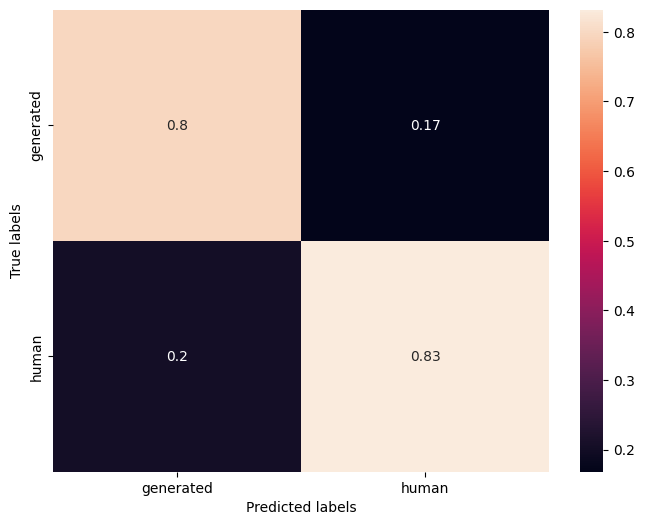

In [ ]:
model=RandomForestClassifier(n_estimators =400,criterion="entropy",random_state =seed,verbose=1,n_jobs=-1)
train_vector,test_vector=vectorize(x_pos_train,x_pos_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

### XGBoost

              precision    recall  f1-score   support

           0       0.80      0.83      0.82      6554
           1       0.83      0.80      0.81      6628

    accuracy                           0.81     13182
   macro avg       0.81      0.81      0.81     13182
weighted avg       0.81      0.81      0.81     13182



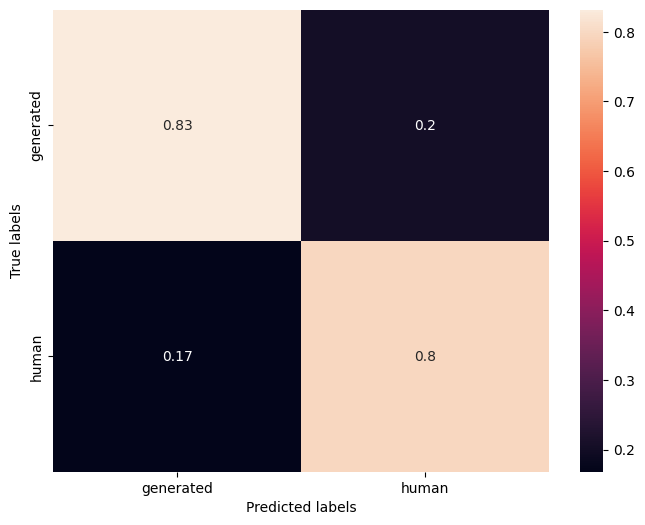

In [ ]:
model=xgb.XGBClassifier(n_estimators=400, colsample_bytree=0.8,
                        subsample=0.8, nthread=10, learning_rate=0.1)
train_vector,test_vector=vectorize(x_pos_train,x_pos_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

### **Results for Simple Classifiers**

**ML classifiers for detecting generated or human text:**

The model is performing less accurate with preprocessed/clean data. That leads us to an assumption that number of stopwords, punctuation statistics etc. are important for distinguish human/generated texts.

The worst performing model was Naive Bayes - it does not perform well for precision for detecting the generated text.
Other models provide more or less the same level of performance (taking into account the size of dataset the accuracy around 80% and around 80% precision or recall are a sufficient results)


## Recurrent Neural Networks

### Data preparation
In the data preparation phase we clean the texts, lemmatize, add POS tagging to prepare several versions of the dataset. We are then comparing the model performance on these different versions of data to check the results.

In [ ]:
y = np.asarray(dataset['label']=='generated').astype(int)
x=dataset.text
x_lemma=dataset.text_pos.apply(lambda i: ' '.join([str(j[2]) for j in i]))
x_clean=dataset.text_clean_pos.apply(lambda i: ' '.join([str(j[2]) for j in i]))
x_pos=dataset.text_pos.apply(lambda i: ' '.join([str(j[2])+'_'+str(j[1])for j in i]))
x_with_additional_feature=np.array([[i]+MyCustomFeatures.extract_custom_features(MyCustomFeatures(),i) for i in tqdm(x_pos)])
print(len(x),len(x_lemma),len(x_clean),len(x_pos),x_with_additional_feature.shape,len(y))
print(max([len(obj.split(" ")) for obj in x_pos]))


# Split into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size=0.2, random_state=seed)
x_lemma_train, x_lemma_test, y_train, y_test = train_test_split(x_lemma, y,test_size=0.2, random_state=seed)
x_clean_train, x_clean_test, y_train, y_test = train_test_split(x_clean, y,test_size=0.2, random_state=seed)
x_pos_train, x_pos_test, y_train, y_test = train_test_split(x_pos, y,test_size=0.2, random_state=seed)
x_waf_train, x_waf_test, y_train, y_test = train_test_split(x_with_additional_feature, y,test_size=0.2, random_state=seed)

In [ ]:
# from tensorflow.keras.layers import TextVectorization
# https://www.tensorflow.org/tutorials/keras/text_classification
def custom_standardization(input_data):
  # POS, but too slow so stick to old method
  # processed = tf.strings.lower(input_data)
  processed = tf.strings.regex_replace(input_data,'[%s]' % re.escape(string.punctuation),'')
  processed = input_data
  return processed

def vectorize(train_data,test_data,max_len = 200):
    token = text.Tokenizer(num_words=None)
    token.fit_on_texts(list(train_data) + list(test_data))
    xtrain_seq = token.texts_to_sequences(train_data)
    xvalid_seq = token.texts_to_sequences(test_data)

    #zero pad the sequences
    xtrain_pad = sequence.pad_sequences(xtrain_seq, maxlen=max_len)
    xvalid_pad = sequence.pad_sequences(xvalid_seq, maxlen=max_len)
    return xtrain_pad,xvalid_pad, token.word_index

optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4)
loss=tf.keras.losses.BinaryCrossentropy(from_logits=True)


def evaluate(model,train_data,train_label,test_data,test_label,path=None,batch_size=128,patience=1,epochs=10):
    history=model.fit(train_data,train_label,epochs=epochs, batch_size=batch_size,validation_data=(test_data,test_label)).history
    plt.figure(figsize=(15,5))
    plt.plot(history['loss'], label='Training', alpha=.8, color='#ff7f0e')
    plt.plot(history['val_loss'], label='Validation', alpha=.8, color='#3A27ED')
    plt.legend(loc='upper left')
    plt.title('Binary Crossentropy')
    plt.grid(alpha=.3)
    plt.figure(figsize=(15,5))
    plt.plot(history['accuracy'], label='Training', alpha=.8, color='#ff7f0e')
    plt.plot(history['val_accuracy'], label='Validation', alpha=.8, color='#3A27ED')
    plt.legend(loc='upper left')
    plt.title('Accuracy')
    plt.grid(alpha=.3)
    plt.show()
    pred_y = model.predict(test_data)
    pred_y = [0 if pred < 0.5 else 1 for pred in pred_y]
    print(sklearn.metrics.classification_report(test_label, pred_y))
    cm = confusion_matrix(test_label, pred_y, normalize='true')
    # Plot the confusion matrix
    plt.figure(figsize=(8,6))
    sns.heatmap(cm.T, annot=True, xticklabels=classes_names, yticklabels=classes_names)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.show()
    if path is not None:
        model.save(path)

In [ ]:
train_vector,test_vector,word_index =vectorize(x_train,x_test)

### LSTM
A very simple RNN network is prepared with a single layer of LSTM having 64 units, followed by the Dense layer for the output.

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, None, 64)          5949440   
                                                                 
 lstm (LSTM)                 (None, 64)                33024     
                                                                 
 dense (Dense)               (None, 1)                 65        
                                                                 
Total params: 5,982,529
Trainable params: 5,982,529
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
412/412 [==============================] - 10s 19ms/step - loss: 0.6153 - accuracy: 0.6531 - val_loss: 0.5146 - val_accuracy: 0.7385
Epoch 2/20
412/412 [==============================] - 8s 20ms/step - loss: 0.4504 - accuracy: 0.7811 - val_loss: 0.4523 - val_accuracy: 0.7704
Epoch 3/20
412/412 [===

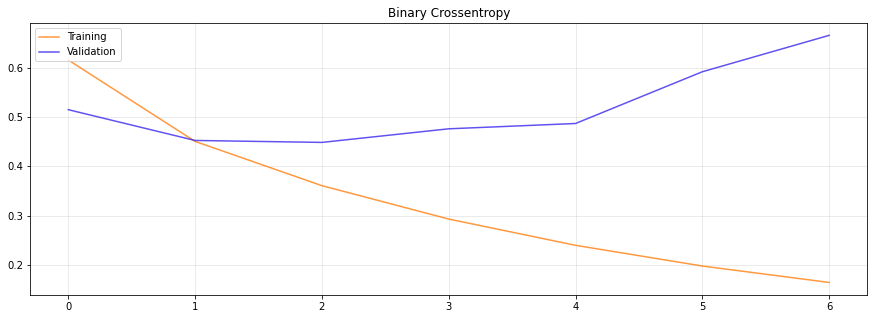

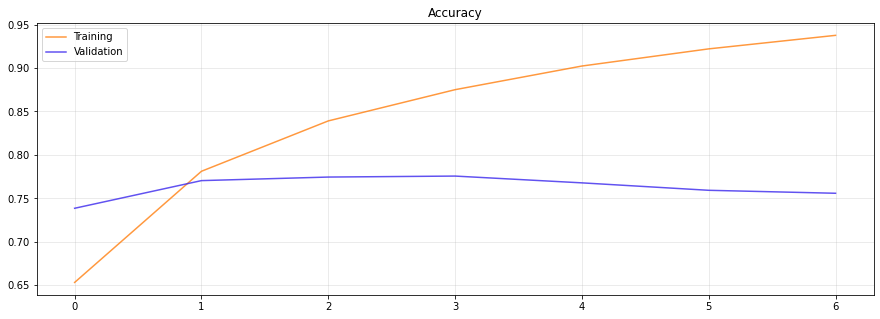

412/412 [==============================] - 2s 3ms/step
              precision    recall  f1-score   support

           0       0.77      0.79      0.78      6554
           1       0.78      0.77      0.77      6628

    accuracy                           0.78     13182
   macro avg       0.78      0.78      0.78     13182
weighted avg       0.78      0.78      0.78     13182



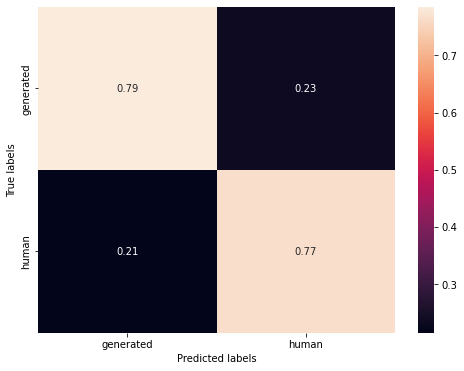

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### RNN
Here a simpleRNN layer has been adopted.

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, None, 64)          5949440   
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 64)                8256      
                                                                 
 dense_2 (Dense)             (None, 1)                 65        
                                                                 
Total params: 5,957,761
Trainable params: 5,957,761
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
412/412 [==============================] - 113s 273ms/step - loss: 0.5377 - accuracy: 0.7107 - val_loss: 0.4547 - val_accuracy: 0.7766
Epoch 2/20
412/412 [==============================] - 115s 278ms/step - loss: 0.3339 - accuracy: 0.8548 - val_loss: 0.4239 - val_accuracy: 0.7987
Epoch 3/20
412/4

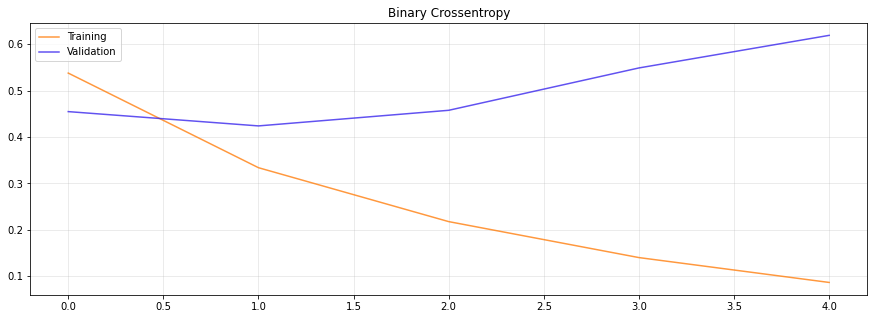

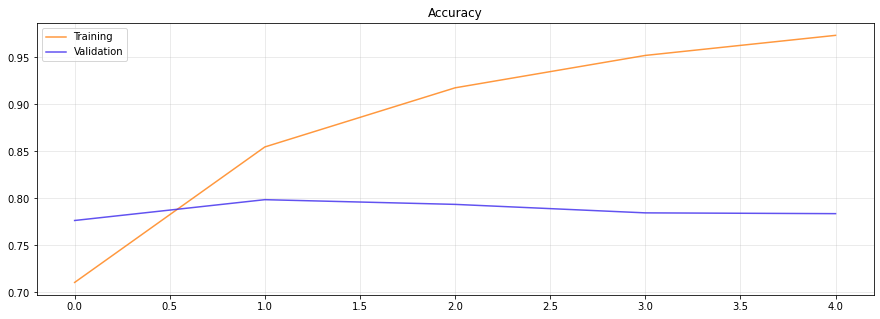

412/412 [==============================] - 18s 43ms/step
              precision    recall  f1-score   support

           0       0.79      0.80      0.80      6554
           1       0.80      0.79      0.80      6628

    accuracy                           0.80     13182
   macro avg       0.80      0.80      0.80     13182
weighted avg       0.80      0.80      0.80     13182



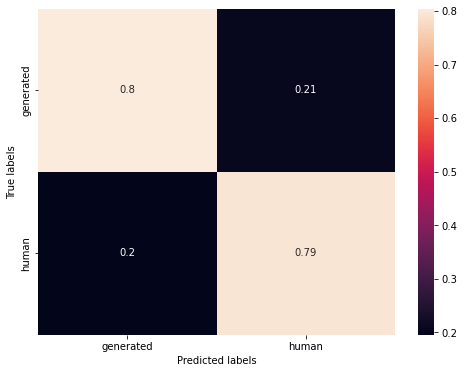

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.SimpleRNN(64),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### GRU

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_3 (Embedding)     (None, None, 64)          5949440   
                                                                 
 gru (GRU)                   (None, 64)                24960     
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 5,974,465
Trainable params: 5,974,465
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
412/412 [==============================] - 9s 19ms/step - loss: 0.5159 - accuracy: 0.7198 - val_loss: 0.4336 - val_accuracy: 0.7851
Epoch 2/20
412/412 [==============================] - 7s 18ms/step - loss: 0.3475 - accuracy: 0.8434 - val_loss: 0.4256 - val_accuracy: 0.7921
Epoch 3/20
412/412 [==

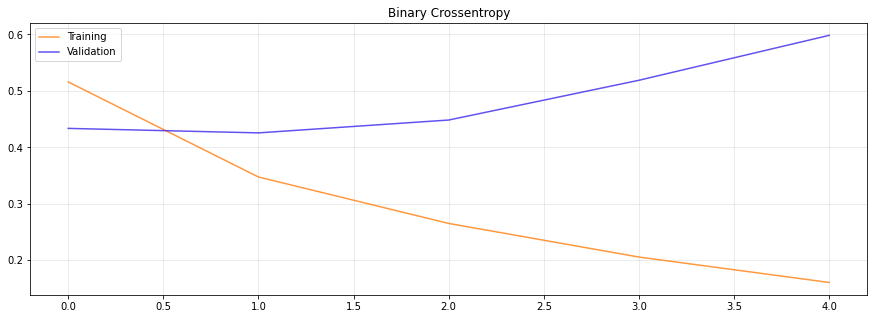

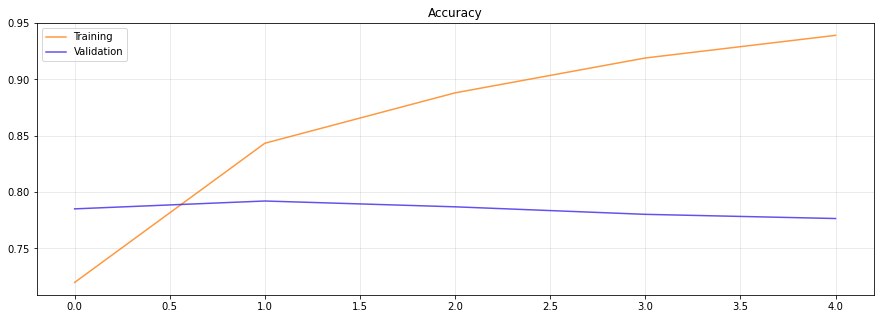

412/412 [==============================] - 1s 3ms/step
              precision    recall  f1-score   support

           0       0.77      0.83      0.80      6554
           1       0.82      0.76      0.79      6628

    accuracy                           0.79     13182
   macro avg       0.79      0.79      0.79     13182
weighted avg       0.79      0.79      0.79     13182



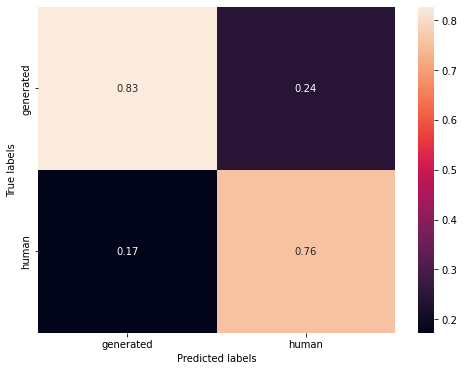

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.GRU(64),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### Bidirectional LSTM

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_4 (Embedding)     (None, None, 64)          5949440   
                                                                 
 bidirectional (Bidirectiona  (None, 128)              66048     
 l)                                                              
                                                                 
 dense_4 (Dense)             (None, 1)                 129       
                                                                 
Total params: 6,015,617
Trainable params: 6,015,617
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
412/412 [==============================] - 13s 29ms/step - loss: 0.5279 - accuracy: 0.7145 - val_loss: 0.4490 - val_accuracy: 0.7767
Epoch 2/20
412/412 [==============================] - 11s 28ms/step - loss: 0.3642 - accuracy: 0.8

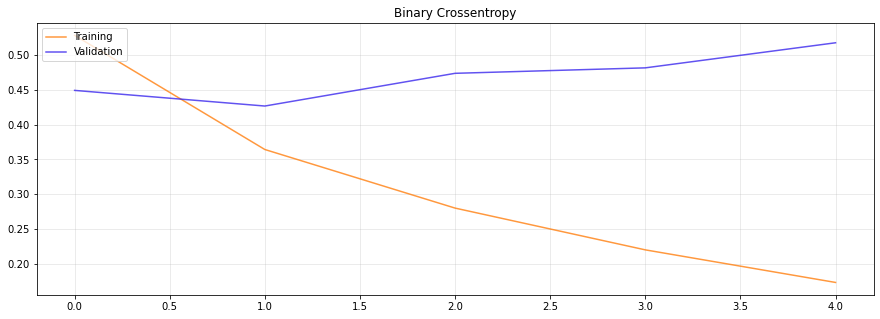

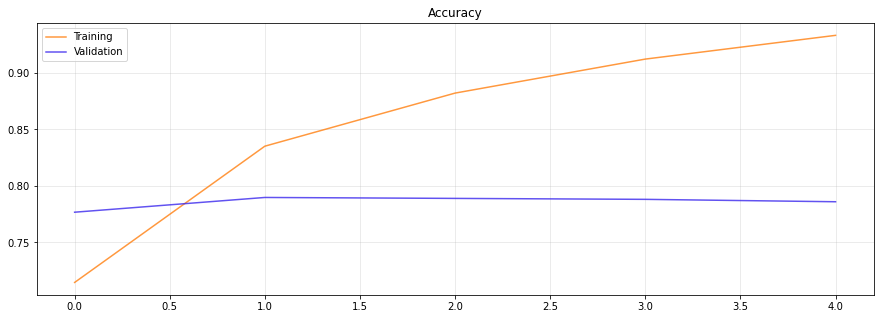

412/412 [==============================] - 3s 5ms/step
              precision    recall  f1-score   support

           0       0.79      0.78      0.79      6554
           1       0.79      0.80      0.79      6628

    accuracy                           0.79     13182
   macro avg       0.79      0.79      0.79     13182
weighted avg       0.79      0.79      0.79     13182



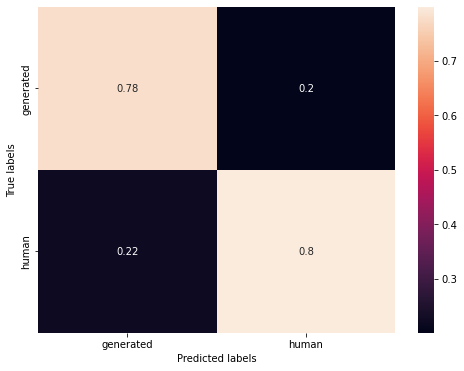

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### Training with preprocessed data
In this section, we are training the models using different versions of the dataset to compare their performance.

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_5 (Embedding)     (None, None, 64)          4452288   
                                                                 
 bidirectional_1 (Bidirectio  (None, 128)              66048     
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 1)                 129       
                                                                 
Total params: 4,518,465
Trainable params: 4,518,465
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
412/412 [==============================] - 14s 30ms/step - loss: 0.5536 - accuracy: 0.6893 - val_loss: 0.4983 - val_accuracy: 0.7357
Epoch 2/20
412/412 [==============================] - 11s 27ms/step - loss: 0.4191 - accuracy: 0.8

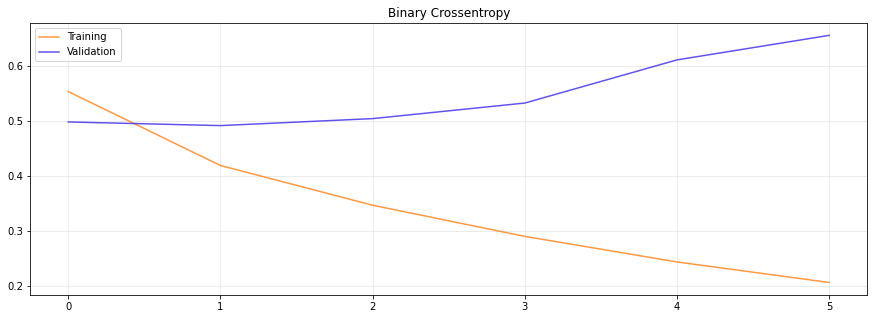

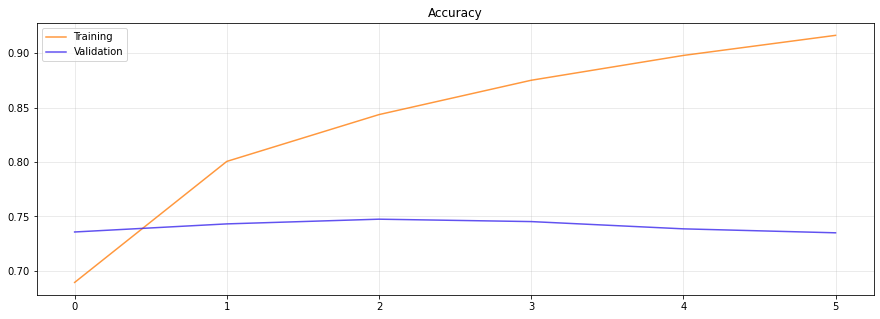

412/412 [==============================] - 3s 5ms/step
              precision    recall  f1-score   support

           0       0.74      0.75      0.75      6554
           1       0.75      0.74      0.75      6628

    accuracy                           0.75     13182
   macro avg       0.75      0.75      0.75     13182
weighted avg       0.75      0.75      0.75     13182



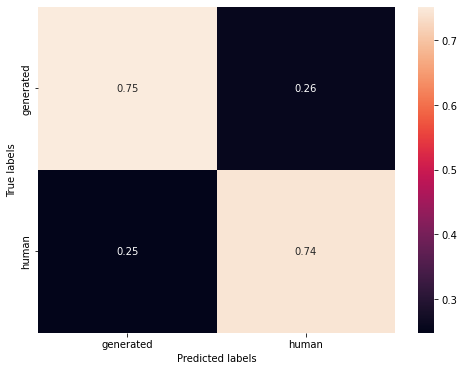

In [ ]:
# Training with cleaned text
train_vector,test_vector,word_index = vectorize(x_clean_train,x_clean_test)

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_6 (Embedding)     (None, None, 64)          4633536   
                                                                 
 bidirectional_2 (Bidirectio  (None, 128)              66048     
 nal)                                                            
                                                                 
 dense_6 (Dense)             (None, 1)                 129       
                                                                 
Total params: 4,699,713
Trainable params: 4,699,713
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
412/412 [==============================] - 12s 25ms/step - loss: 0.5322 - accuracy: 0.7125 - val_loss: 0.4641 - val_accuracy: 0.7604
Epoch 2/20
412/412 [==============================] - 10s 24ms/step - loss: 0.3942 - accuracy: 0.8

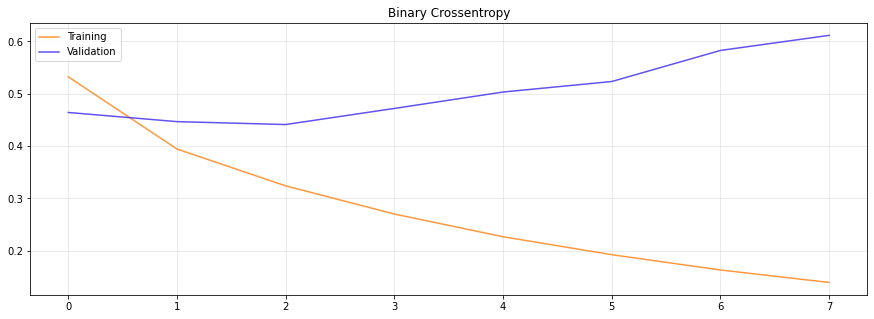

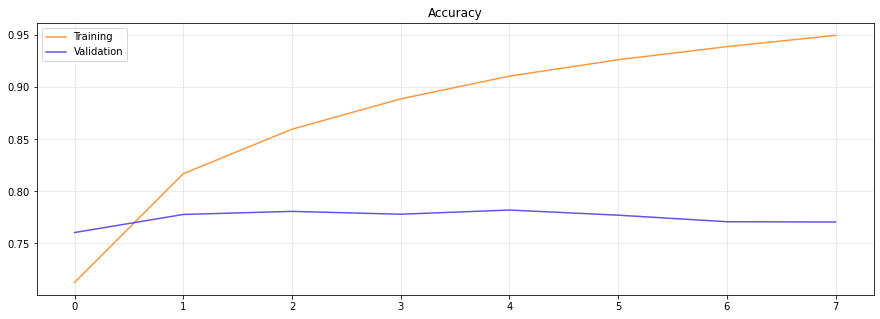

412/412 [==============================] - 3s 6ms/step
              precision    recall  f1-score   support

           0       0.79      0.76      0.78      6554
           1       0.77      0.80      0.79      6628

    accuracy                           0.78     13182
   macro avg       0.78      0.78      0.78     13182
weighted avg       0.78      0.78      0.78     13182



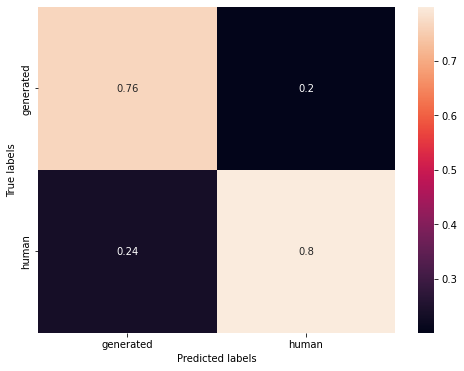

In [ ]:
# Training with lemmatized text
train_vector,test_vector,word_index = vectorize(x_lemma_train,x_lemma_test)

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_7 (Embedding)     (None, None, 64)          4634048   
                                                                 
 bidirectional_3 (Bidirectio  (None, 128)              66048     
 nal)                                                            
                                                                 
 dense_7 (Dense)             (None, 1)                 129       
                                                                 
Total params: 4,700,225
Trainable params: 4,700,225
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
412/412 [==============================] - 12s 26ms/step - loss: 0.5343 - accuracy: 0.7146 - val_loss: 0.4856 - val_accuracy: 0.7601
Epoch 2/20
412/412 [==============================] - 10s 25ms/step - loss: 0.4030 - accuracy: 0.8

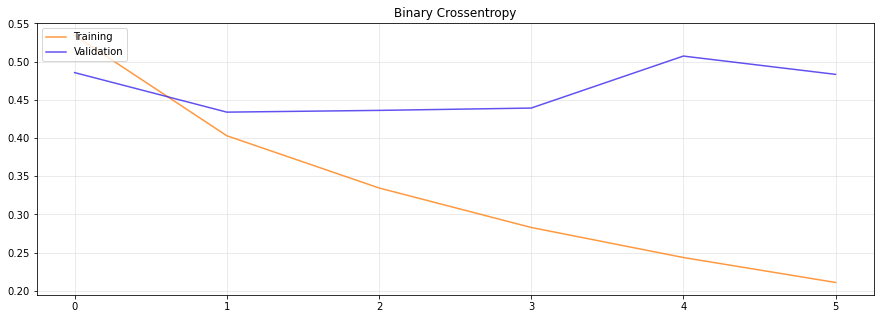

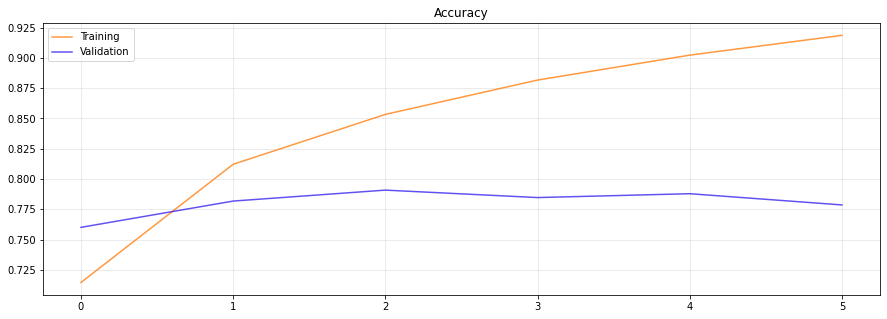

412/412 [==============================] - 3s 5ms/step
              precision    recall  f1-score   support

           0       0.82      0.74      0.78      6554
           1       0.77      0.84      0.80      6628

    accuracy                           0.79     13182
   macro avg       0.79      0.79      0.79     13182
weighted avg       0.79      0.79      0.79     13182



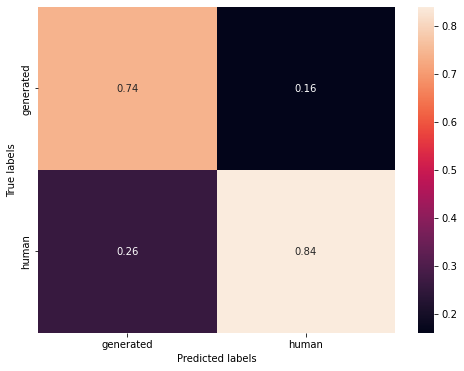

In [ ]:
# Training with pos-tagged text
train_vector,test_vector,word_index =vectorize(x_pos_train,x_pos_test)

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

**Observations:** From the results,  we can deduct that the *simple RNN model with LSTM* trained on the POS-tagged dataset outperforms the others.

Based on these results, we are going to mainly use the POS-tagged data in the next training phases. 

### More Features
In this part, we add our extra features into the training process. However, we notice that the extra features do not help us enhance the validation accuracy. 

In [ ]:
def build_model(input_shape, text_dim=200):
    input_layer=tf.keras.Input(shape=input_shape,name='Input')
    input0,input1=input_layer[:,:text_dim],input_layer[:,text_dim:]
    embedding=tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64)
    lstm=tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64))
    dense0=tf.keras.layers.Dense(32, activation='relu')
    dense1=tf.keras.layers.Dense(32, activation='relu')
    dense2=tf.keras.layers.Dense(32, activation='relu')
    dropout0=tf.keras.layers.Dropout(0.5)
    dropout1=tf.keras.layers.Dropout(0.5)
    out=tf.keras.layers.Dense(1, activation='sigmoid')
    
    layer0=embedding(input0)
    layer0=lstm(layer0)
    
    layer1=dense0(input1)
    layer1=dropout0(layer1)
    layer1=dense1(layer1)
    layer1=dropout1(layer1)
    layer1=dense2(layer1)
    
    layer=tf.concat((layer0,layer1),axis=1)
    layer=out(layer)
    model = tf.keras.Model(inputs=input_layer, outputs=layer, name='model')

    model.compile(loss=loss,optimizer=optimizer,metrics=['accuracy'])
    return model

def ml_vectorize(train_data,test_data,vectorizer,max_len=200):
    from scipy.sparse import hstack
    ml_train_vector,ml_test_vector=ml_vectorize(train_data,test_data,vectorizer)
    rnn_train_vector,rnn_test_vector,word_index=vectorize(train_data,test_data,max_len)
    train_vector=hstack((rnn_train_vector,ml_train_vector))
    test_vector=hstack((rnn_test_vector,ml_test_vector))
    return train_vector,test_vector,word_index

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 202)]        0           []                               
                                                                                                  
 tf.__operators__.getitem_1 (Sl  (None, 2)           0           ['Input[0][0]']                  
 icingOpLambda)                                                                                   
                                                                                                  
 dense_8 (Dense)                (None, 32)           96          ['tf.__operators__.getitem_1[0][0
                                                                 ]']                              
                                                                                              

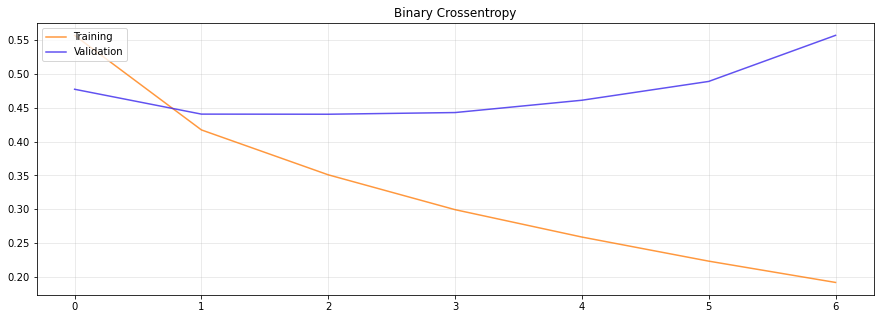

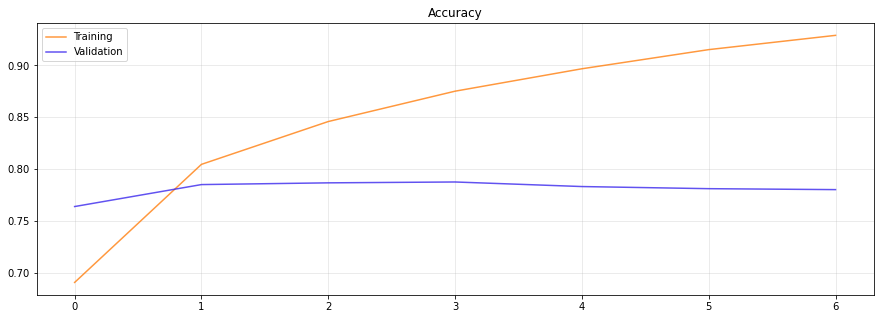

412/412 [==============================] - 3s 6ms/step
              precision    recall  f1-score   support

           0       0.79      0.77      0.78      6554
           1       0.78      0.80      0.79      6628

    accuracy                           0.79     13182
   macro avg       0.79      0.79      0.79     13182
weighted avg       0.79      0.79      0.79     13182



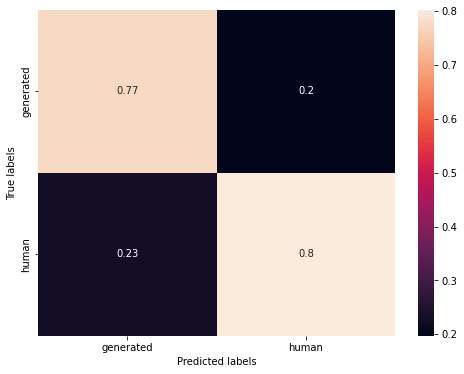

In [ ]:
train_vector,test_vector,word_index=vectorize(x_waf_train[:,0],x_waf_test[:,0])
train_vector=np.concatenate((train_vector,x_waf_train[:,1:].astype(np.float64)),axis=1)
test_vector=np.concatenate((test_vector,x_waf_test[:,1:].astype(np.float64)),axis=1)
model=build_model((train_vector.shape[1]))
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### Deeper Network
A deeper network with a stack of 3 LSTM layers is designed.

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_10 (Embedding)    (None, None, 64)          4634048   
                                                                 
 bidirectional_6 (Bidirectio  (None, None, 128)        66048     
 nal)                                                            
                                                                 
 bidirectional_7 (Bidirectio  (None, None, 128)        98816     
 nal)                                                            
                                                                 
 bidirectional_8 (Bidirectio  (None, 128)              98816     
 nal)                                                            
                                                                 
 dense_13 (Dense)            (None, 1)                 129       
                                                      

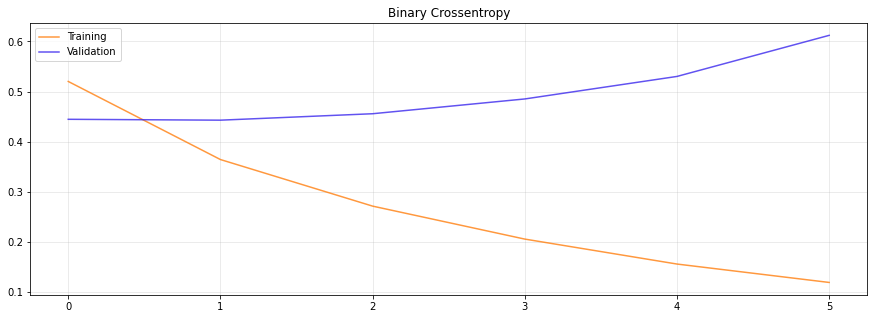

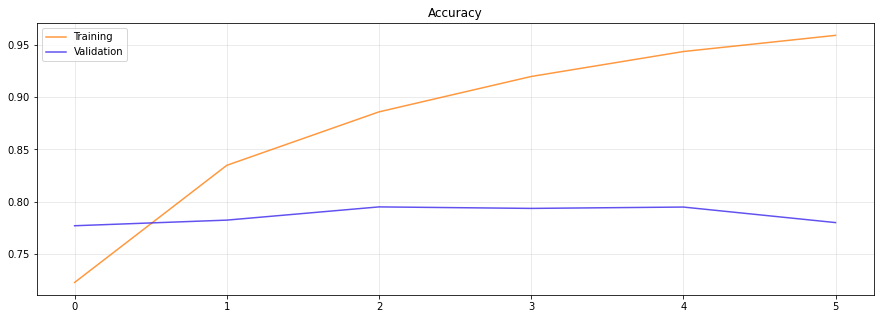

412/412 [==============================] - 14s 32ms/step
              precision    recall  f1-score   support

           0       0.80      0.78      0.79      6554
           1       0.79      0.81      0.80      6628

    accuracy                           0.80     13182
   macro avg       0.80      0.79      0.79     13182
weighted avg       0.80      0.80      0.79     13182



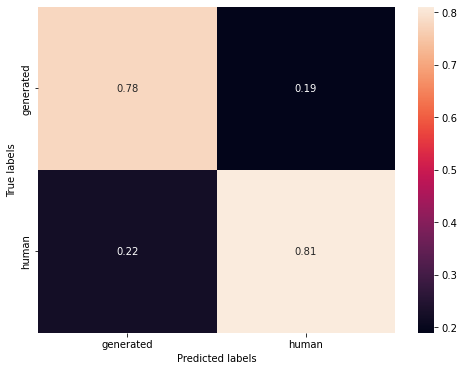

In [ ]:
train_vector,test_vector,word_index =vectorize(x_pos_train,x_pos_test)
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64,return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64,return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### Attention
An attention layer is integrated to the model.

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_11 (Embedding)    (None, None, 64)          4634048   
                                                                 
 bidirectional_9 (Bidirectio  (None, None, 128)        66048     
 nal)                                                            
                                                                 
 attention (Attention)       (None, 128)               49152     
                                                                 
 dense_14 (Dense)            (None, 1)                 129       
                                                                 
Total params: 4,749,377
Trainable params: 4,749,377
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
412/412 [==============================] - 14s 29ms/step - loss: 0.5128 - accuracy: 0.7251 - val_l

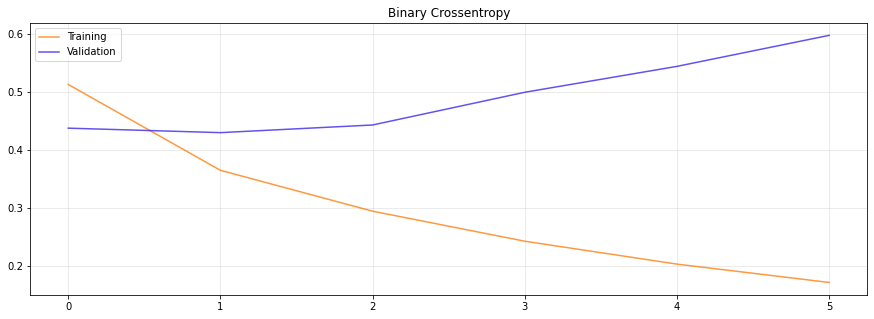

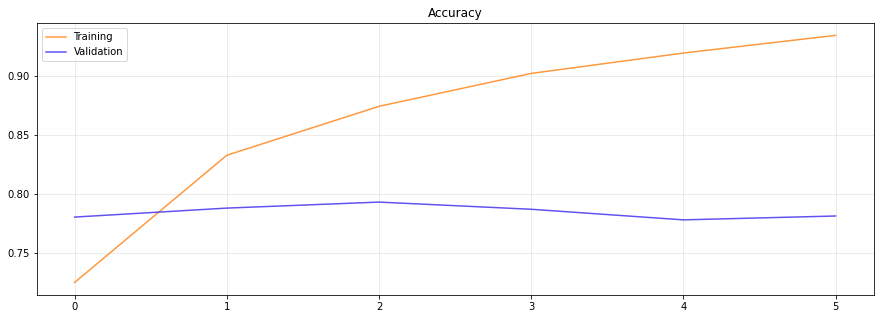

412/412 [==============================] - 3s 7ms/step
              precision    recall  f1-score   support

           0       0.79      0.80      0.79      6554
           1       0.80      0.78      0.79      6628

    accuracy                           0.79     13182
   macro avg       0.79      0.79      0.79     13182
weighted avg       0.79      0.79      0.79     13182



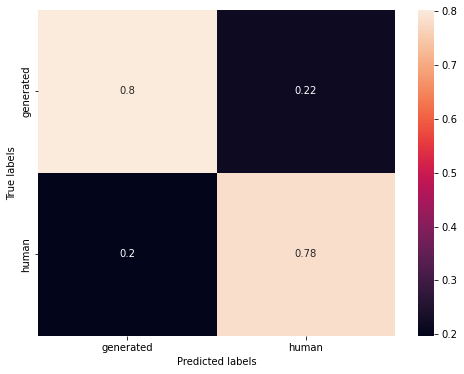

In [ ]:
train_vector,test_vector,word_index =vectorize(x_pos_train,x_pos_test)
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64,return_sequences=True)),
    Attention(),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### Precomputed Embeddings
Here we use precomputed embeddings in training the simple LSTM model. We can effectively see that precomputed embeddings boost the model performance to a certain extent.

0it [00:00, ?it/s]

Found 400000 word vectors.


  0%|          | 0/72406 [00:00<?, ?it/s]

number of embedding find: 35278 

total number of word: 72406 

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_12 (Embedding)    (None, 200, 100)          7240700   
                                                                 
 bidirectional_10 (Bidirecti  (None, 128)              84480     
 onal)                                                           
                                                                 
 dense_15 (Dense)            (None, 1)                 129       
                                                                 
Total params: 7,325,309
Trainable params: 7,325,309
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
412/412 [==============================] - 15s 32ms/step - loss: 0.5778 - accuracy: 0.6673 - val_loss: 0.5195 - val_accuracy: 0.7286
Epoch 2/20
412/412 [=============

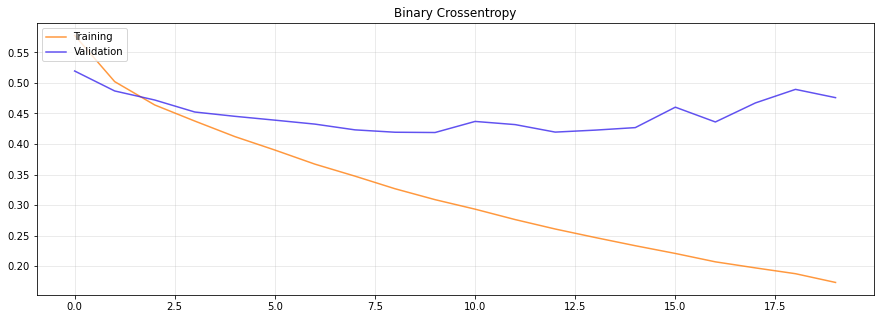

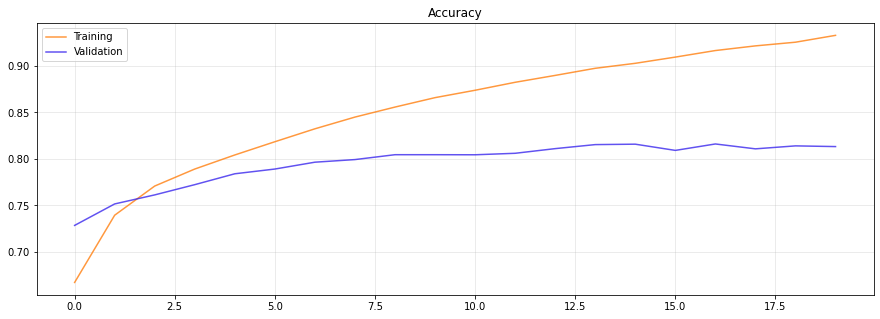

412/412 [==============================] - 3s 6ms/step
              precision    recall  f1-score   support

           0       0.83      0.80      0.81      6554
           1       0.81      0.83      0.82      6628

    accuracy                           0.82     13182
   macro avg       0.82      0.82      0.82     13182
weighted avg       0.82      0.82      0.82     13182



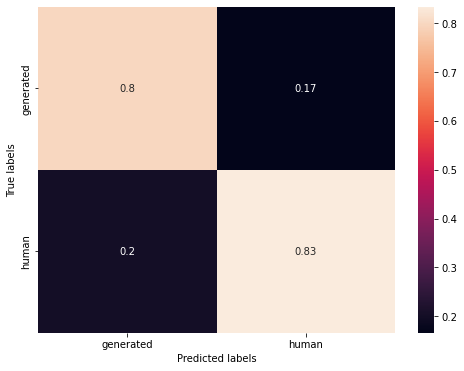

In [ ]:
train_vector,test_vector,word_index =vectorize(x_pos_train,x_pos_test)
embeddings_index = {}
f = open('embeddings/glove.6B.100d.txt','r',encoding='utf-8')
for line in tqdm(f):
    values = line.split(' ')
    word = values[0]
    coefs = np.asarray([float(val) for val in values[1:]])
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))

embedding_matrix = np.zeros((len(word_index) + 1, 100))
count=0
for word, i in tqdm(word_index.items()):
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        count+=1
        embedding_matrix[i] = embedding_vector
        
print("number of embedding find:",count,'\n')
print("total number of word:",len(word_index),'\n')

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(len(word_index) + 1,
                     100,
                     weights=[embedding_matrix],
                     input_length=200,
                     trainable=True),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test,epochs=20)

## Transformer
Since we have both English and Spanish text passages in the dataset, we decide to use the bert-base-multilingual model to deal with the given classification problem.

In [ ]:
def bert_encode(data, maximum_length,tokenizer) :
    input_ids = []
    attention_masks = []
    for text in data:
        encoded = tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=maximum_length,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
        )
        input_ids.append(encoded['input_ids'])
        attention_masks.append(encoded['attention_mask'])

    return np.array(input_ids),np.array(attention_masks)

def create_model(bert_model):

    input_ids = tf.keras.Input(shape=(200,),dtype='int32')
    attention_masks = tf.keras.Input(shape=(200,),dtype='int32')

    output = bert_model([input_ids,attention_masks])
    output = output[1]
    output = tf.keras.layers.Dense(1,activation='sigmoid')(output)

    model = tf.keras.models.Model(inputs = [input_ids,attention_masks],outputs = output)

    model.compile(optimizer=transformers.AdamWeightDecay(learning_rate=1e-5,weight_decay_rate=0.004), loss=loss, metrics=['accuracy'])
    return model

In [ ]:
model_name='bert-base-multilingual-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
train_input_ids, train_attention_masks = bert_encode(x_train,200,tokenizer)
test_input_ids, test_attention_masks = bert_encode(x_test,200,tokenizer)
train_input_ids.shape,train_attention_masks.shape,test_input_ids.shape,test_attention_masks.shape

((52725, 200), (52725, 200), (13182, 200), (13182, 200))

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200)]        0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 200)]        0           []                               
                                                                                                  
 tf_bert_model (TFBertModel)    TFBaseModelOutputWi  167356416   ['input_1[0][0]',                
                                thPoolingAndCrossAt               'input_2[0][0]']                
                                tentions(last_hidde                                               
                                n_state=(None, 200,                                           

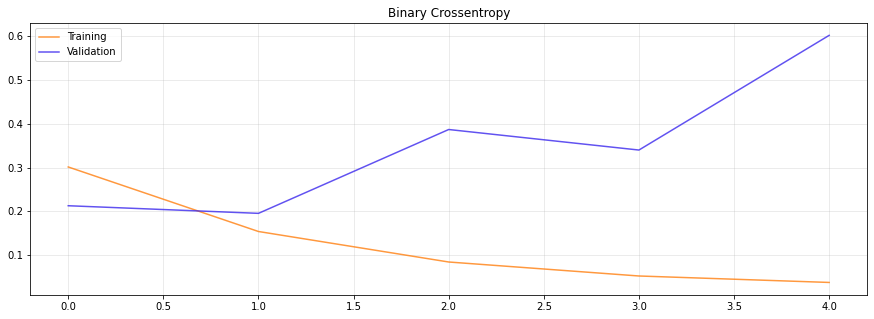

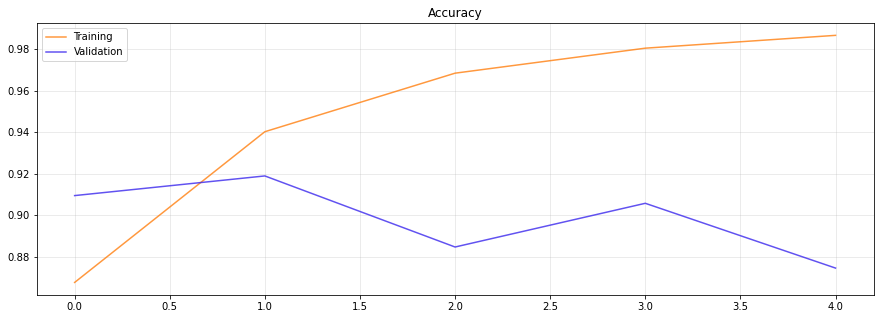

412/412 [==============================] - 77s 184ms/step
              precision    recall  f1-score   support

           0       0.95      0.88      0.92      6554
           1       0.89      0.96      0.92      6628

    accuracy                           0.92     13182
   macro avg       0.92      0.92      0.92     13182
weighted avg       0.92      0.92      0.92     13182



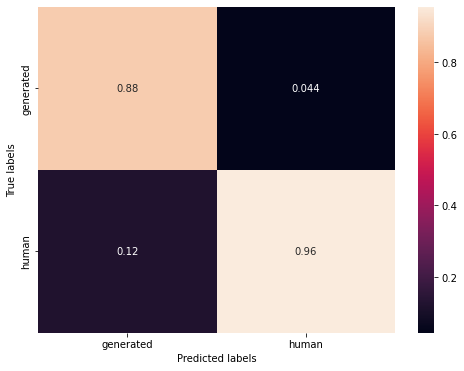

In [ ]:
bert_model = TFBertModel.from_pretrained(model_name)
model = create_model(bert_model)
model.summary()
evaluate(model,[train_input_ids,train_attention_masks],y_train,[test_input_ids,test_attention_masks],y_test,batch_size=8,patience=3,epochs=10)

## Results and comments Subtask 1

From whole choice of different models trained on this dataset we can conclude that the BERT transfomer (bert-base-multilingual-uncased) performs the best: 88% for generated text and 96% for human text. What can be interesting is that the transformer has more problems with labeling generated text that the human ones.

## *Conclusions:* **Application in the industry**
positive = generated

negative = human


**FAKE OR TRUE? Task: fake news detection**

We want to limit the fake news on our page. That is why we are applying the model to report automaticcally texts that may have been generated by bots to stop the spread of fake news.  Our fact-checking team will review the texts and their sources and after that publish the text again. The fake news not hidden may do more harm than the real news hidden from the audience that's why we want to have a very high true positive rate and very low false negative rate (predicted as human but actually generated), that is why we are paying attention to the precision and overall performance. We don't care for that much about the false positive (articles that were written by humans but predicted as generated) as we can publish them back any time. 


In this case the best performance have: Transformer, XGBoost, GRU, RandomForest, we would not use: Naive Bayes.


**HAVE YOU WRITTEN THAT ESSAY?**

Imagine we are a teacher and we are evaluating essays. We use the model to check if the essay was written by student or generated. We don't want to fail anyone that was not cheating.
For this particular task we want to have very low false positive (predicted as generated but actually human) rate and very high true positive (truly generated). 
In this case the best performance have: Transformer or XGBoost, we would not use: Naive Bayes.

If we have time to ask students and check their knowledge of the content of the written essay we can review all the generated and ignore the false generated rate (predicted as generated but actually human) and just look for the highest true generated rate. If we want to be fair to students - we would like to have low false negative (actually generated but predicted as human).
In this case the best performance has the transformer and we deduced that including the POS_tagging did also make a positive difference, for Simple Classifiers RandomForest and LogisticRegression with additional features or LogisticRegression with POS tags perform well too, we would not use: Naive Bayes due to its performance.



# Subtask 2: Which Generation model
The task is to identify the particular Language Model that generated the text. (source: https://sites.google.com/view/autextification)

The second task is a multi-class classification.  Our approach involves training models on a combined dataset of both English and Spanish samples. To prepare the data, we conduct essential text cleaning and perform POS tagging. Additionally, we incorporate visualization and clustering to gain a deeper understanding of the dataset.
Next we present all models prepared for this task. 

## Data Preparation
The dataset consists of 44351 text samples with the corresponding index, text, label and language information. Label refers to a model that generated the data.

### Loading

In [ ]:
dataset_dir = 'subtask_2'
languages = ['en','es']
datasets = [] 
for language in languages:
  df = pd.read_csv('{}/{}/train.tsv'.format(dataset_dir, language), sep='\t')
  df['language'] = language
  datasets.append(df)
dataset = pd.concat(datasets,axis=0)
classes=dict(zip(['A','B','C','D','E','F'],range(6)))
classes_names=['A','B','C','D','E','F']
dataset

,id,text,label,language
0,6239,It was not until many years later that it coul...,A,en
1,9255,Users can then pin these images to their profi...,F,en
2,1674,The best songs are those that I can sing along...,B,en
3,5001,I found this book to be poorly written. It was...,D,en
4,20779,Regulates the application of the EU tariff quo...,E,en
...,...,...,...,...
21930,11706,Escribe un correo electrónico a PI:EMAIL y cué...,A,es
21931,7997,"Los osos negros y grizzlies de Yellowstone, ta...",C,es
21932,11369,"El lenguaje es un recurso para comunicarse, pe...",A,es
21933,25259,"Dr, creo que las ostras son animales No, las o...",F,es


There are 21935 Spanish samples and 22416 English samples. 

In [ ]:
avg_chars = dataset['text'].apply(lambda x: len(str(x))).mean()
print("Average number of characters for text passage:", avg_chars)
avg_words = dataset['text'].apply(lambda x: len(x.split(" "))).mean()
print("Average number of words for text passage:", avg_words)
print("Average word length:", avg_chars / avg_words)

Average number of characters for text passage: 337.57459809248945
Average number of words for text passage: 58.9116367161958
Average word length: 5.730185357414871


### Data Preprocessing

In [ ]:
# Data cleaning: remove stopwords, punctuations, numbers, etc.
dataset=clean_data(dataset)
dataset.head()

,id,text,label,language,text_clean
0,6239,It was not until many years later that it coul...,A,en,many years later could controlled pesticides m...
1,9255,Users can then pin these images to their profi...,F,en,users pin images profile creating public priva...
2,1674,The best songs are those that I can sing along...,B,en,best songs sing along ’
3,5001,I found this book to be poorly written. It was...,D,en,found book poorly written written unprofession...
4,20779,Regulates the application of the EU tariff quo...,E,en,regulates application eu tariff quotas imports...


In [ ]:
#part of speech tagging (POS)
path="subtask_2/parsed_texts_subtask_2.csv"
try:
    dataset=pd.read_csv(path)
    dataset.text_pos=dataset.text_pos.apply(lambda i: json.loads(i))
    dataset.text_clean_pos=dataset.text_clean_pos.apply(lambda i: json.loads(i))
    dataset.text=dataset.text.apply(lambda i: json.loads(i))
    dataset.text_clean=dataset.text_clean.apply(lambda i: json.loads(i))
except Exception as e:
    print(e)
    # dataset = pos_tagging(dataset, path)

dataset.head(10)

,id,text,label,language,text_clean,text_pos,text_clean_pos
0,6239,It was not until many years later that it coul...,A,en,many years later could controlled pesticides m...,"[[It, PRON, it], [was, AUX, be], [not, PART, n...","[[many, ADJ, many], [years, NOUN, year], [late..."
1,9255,Users can then pin these images to their profi...,F,en,users pin images profile creating public priva...,"[[Users, NOUN, user], [can, AUX, can], [then, ...","[[users, NOUN, user], [pin, NOUN, pin], [image..."
2,1674,The best songs are those that I can sing along...,B,en,best songs sing along ’,"[[The, DET, the], [best, ADJ, good], [songs, N...","[[best, ADJ, good], [songs, NOUN, song], [sing..."
3,5001,I found this book to be poorly written. It was...,D,en,found book poorly written written unprofession...,"[[I, PRON, I], [found, VERB, find], [this, DET...","[[found, VERB, find], [book, NOUN, book], [poo..."
4,20779,Regulates the application of the EU tariff quo...,E,en,regulates application eu tariff quotas imports...,"[[Regulates, VERB, regulate], [the, DET, the],...","[[regulates, NOUN, regulate], [application, NO..."
5,7785,"Picture: PA. The Agriculture Secretary, George...",C,en,picture pa agriculture secretary george eustic...,"[[Picture, NOUN, picture], [:, PUNCT, :], [PA,...","[[picture, NOUN, picture], [pa, PROPN, pa], [a..."
6,16154,"Keep items such as flatscreen TVs, computers a...",E,en,keep items flatscreen tvs computers electronic...,"[[Keep, VERB, keep], [items, NOUN, item], [suc...","[[keep, VERB, keep], [items, NOUN, item], [fla..."
7,8175,They arrived and found a man suffering from a ...,C,en,arrived found man suffering gunshot wound pati...,"[[They, PRON, they], [arrived, VERB, arrive], ...","[[arrived, VERB, arrive], [found, VERB, find],..."
8,6058,"However, you can still catch the train directl...",A,en,however still catch train directly southwark v...,"[[However, ADV, however], [,, PUNCT, ,], [you,...","[[however, ADV, however], [still, ADV, still],..."
9,8525,They were: 1. A 22yearold man from the local a...,F,en,man local area man mold man chester,"[[They, PRON, they], [were, AUX, be], [:, PUNC...","[[man, NOUN, man], [local, ADJ, local], [area,..."


In [ ]:
# not lemmatized
sample=dataset.text_pos.iloc[0]
sample_text = ' '.join([str(w[0])+'_'+str(w[1]) for w in sample])
print(sample_text)

# lemmatized
sample_text = ' '.join([str(w[2])+'_'+str(w[1]) for w in sample])
print(sample_text)

# without pos not lemmatized
sample_text = ' '.join([str(w[0]) for w in sample])
print(sample_text)

# without pos lemmatized
sample_text = ' '.join([str(w[2]) for w in sample])
print(sample_text)

It_PRON was_AUX not_PART until_ADP many_ADJ years_NOUN later_ADV that_SCONJ it_PRON could_AUX be_AUX controlled_VERB with_ADP pesticides_NOUN ._PUNCT Many_ADJ pest_NOUN species_NOUN have_AUX become_VERB invasive_ADJ because_SCONJ they_PRON are_AUX unpalatable_ADJ to_ADP humans_NOUN or_CCONJ animals_NOUN ,_PUNCT often_ADV causing_VERB damage_NOUN from_ADP their_PRON toxic_ADJ substances_NOUN (_PUNCT which_PRON can_AUX also_ADV harm_VERB plants_NOUN )_PUNCT ._PUNCT Examples_NOUN include_VERB the_DET Asian_ADJ elephant_NOUN ’s_PART hairy_ADJ snake_NOUN droppings_NOUN ,_PUNCT which_PRON poisoned_VERB European_ADJ ivory_NOUN owls_NOUN for_ADP hundreds_NOUN of_ADP years_NOUN ,_PUNCT and_CCONJ more_ADV recently_ADV rabid_ADJ dogs_NOUN killing_VERB wild_ADJ cats_NOUN by_ADP biting_VERB them_PRON off_ADP at_ADP night_NOUN ._PUNCT The_DET spread_NOUN of_ADP invasive_ADJ species_NOUN is_AUX affected_VERB both_CCONJ by_ADP natural_ADJ
it_PRON be_AUX not_PART until_ADP many_ADJ year_NOUN later_ADV 

### Data Augmentation

One way to cope with overfitting is increasing the size of the dataset. We tried data augmentation by translating spanish sentences to english and english sentences to spanish, doubling in this way the dataset.

In [ ]:
first_time_translating = False
if first_time_translating:
  df = translation_augmentation(dataset[:2000])
  df.to_csv('subtask_2/translated_data.tsv', sep="\t")
  dataset_augmented = pd.concat([dataset, df],axis=0)
else:
  df = pd.read_csv('subtask_2/translated_data.tsv', sep='\t')
  dataset_augmented = pd.concat([dataset, df],axis=0)
del df
print(dataset_augmented.info())
dataset_augmented

<class 'pandas.core.frame.DataFrame'>
Int64Index: 46351 entries, 0 to 1999
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   id              46351 non-null  object 
 1   text            46351 non-null  object 
 2   label           46351 non-null  object 
 3   language        46351 non-null  object 
 4   text_clean      46350 non-null  object 
 5   text_pos        46351 non-null  object 
 6   text_clean_pos  46351 non-null  object 
 7   Unnamed: 0      2000 non-null   float64
dtypes: float64(1), object(7)
memory usage: 3.2+ MB
None


,id,text,label,language,text_clean,text_pos,text_clean_pos,Unnamed: 0
0,6239,It was not until many years later that it coul...,A,en,many years later could controlled pesticides m...,"[[It, PRON, it], [was, AUX, be], [not, PART, n...","[[many, ADJ, many], [years, NOUN, year], [late...",NaN
1,9255,Users can then pin these images to their profi...,F,en,users pin images profile creating public priva...,"[[Users, NOUN, user], [can, AUX, can], [then, ...","[[users, NOUN, user], [pin, NOUN, pin], [image...",NaN
2,1674,The best songs are those that I can sing along...,B,en,best songs sing along ’,"[[The, DET, the], [best, ADJ, good], [songs, N...","[[best, ADJ, good], [songs, NOUN, song], [sing...",NaN
3,5001,I found this book to be poorly written. It was...,D,en,found book poorly written written unprofession...,"[[I, PRON, I], [found, VERB, find], [this, DET...","[[found, VERB, find], [book, NOUN, book], [poo...",NaN
4,20779,Regulates the application of the EU tariff quo...,E,en,regulates application eu tariff quotas imports...,"[[Regulates, VERB, regulate], [the, DET, the],...","[[regulates, NOUN, regulate], [application, NO...",NaN
...,...,...,...,...,...,...,...,...
1995,es_21198,Artículo 129 Se adiciona como párrafo 5 al art...,E,es,article following shall added paragraph articl...,"[('Article', 'NOUN', 'article'), ('129', 'NUM'...","[('Article', 'NOUN', 'article'), ('129', 'NUM'...",1995.0
1996,es_21334,Este reglamento se conocerá como el Reglamento...,E,es,regulation shall known maryland motor vehicle ...,"[('This', 'DET', 'this'), ('regulation', 'NOUN...","[('This', 'DET', 'this'), ('regulation', 'NOUN...",1996.0
1997,es_23077,"@karinalg, @SSdancer, narnia los gana todos). ...",A,es,karinalg ssdancer narnia wins else mparent kca...,"[('@karinalg', 'PROPN', '@karinalg'), (',', 'P...","[('@karinalg', 'PROPN', '@karinalg'), (',', 'P...",1997.0
1998,es_23227,Cosas que me encantan de Twitter: es una gran ...,A,es,things love twitter great platform learning ne...,"[('Things', 'NOUN', 'thing'), ('I', 'PRON', 'I...","[('Things', 'NOUN', 'thing'), ('I', 'PRON', 'I...",1998.0


### Visualization

In [ ]:
classes_names=['A','B','C','D','E','F']

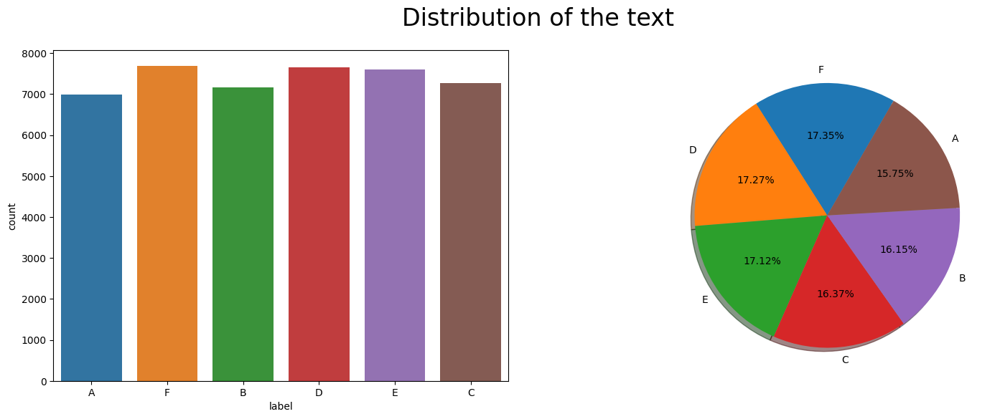

In [ ]:
# Displaying target distribution.
fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(18, 6), dpi=100)
sns.countplot(data=dataset, x='label', ax=axes[0])
axes[1].pie(dataset['label'].value_counts(),
            labels=dataset['label'].value_counts().index,
            autopct='%1.2f%%',
            shadow=True,
            startangle=60)
fig.suptitle('Distribution of the text', fontsize=24)
plt.show()

**Comment**
We can observe that the dataset it is balanced. All classes occupy around 15-17% of the dataset.

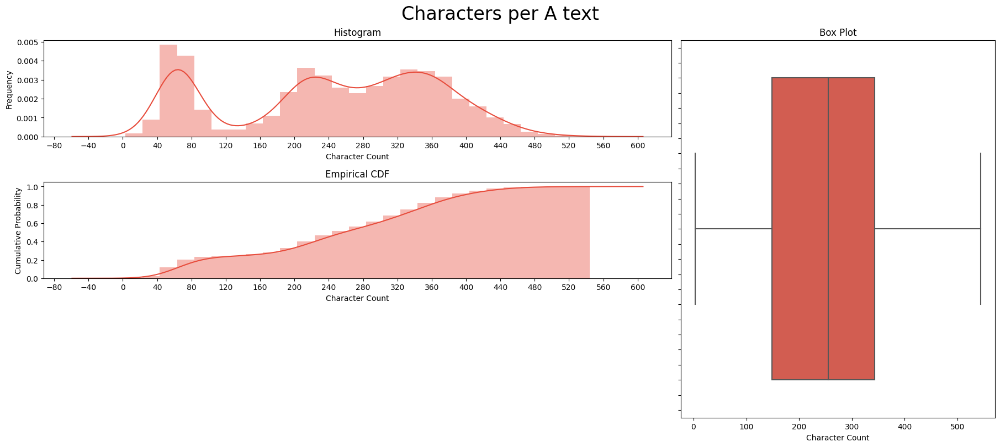

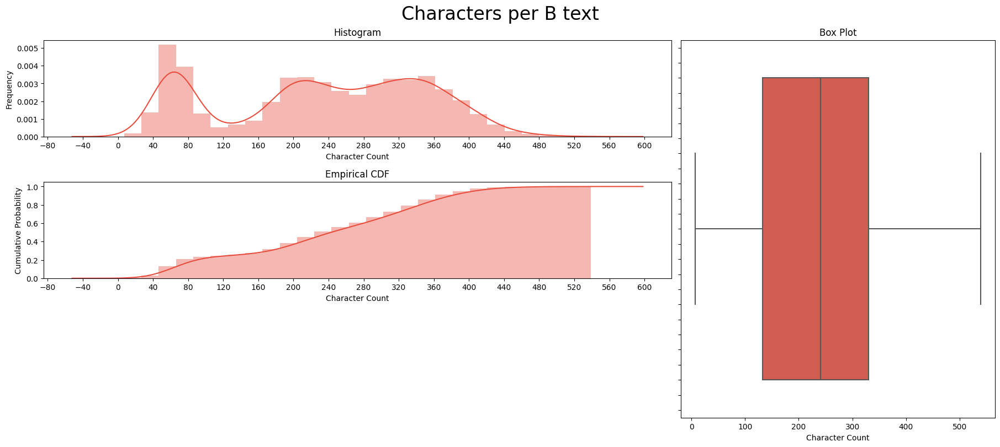

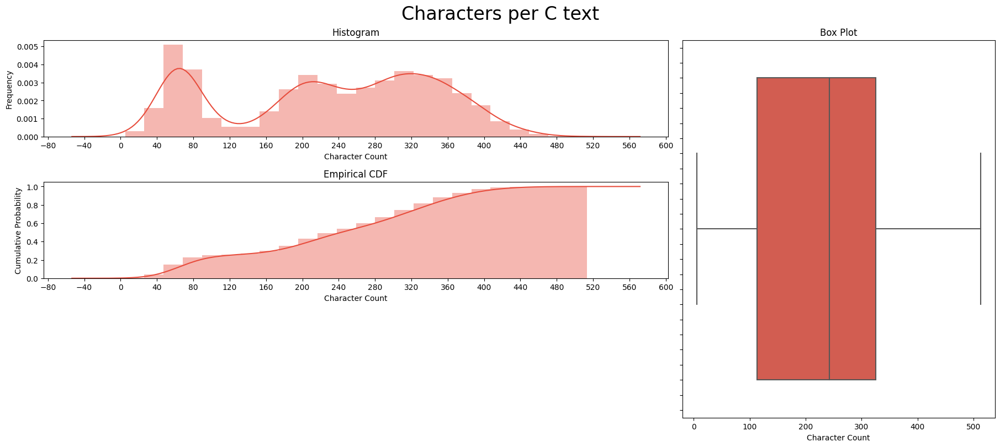

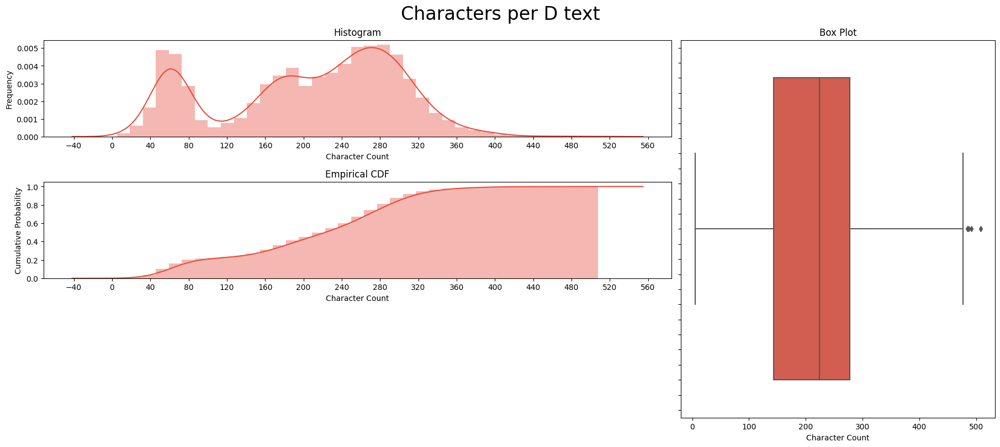

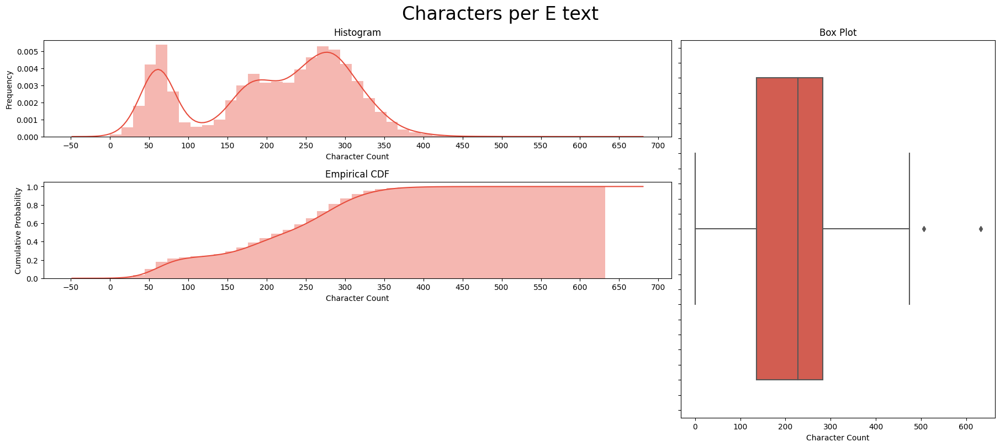

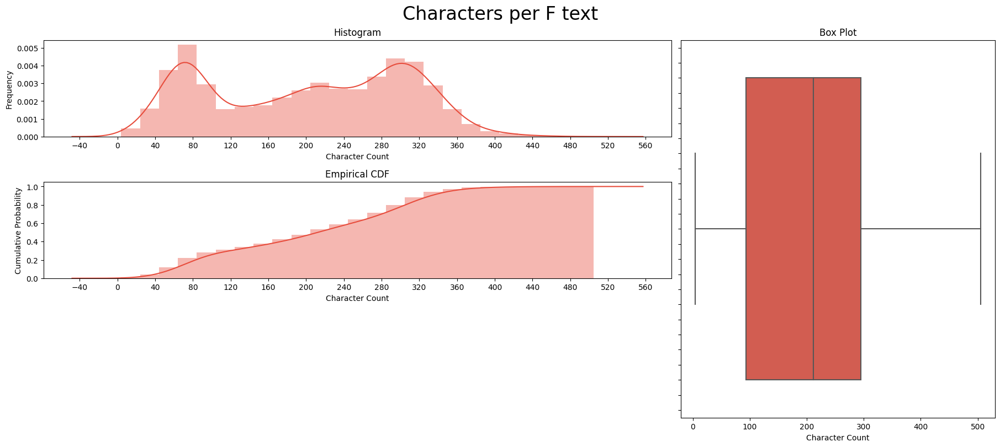

In [ ]:
dataset['Character Count'] = dataset['text_clean'].apply(lambda x: len(str(x)))
for label in classes_names:
  plot_dist3_label(dataset, label, 'Character Count', 'Characters per {} text'.format(label))

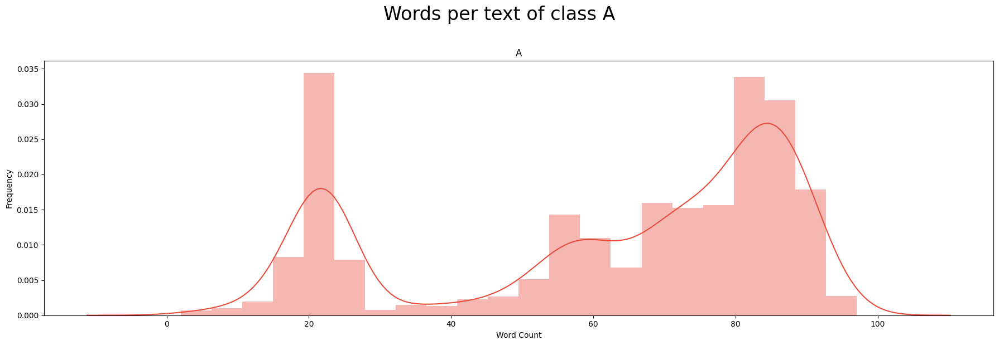

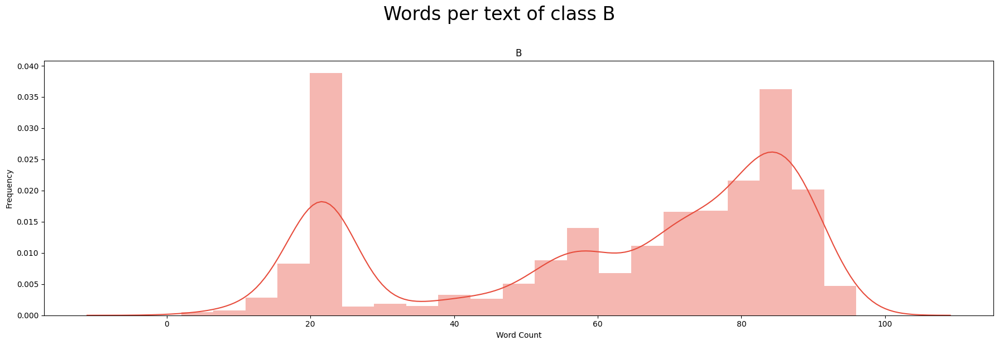

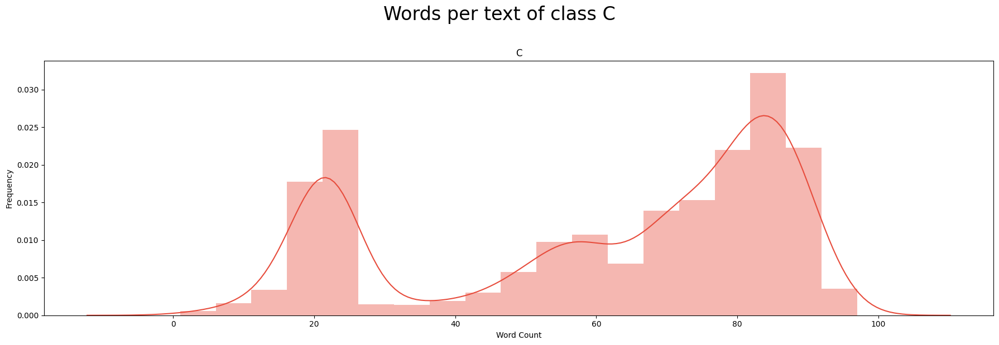

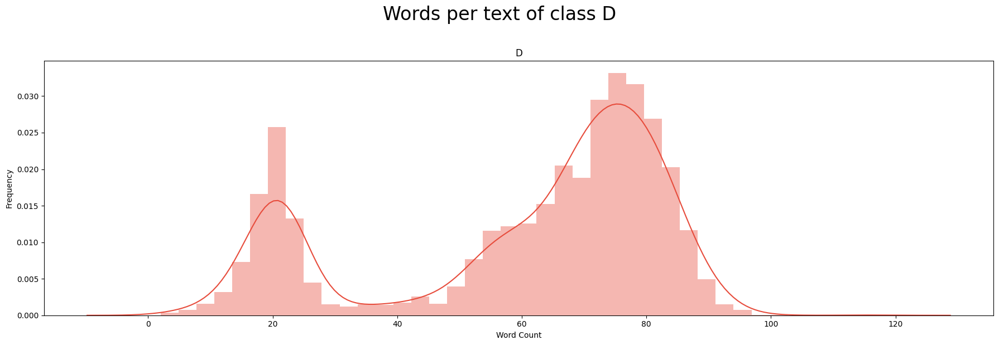

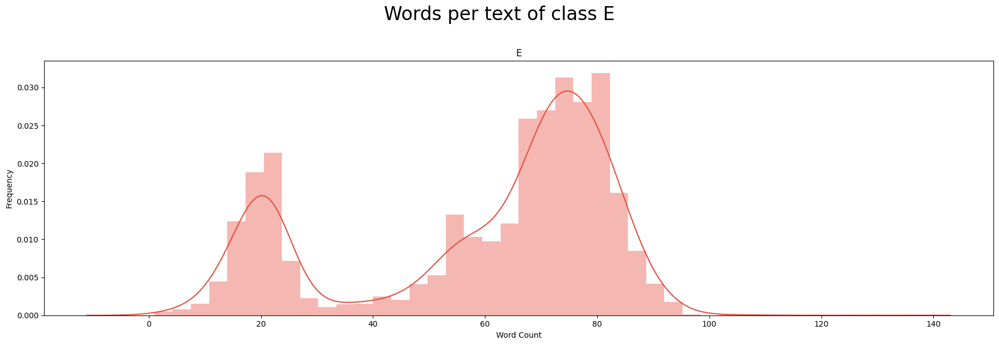

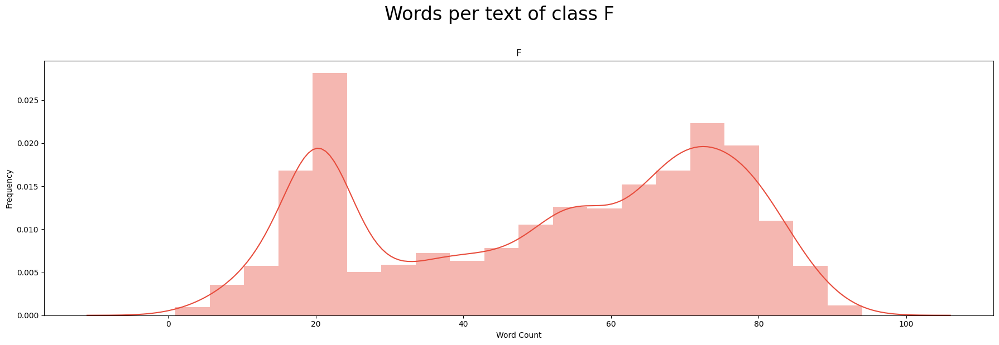

In [ ]:
for label in classes_names:
  plot_word_number_histogram(dataset[dataset['label'] == label]['text'], label)

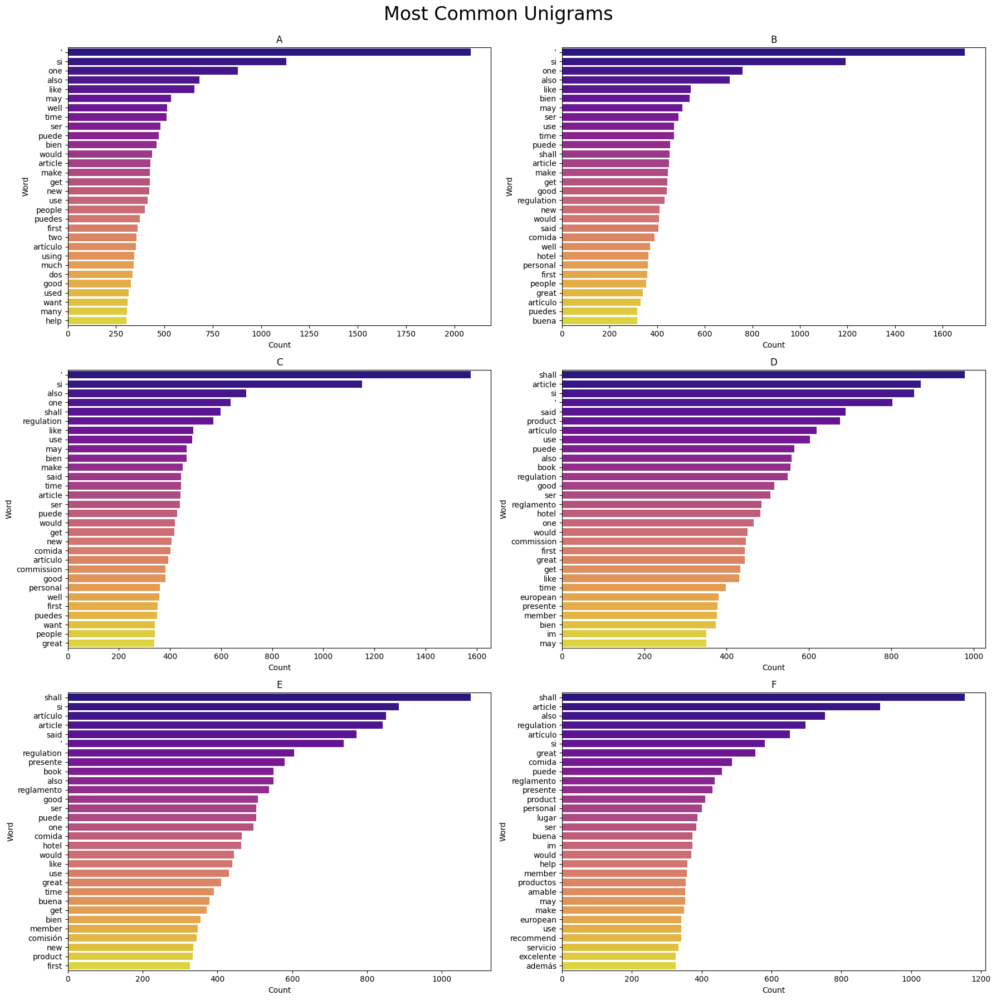

In [ ]:
unigrams(dataset, classes_names, 3, 2,figsize=(18,18))

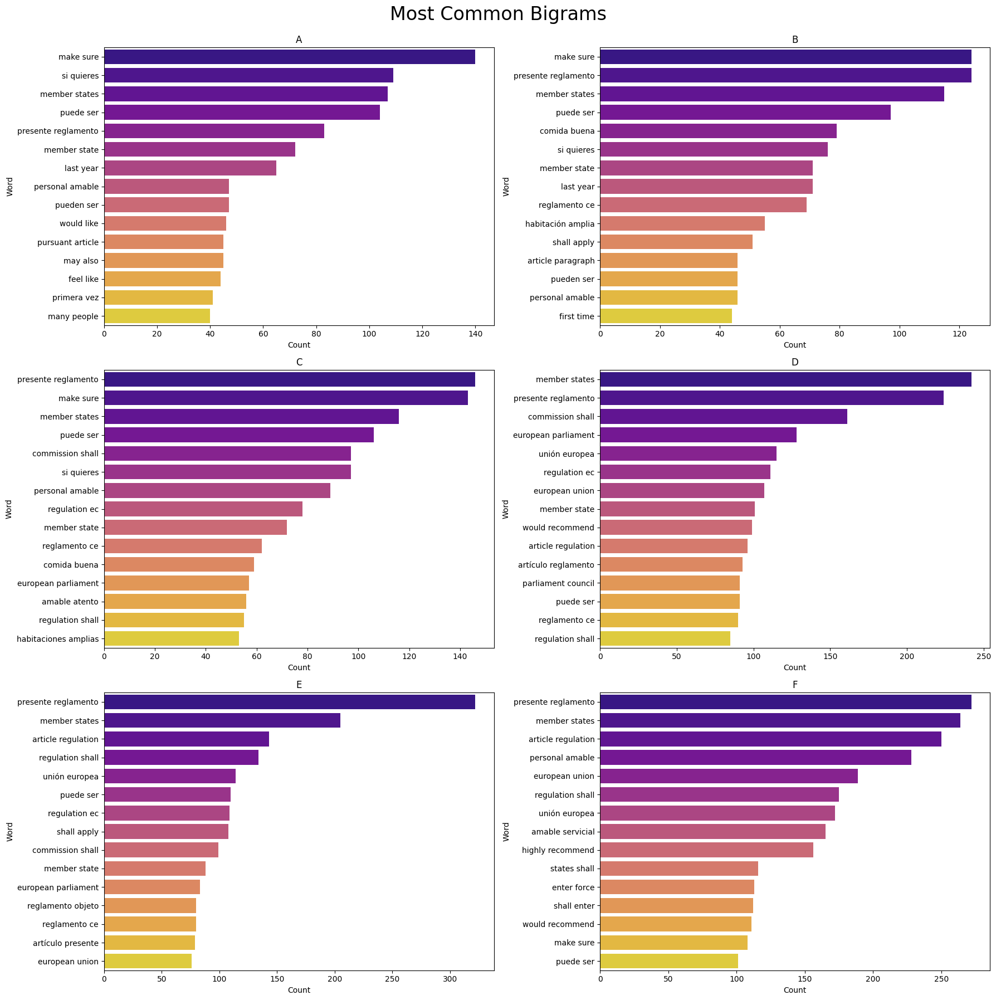

In [ ]:
ngrams(2, dataset, classes_names, 'Most Common Bigrams',num_row=3, num_col=2, figsize=(18,18))

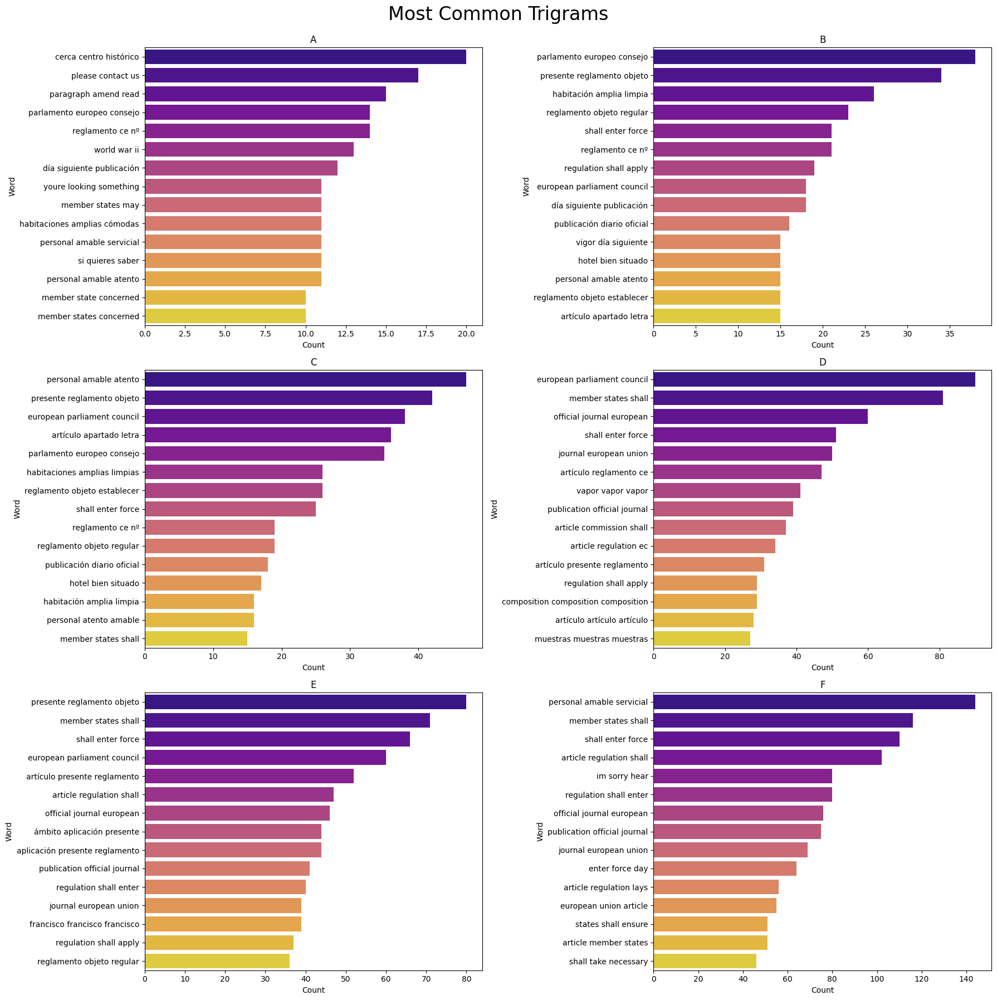

In [ ]:
ngrams(3, dataset, classes_names, 'Most Common Trigrams', num_row=3, num_col=2, figsize=(18,18))

In [ ]:
from PIL import Image
mask = np.array(Image.open('mask.png'))

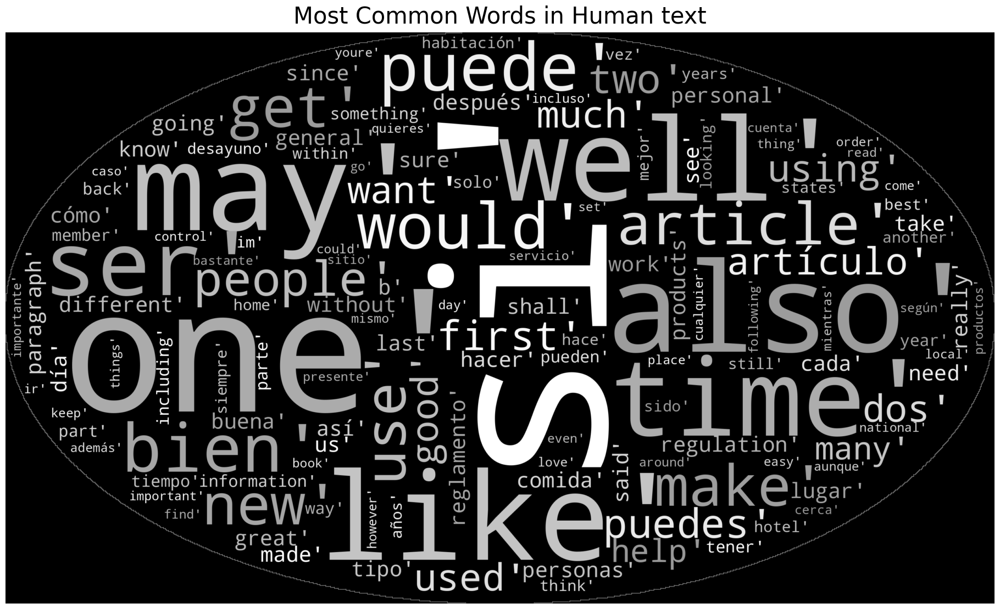

In [ ]:
plot_wordcloud(dataset[dataset['label'] == 'A']['text_clean'],
               'Most Common Words in Human text',
               title_size=30)

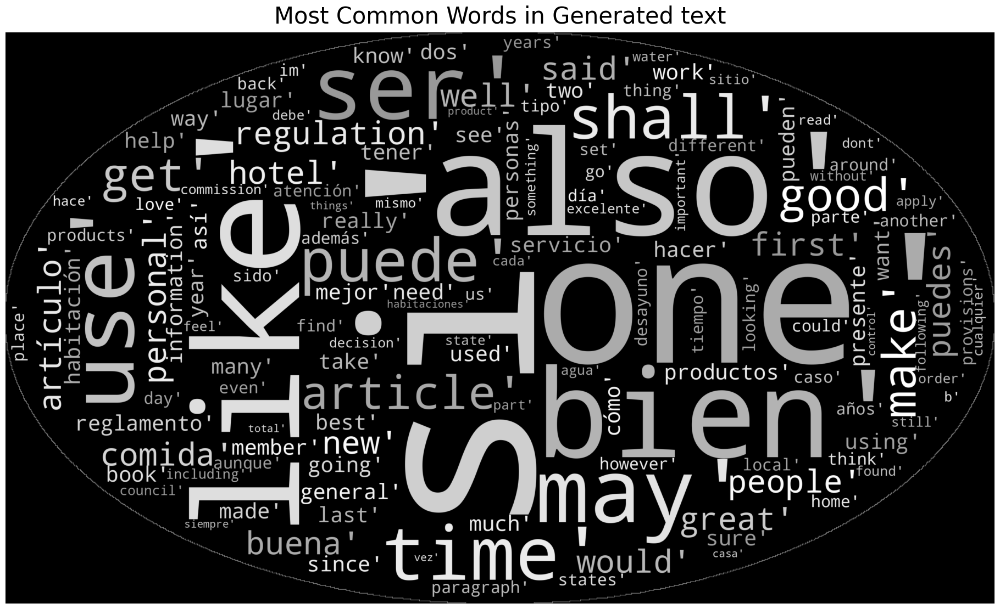

In [ ]:
plot_wordcloud(dataset[dataset['label'] == 'B']['text_clean'],
               'Most Common Words in Generated text',
               title_size=30)

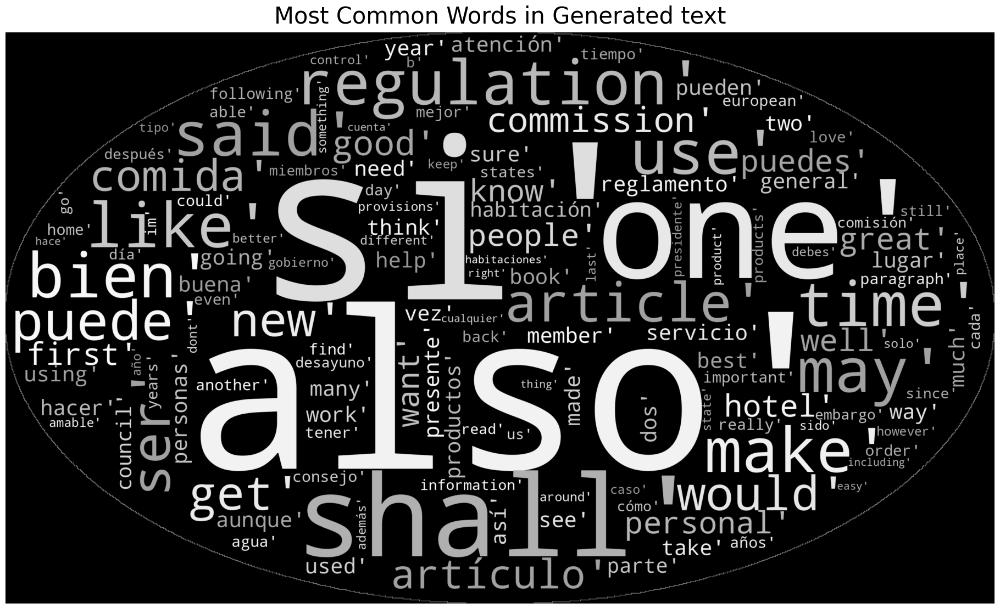

In [ ]:
plot_wordcloud(dataset[dataset['label'] == 'C']['text_clean'],
               'Most Common Words in Generated text',
               title_size=30)

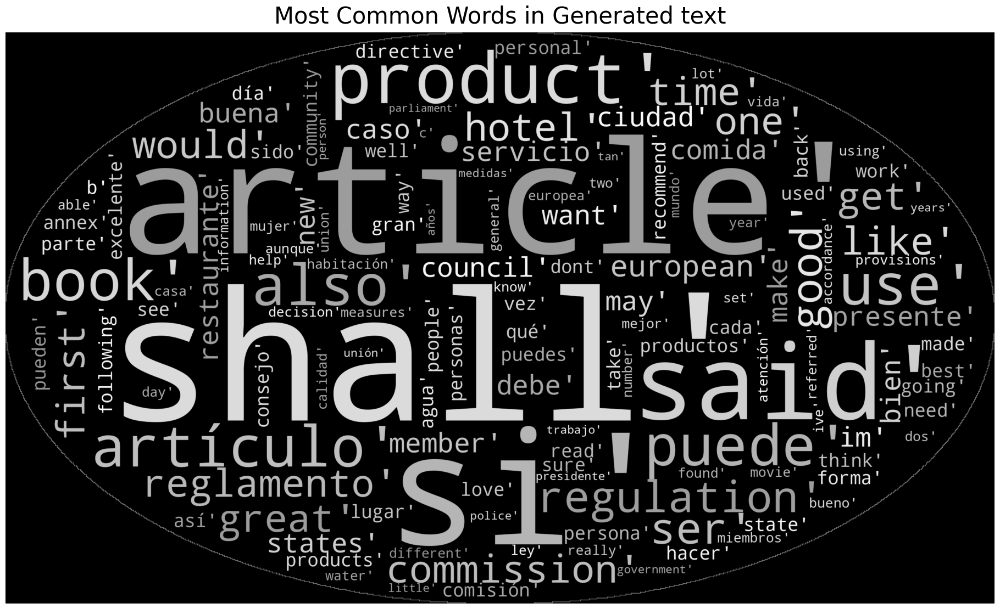

In [ ]:
plot_wordcloud(dataset[dataset['label'] == 'D']['text_clean'],
               'Most Common Words in Generated text',
               title_size=30)

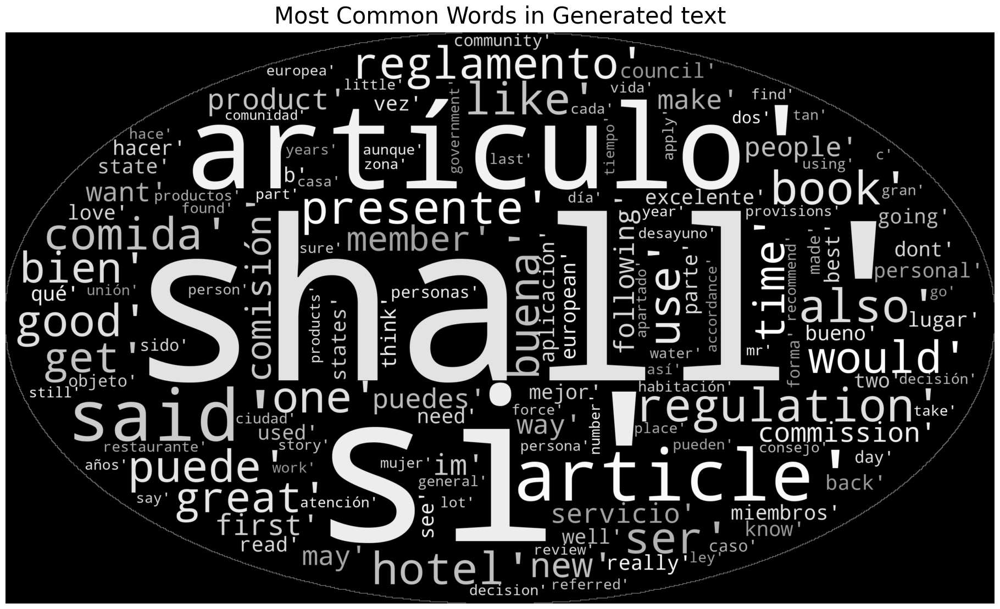

In [ ]:
plot_wordcloud(dataset[dataset['label'] == 'E']['text_clean'],
               'Most Common Words in Generated text',
               title_size=30)

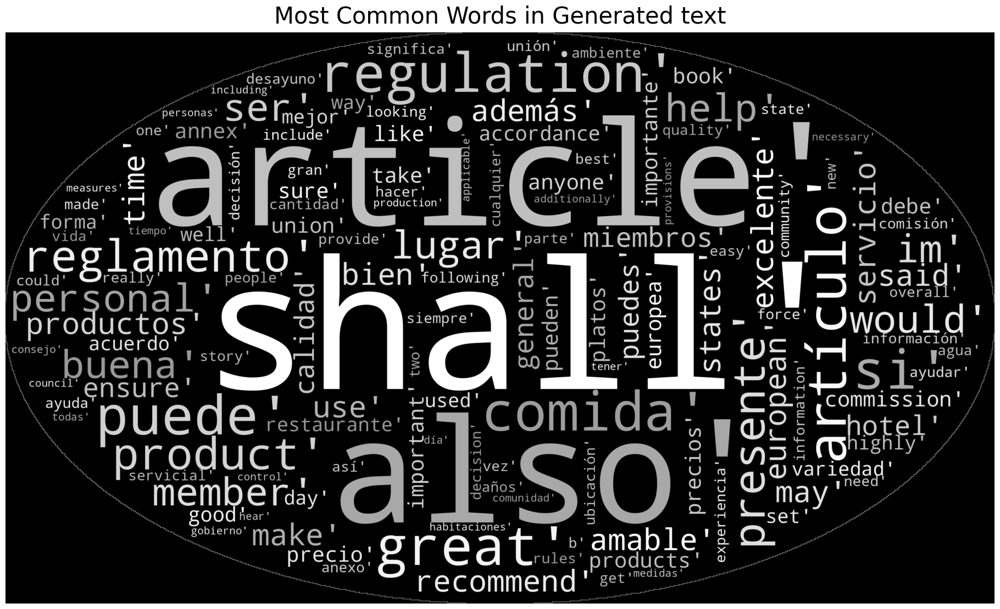

In [ ]:
plot_wordcloud(dataset[dataset['label'] == 'F']['text_clean'],
               'Most Common Words in Generated text',
               title_size=30)

##Clustering

### K-means for many labels

We look for 6 distict clusters knowing that in the dataset there are 6 lables - we want to check if they can be really extracted from the dataset.

In [ ]:
#read all of en and es sentences
dataset_en_es = read_dataset(languages = ['es','en'], dataset_dir = 'subtask_2')
#read only english sentences
dataset_en = read_dataset(languages = ['en'], dataset_dir = 'subtask_2')
# classes_dict
labels = np.unique(dataset_en_es["label"])
classes_dict = dict(zip(labels, range(0,len(labels))))
classes_names = list(classes_dict.keys())
print(classes_dict)
print(classes_names)

#extracting sentences in a string format from datasets
documents_es_en = [f"{sample}" for sample in dataset_en_es["text"]]
documents_en = [f"{sample}" for sample in dataset_en["text"]]

#vectorization by TfidfVectorizer
vector_documents_en_es, vocab_en_es = vectorize(documents_es_en)
vector_documents_en, vocab_en = vectorize(documents_en)

k = len(set(labels))
print(f"Number of labels {k}")

kmeans_en_es = KMeans(n_clusters=k, max_iter=100, n_init=3, verbose=True, random_state=2137)
kmeans_en_es.fit(vector_documents_en_es);

kmeans_en = KMeans(n_clusters=k, max_iter=100, n_init=3, verbose=True, random_state=2137)
kmeans_en.fit(vector_documents_en);

{'A': 0, 'B': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5}
['A', 'B', 'C', 'D', 'E', 'F']
Number of labels 6
Initialization complete
Iteration 0, inertia 78415.4270214861.
Iteration 1, inertia 40712.01356392243.
Iteration 2, inertia 40595.58567138556.
Iteration 3, inertia 40539.562991934756.
Iteration 4, inertia 40505.61625358042.
Iteration 5, inertia 40478.97659320531.
Iteration 6, inertia 40463.36842670954.
Iteration 7, inertia 40457.11439853602.
Iteration 8, inertia 40453.53768446737.
Iteration 9, inertia 40449.86115203056.
Iteration 10, inertia 40445.44958227555.
Iteration 11, inertia 40439.38984469797.
Iteration 12, inertia 40430.0324142759.
Iteration 13, inertia 40420.41764930202.
Iteration 14, inertia 40415.93412581392.
Iteration 15, inertia 40414.397063468256.
Iteration 16, inertia 40413.83939436992.
Iteration 17, inertia 40413.59776500241.
Iteration 18, inertia 40413.456586350614.
Iteration 19, inertia 40413.36574913298.
Iteration 20, inertia 40413.28441123372.
Iteration 21, inertia 404

In [ ]:
print("Top terms per cluster for both languages:")

for i in range(kmeans_en_es.n_clusters):
    centroid = kmeans_en_es.cluster_centers_[i]    
    sorted_terms = centroid.argsort()[::-1]
    print(f"Cluster {i}:\t{[vocab_en_es[j] for j in sorted_terms[:10]]}")

print("Top terms per cluster for english dataset:")

for i in range(kmeans_en.n_clusters):
    centroid = kmeans_en.cluster_centers_[i]    
    sorted_terms = centroid.argsort()[::-1]
    print(f"Cluster {i}:\t{[vocab_en[j] for j in sorted_terms[:10]]}")

Top terms per cluster for both languages:
Cluster 0:	['you', 'to', 'your', 'the', 'if', 'it', 'and', 'can', 'that', 'of']
Cluster 1:	['que', 'de', 'la', 'el', 'no', 'en', 'una', 'es', 'un', 'para']
Cluster 2:	['muy', 'es', 'la', 'el', 'de', 'comida', 'que', 'hotel', 'no', 'en']
Cluster 3:	['de', 'la', 'el', 'en', 'los', 'que', 'del', 'se', 'las', 'una']
Cluster 4:	['the', 'to', 'and', 'it', 'of', 'is', 'was', 'in', 'this', 'for']
Cluster 5:	['the', 'of', 'to', 'in', 'shall', 'and', 'article', 'regulation', 'for', 'this']
Top terms per cluster for english dataset:
Cluster 0:	['in', 'is', 'for', 'that', 'on', 'it', 'are', 'be', 'as', 'with']
Cluster 1:	['shall', 'article', 'regulation', 'in', 'member', 'this', 'commission', 'be', 'european', 'by']
Cluster 2:	['it', 'this', 'is', 'was', 'book', 'very', 'not', 'but', 'product', 'that']
Cluster 3:	['my', 'im', 'you', 'it', 'so', 'its', 'me', 'but', 'that', 'have']
Cluster 4:	['he', 'was', 'his', 'said', 'in', 'had', 'she', 'been', 'that', '

In [ ]:
### visualization

from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import TruncatedSVD

def truncate(vector):
  svd = TruncatedSVD(3)
  reduced_data = svd.fit_transform(vector)
  svd = TruncatedSVD(2)
  reduced_data_2D = svd.fit_transform(vector)
  [x,y,z] = np.transpose(reduced_data)
  [x2,y2] = np.transpose(reduced_data_2D)
  return [x,y,z], [x2,y2]


[x_en_es,y_en_es,z_en_es], [x_en_es_2,y_en_es_2] = truncate(vector_documents_en_es)
[x_en,y_en,z_en], [x_en_2,y_en_2] = truncate(vector_documents_en)

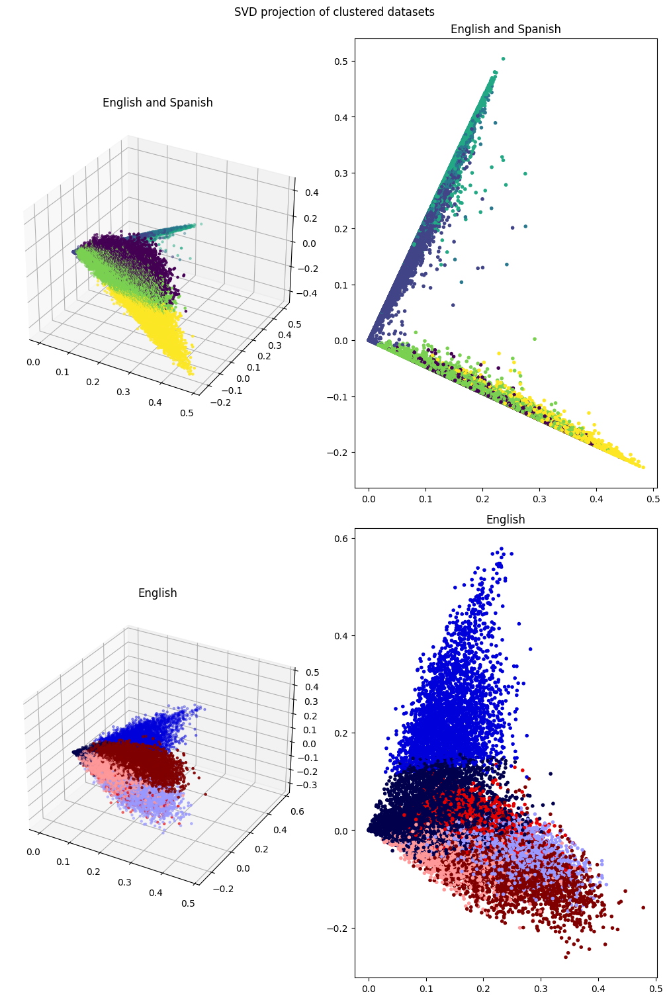

In [ ]:
fig = plt.figure(layout="constrained", figsize=(10,15))
ax = fig.subplot_mosaic('''ab
                          cd''', per_subplot_kw={
        "a": {"projection": "3d"},
        "c": {"projection": "3d"}
        })

fig.suptitle('SVD projection of clustered datasets')
ax["a"].scatter(x_en_es, y_en_es, z_en_es, c=kmeans_en_es.labels_, marker='.');
ax['a'].title.set_text('English and Spanish')
ax["b"].scatter(x_en_es_2,y_en_es_2, c=kmeans_en_es.labels_, marker='.');
ax['b'].title.set_text('English and Spanish')
ax["c"].scatter(x_en, y_en, z_en, c=kmeans_en.labels_, marker='.', cmap = "seismic");
ax['c'].title.set_text('English')
ax["d"].scatter(x_en_2,y_en_2, c=kmeans_en.labels_, marker='.',  cmap = "seismic");
ax['d'].title.set_text('English')

**Comment:** In the first 2 charts we can see that the clustering may depend on the language of the text. We rerun the clustering again only for English texts and were able to distinguish 6 classes.

### Topic modeling for 6 labels

Also only for english data set we want to check how many different topics can be extracted from text samples.

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('punkt')
import re, string
from nltk.tokenize import word_tokenize


stopword_en = nltk.corpus.stopwords.words('english')
stopword_es = nltk.corpus.stopwords.words('spanish')
stopword = set(stopword_en + stopword_es)
def clean_data(df):
      def clean(text):
            '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
            and remove words containing numbers.'''
            text = text.lower()
            text = re.sub('\[.*?\]', '', text)
            text = re.sub('https?://\S+|www\.\S+', '', text)
            text = re.sub('<.*?>+', '', text)
            text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
            text = re.sub('\n', '', text)
            text = re.sub('\w*\d\w*', '', text)
            return text
      # Applying the cleaning function to both test and training datasets
      df['text_clean'] = df['text'].apply(lambda x: clean(x))
      df['text_clean'] = df['text_clean'].apply(word_tokenize)
      df['text_clean'] = df['text_clean'].apply(lambda x: [word for word in x if word not in stopword])
      df['text_clean'] = [' '.join(map(str, word)) for word in df['text_clean']]
      return df

from sklearn.model_selection import train_test_split


dataset_en = read_dataset(languages = ['en'], dataset_dir = 'subtask_2')
clean_data(dataset_en)
labels_for_split = [f"{sample}" for sample in dataset_en["label"]]
documents_en = [f"{sample}" for sample in dataset_en["text_clean"]]


documents_train, documents_test, label_train, label_test = train_test_split(documents_en, labels_for_split, test_size=0.3)
print('No. training docs:', len(documents_train))
print('No. testing docs:', len(documents_test))

from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer(min_df=4,max_df=.6)
vector_documents_train = vectorizer.fit_transform(documents_train)

vocab = vectorizer.get_feature_names_out()
len(vocab)


In [ ]:
#LDA

from sklearn.decomposition import LatentDirichletAllocation

lda = LatentDirichletAllocation(n_components=10, verbose=1, learning_method='online', max_iter=50)
lda.fit(vector_documents_train);

vector_documents_test = vectorizer.transform(documents_test)
lda.perplexity(vector_documents_test)

iteration: 1 of max_iter: 50
iteration: 2 of max_iter: 50
iteration: 3 of max_iter: 50
iteration: 4 of max_iter: 50
iteration: 5 of max_iter: 50
iteration: 6 of max_iter: 50
iteration: 7 of max_iter: 50
iteration: 8 of max_iter: 50
iteration: 9 of max_iter: 50
iteration: 10 of max_iter: 50
iteration: 11 of max_iter: 50
iteration: 12 of max_iter: 50
iteration: 13 of max_iter: 50
iteration: 14 of max_iter: 50
iteration: 15 of max_iter: 50
iteration: 16 of max_iter: 50
iteration: 17 of max_iter: 50
iteration: 18 of max_iter: 50
iteration: 19 of max_iter: 50
iteration: 20 of max_iter: 50
iteration: 21 of max_iter: 50
iteration: 22 of max_iter: 50
iteration: 23 of max_iter: 50
iteration: 24 of max_iter: 50
iteration: 25 of max_iter: 50
iteration: 26 of max_iter: 50
iteration: 27 of max_iter: 50
iteration: 28 of max_iter: 50
iteration: 29 of max_iter: 50
iteration: 30 of max_iter: 50
iteration: 31 of max_iter: 50
iteration: 32 of max_iter: 50
iteration: 33 of max_iter: 50
iteration: 34 of ma

3324.9562079393068

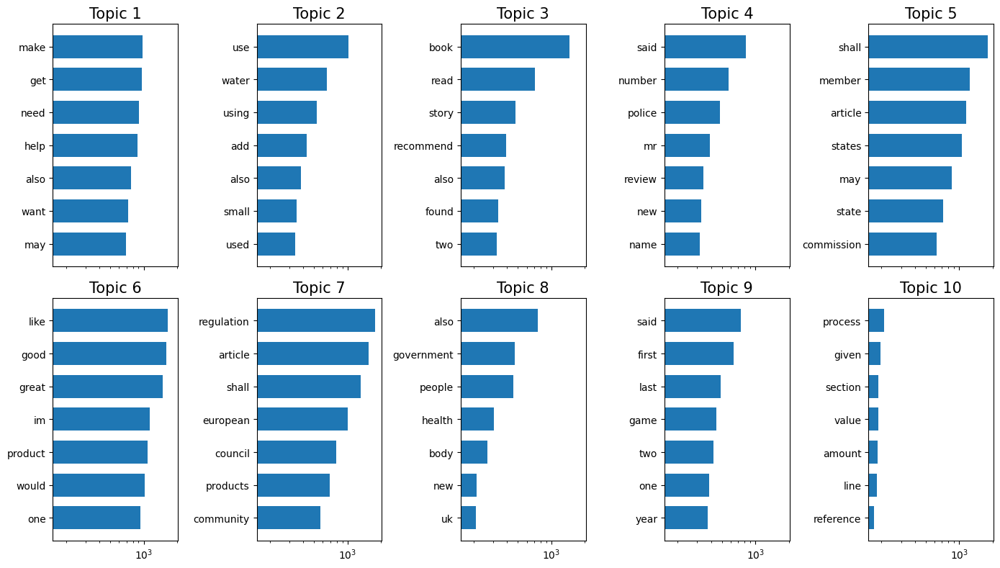

In [ ]:
#LDA

from sklearn.decomposition import LatentDirichletAllocation

lda = LatentDirichletAllocation(n_components=10, verbose=1, learning_method='online', max_iter=50)
lda.fit(vector_documents_train);

vector_documents_test = vectorizer.transform(documents_test)
lda.perplexity(vector_documents_test)


num_words = 7
cols = 5
rows = 2

fig, axes = plt.subplots(rows, cols, figsize=(14, 4 * rows), sharex=True)
axes = axes.flatten()
for topic_idx, topic in enumerate(lda.components_):
    top_terms_index = topic.argsort()[:-num_words - 1:-1]
    top_terms = [vocab[i] for i in top_terms_index]
    weights = topic[top_terms_index]
    ax = axes[topic_idx]
    ax.barh(top_terms, weights, height=0.7)
    ax.set_title(f'Topic {topic_idx +1}',fontdict={'fontsize': 15})
    ax.invert_yaxis()
    ax.set_xscale('log')

plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)
plt.tight_layout()
plt.show()

## ML Classifiers

First we present simple machine learning classifiers: Logistic Regression, Naive Bayes, Random Forest and XGBoost. Each model is learned on features extracted during the data preprocessing.

### Convert text to feature vector
In this part we cleaned and preprocessed the data and convert text to feature vector to create a training dataset.

In [ ]:
y = np.asarray(dataset['label'].apply(lambda i : classes[i])).astype(int)
x=dataset.text
x_lemma=dataset.text_pos.apply(lambda i: ' '.join([str(j[2]) for j in i]))
x_clean=dataset.text_clean_pos.apply(lambda i: ' '.join([str(j[2]) for j in i]))
x_pos=dataset.text_pos.apply(lambda i: ' '.join([str(j[2])+'_'+str(j[1])for j in i]))
x_with_additional_feature=np.array([[i]+MyCustomFeatures.extract_custom_features(MyCustomFeatures(),i) for i in x_pos])
x_augmented=dataset_augmented.text
y_augmented = np.asarray(dataset_augmented['label'].apply(lambda i : classes[i])).astype(int)

len(x),len(x_lemma),len(x_clean),len(x_pos),x_with_additional_feature.shape,len(y),len(x_augmented),len(y_augmented)

(44351, 44351, 44351, 44351, 44351, 46351, 46351)

In [ ]:
# Split into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size=0.2, random_state=seed)
x_lemma_train, x_lemma_test, y_train, y_test = train_test_split(x_lemma, y,test_size=0.2, random_state=seed)
x_clean_train, x_clean_test, y_train, y_test = train_test_split(x_clean, y,test_size=0.2, random_state=seed)
x_pos_train, x_pos_test, y_train, y_test = train_test_split(x_pos, y,test_size=0.2, random_state=seed)
x_waf_train, x_waf_test, y_train, y_test = train_test_split(x_with_additional_feature, y,test_size=0.2, random_state=seed)
x_aug_train, x_aug_test, y_aug_train, y_aug_test = train_test_split(x_augmented, y_augmented,test_size=0.2, random_state=seed)

In [ ]:
def vectorize(train_data,test_data,vectorizer):
    vectorizer.fit(train_data)
    train_vector=vectorizer.transform(train_data)
    test_vector=vectorizer.transform(test_data)
    return train_vector,test_vector

In [ ]:
def my_preprocessor(doc):
  # Should do POS here, but too slow!, no
  return MyCustomFeatures.remove_punctuation(None,doc)

customized_vectorizer = FeatureUnion([
  ('custom', MyCustomFeatures()),
  ('cv', TfidfVectorizer(preprocessor=my_preprocessor)),
  # ('cv', CountVectorizer(preprocessor=my_preprocessor))
])

count_vectorizer = CountVectorizer()
tfidf_vectorizer = TfidfVectorizer(min_df=2, max_df=0.5, ngram_range=(1, 2))

In [ ]:
def evaluate(model,train_data,train_label,test_data,test_label,path=None):
    model.fit(train_data,train_label)
    pred_y = model.predict(test_data)
    print(sklearn.metrics.classification_report(test_label, pred_y))
    cm = confusion_matrix(test_label, pred_y, normalize='true')

    # Plot the confusion matrix
    plt.figure(figsize=(8,6))
    sns.heatmap(cm.T, annot=True, xticklabels=classes_names, yticklabels=classes_names)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.show()
    if path is not None:
        pickle.dump(model,open(path,'wb'))

### Logistic Regression

#### Base Case: with original data vector

              precision    recall  f1-score   support

           0       0.50      0.51      0.50      1432
           1       0.35      0.32      0.34      1436
           2       0.33      0.36      0.35      1380
           3       0.45      0.43      0.44      1578
           4       0.36      0.34      0.35      1532
           5       0.61      0.65      0.63      1513

    accuracy                           0.44      8871
   macro avg       0.43      0.44      0.44      8871
weighted avg       0.44      0.44      0.44      8871



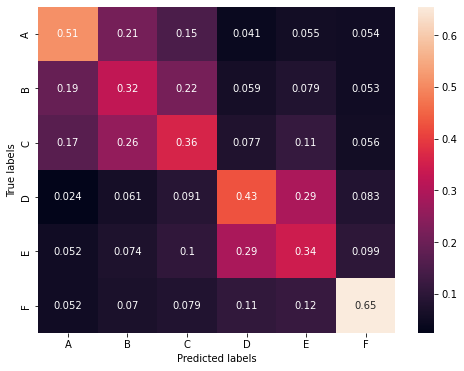

In [ ]:
# with CountVectorizer
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_train,x_test,count_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

              precision    recall  f1-score   support

           0       0.50      0.58      0.54      1432
           1       0.40      0.34      0.37      1436
           2       0.38      0.33      0.35      1380
           3       0.45      0.49      0.47      1578
           4       0.39      0.38      0.39      1532
           5       0.62      0.68      0.65      1513

    accuracy                           0.47      8871
   macro avg       0.46      0.47      0.46      8871
weighted avg       0.46      0.47      0.46      8871



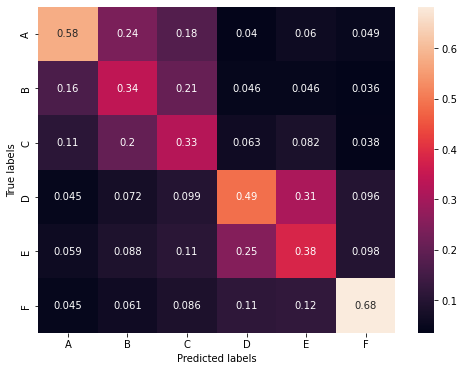

In [ ]:
# with TFIDFVectorizer
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_train,x_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

              precision    recall  f1-score   support

           0       0.52      0.58      0.54      1432
           1       0.38      0.31      0.34      1436
           2       0.37      0.32      0.34      1380
           3       0.41      0.46      0.44      1578
           4       0.37      0.31      0.33      1532
           5       0.54      0.66      0.59      1513

    accuracy                           0.44      8871
   macro avg       0.43      0.44      0.43      8871
weighted avg       0.43      0.44      0.43      8871



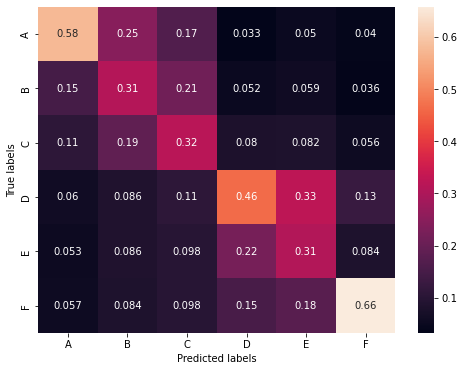

In [ ]:
# with CustomizedVectorizer
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_train,x_test,customized_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

Observations: the TF-IDF vectorizer outperforms the other ones, so we adopt it in the next trainings. 

#### Advanced: with preprocessed data

              precision    recall  f1-score   support

           0       0.41      0.44      0.43      1432
           1       0.33      0.29      0.31      1436
           2       0.29      0.28      0.29      1380
           3       0.39      0.39      0.39      1578
           4       0.34      0.31      0.32      1532
           5       0.56      0.63      0.59      1513

    accuracy                           0.39      8871
   macro avg       0.39      0.39      0.39      8871
weighted avg       0.39      0.39      0.39      8871



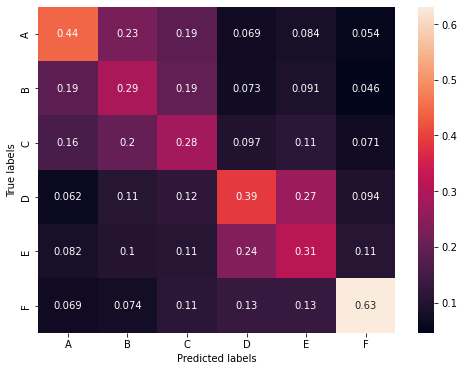

In [ ]:
# with cleaned data
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_clean_train,x_clean_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

              precision    recall  f1-score   support

           0       0.50      0.58      0.54      1432
           1       0.40      0.30      0.34      1436
           2       0.37      0.35      0.36      1380
           3       0.46      0.48      0.47      1578
           4       0.40      0.37      0.39      1532
           5       0.60      0.70      0.64      1513

    accuracy                           0.47      8871
   macro avg       0.46      0.46      0.46      8871
weighted avg       0.46      0.47      0.46      8871



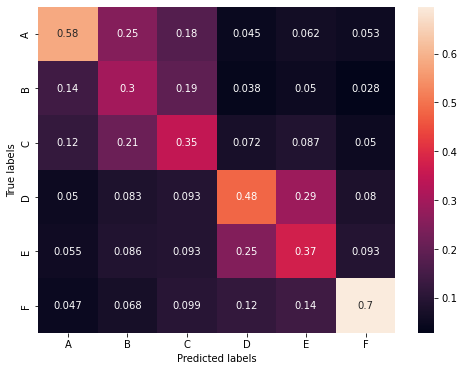

In [ ]:
# with lemmatized data
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_lemma_train,x_lemma_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

              precision    recall  f1-score   support

           0       0.54      0.60      0.57      1432
           1       0.42      0.33      0.37      1436
           2       0.41      0.37      0.39      1380
           3       0.47      0.48      0.47      1578
           4       0.40      0.39      0.39      1532
           5       0.63      0.73      0.68      1513

    accuracy                           0.49      8871
   macro avg       0.48      0.48      0.48      8871
weighted avg       0.48      0.49      0.48      8871



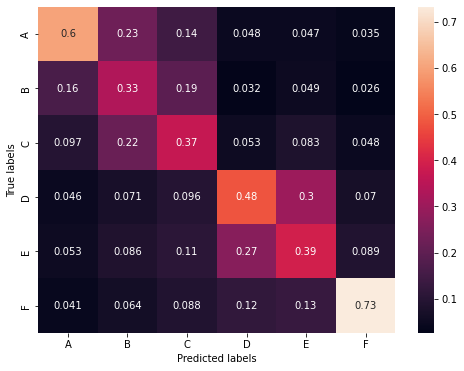

In [ ]:
# data with postag
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_pos_train,x_pos_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

In [ ]:
# data with additional features
from scipy.sparse import hstack
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_waf_train[:,0],x_waf_test[:,0],tfidf_vectorizer)
train_vector=hstack((train_vector,x_waf_train[:,1:].astype(np.float64)))
test_vector=hstack((test_vector,x_waf_test[:,1:].astype(np.float64)))
evaluate(model,train_vector,y_train,test_vector,y_test)

              precision    recall  f1-score   support

           0       0.50      0.59      0.54      1480
           1       0.41      0.33      0.37      1527
           2       0.40      0.33      0.36      1492
           3       0.44      0.47      0.45      1562
           4       0.38      0.37      0.38      1603
           5       0.63      0.69      0.66      1607

    accuracy                           0.47      9271
   macro avg       0.46      0.46      0.46      9271
weighted avg       0.46      0.47      0.46      9271



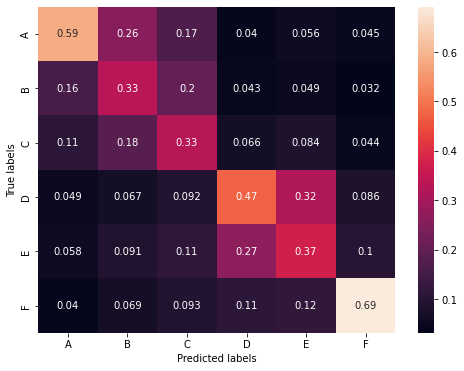

In [ ]:
# Augmented data
model=LogisticRegression(C=1.0)
train_vector,test_vector=vectorize(x_aug_train,x_aug_test,tfidf_vectorizer)
evaluate(model,train_vector,y_aug_train,test_vector,y_aug_test)

Observations: the data with postag text results to be the best choice.

### Naive Bayes

              precision    recall  f1-score   support

           0       0.55      0.40      0.46      1432
           1       0.33      0.33      0.33      1436
           2       0.29      0.35      0.32      1380
           3       0.39      0.49      0.43      1578
           4       0.35      0.30      0.33      1532
           5       0.62      0.59      0.60      1513

    accuracy                           0.41      8871
   macro avg       0.42      0.41      0.41      8871
weighted avg       0.42      0.41      0.41      8871



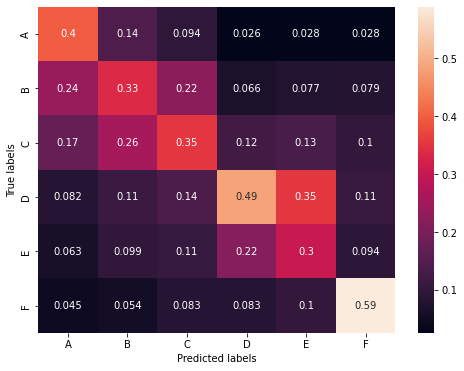

In [ ]:
# with TFIDFVectorizer
model=MultinomialNB()
train_vector,test_vector=vectorize(x_pos_train,x_pos_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

### RandomForest

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 152 tasks      | elapsed:   23.2s
[Parallel(n_jobs=-1)]: Done 400 out of 400 | elapsed:   56.5s finished
[Parallel(n_jobs=24)]: Using backend ThreadingBackend with 24 concurrent workers.
[Parallel(n_jobs=24)]: Done   2 tasks      | elapsed:    3.2s
[Parallel(n_jobs=24)]: Done 152 tasks      | elapsed:    3.4s


              precision    recall  f1-score   support

           0       0.48      0.65      0.55      1432
           1       0.39      0.18      0.25      1436
           2       0.37      0.19      0.25      1380
           3       0.42      0.51      0.46      1578
           4       0.37      0.31      0.33      1532
           5       0.52      0.80      0.63      1513

    accuracy                           0.44      8871
   macro avg       0.42      0.44      0.41      8871
weighted avg       0.42      0.44      0.42      8871



[Parallel(n_jobs=24)]: Done 400 out of 400 | elapsed:    3.8s finished


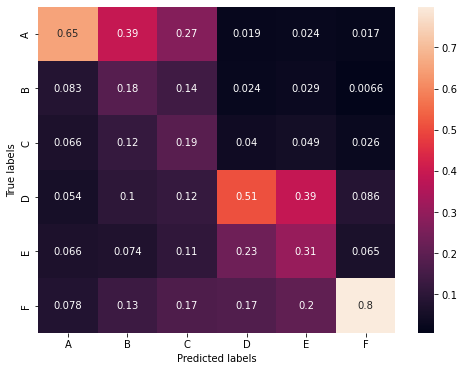

In [ ]:
model=RandomForestClassifier(n_estimators =400,criterion="entropy",random_state =seed,verbose=1,n_jobs=-1)
train_vector,test_vector=vectorize(x_pos_train,x_pos_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

### XGBoost

              precision    recall  f1-score   support

           0       0.58      0.60      0.59      1432
           1       0.39      0.32      0.35      1436
           2       0.38      0.31      0.34      1380
           3       0.43      0.43      0.43      1578
           4       0.38      0.36      0.37      1532
           5       0.58      0.76      0.66      1513

    accuracy                           0.47      8871
   macro avg       0.46      0.47      0.46      8871
weighted avg       0.46      0.47      0.46      8871



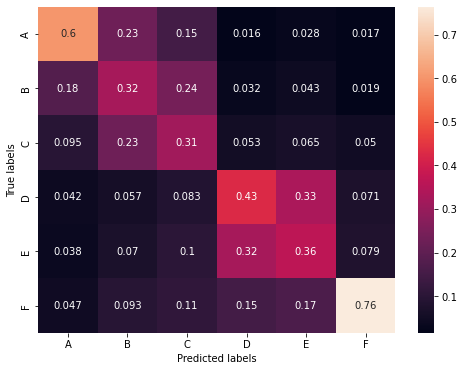

In [ ]:
model=xgb.XGBClassifier(n_estimators=400, colsample_bytree=0.8,
                        subsample=0.8, nthread=10, learning_rate=0.1)
train_vector,test_vector=vectorize(x_pos_train,x_pos_test,tfidf_vectorizer)
evaluate(model,train_vector,y_train,test_vector,y_test)

## Recurrent Neural Networks

### Data preparation
For data preparation we clean the texts, lemmatize, add POS tagging for several versions of the datasets. We are comparing the performance with different data to check the results.

In [ ]:
y = np.asarray(dataset['label'].apply(lambda i : classes[i])).astype(int)
x=dataset.text
x_lemma=dataset.text_pos.apply(lambda i: ' '.join([str(j[2]) for j in i]))
x_clean=dataset.text_clean_pos.apply(lambda i: ' '.join([str(j[2]) for j in i]))
x_pos=dataset.text_pos.apply(lambda i: ' '.join([str(j[2])+'_'+str(j[1])for j in i]))
x_with_additional_feature=np.array([[i]+MyCustomFeatures.extract_custom_features(MyCustomFeatures(),i) for i in x_pos])
x_augmented=dataset_augmented.text
y_augmented = np.asarray(dataset_augmented['label'].apply(lambda i : classes[i])).astype(int)
print(len(x),len(x_lemma),len(x_clean),len(x_pos),x_with_additional_feature.shape,len(y),len(x_augmented),len(y_augmented))
print(max([len(obj.split(" ")) for obj in x_pos]))

# Split into train and test sets
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size=0.2, random_state=seed)
x_lemma_train, x_lemma_test, y_train, y_test = train_test_split(x_lemma, y,test_size=0.2, random_state=seed)
x_clean_train, x_clean_test, y_train, y_test = train_test_split(x_clean, y,test_size=0.2, random_state=seed)
x_pos_train, x_pos_test, y_train, y_test = train_test_split(x_pos, y,test_size=0.2, random_state=seed)
x_waf_train, x_waf_test, y_train, y_test = train_test_split(x_with_additional_feature, y,test_size=0.2, random_state=seed)
x_aug_train, x_aug_test, y_aug_train, y_aug_test = train_test_split(x_pos, y,test_size=0.2, random_state=seed)

44351 44351 44351 44351 (44351, 3) 44351 46351 46351
193


In [ ]:
# from tensorflow.keras.layers import TextVectorization
# https://www.tensorflow.org/tutorials/keras/text_classification
def custom_standardization(input_data):
  # POS, but too slow so stick to old method
  # processed = tf.strings.lower(input_data)
  processed = tf.strings.regex_replace(input_data,'[%s]' % re.escape(string.punctuation),'')
  processed = input_data
  return processed

def vectorize(train_data,test_data,max_len = 200):
    token = text.Tokenizer(num_words=None)
    token.fit_on_texts(list(train_data) + list(test_data))
    xtrain_seq = token.texts_to_sequences(train_data)
    xvalid_seq = token.texts_to_sequences(test_data)

    #zero pad the sequences
    xtrain_pad = sequence.pad_sequences(xtrain_seq, maxlen=max_len)
    xvalid_pad = sequence.pad_sequences(xvalid_seq, maxlen=max_len)
    return xtrain_pad,xvalid_pad, token.word_index

optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4)
loss=tf.keras.losses.SparseCategoricalCrossentropy()


def evaluate(model,train_data,train_label,test_data,test_label,path=None,batch_size=128,patience=1,epochs=10):
    history=model.fit(train_data,train_label,epochs=epochs, batch_size=batch_size,validation_data=(test_data,test_label)).history
    plt.figure(figsize=(15,5))
    plt.plot(history['loss'], label='Training', alpha=.8, color='#ff7f0e')
    plt.plot(history['val_loss'], label='Validation', alpha=.8, color='#3A27ED')
    plt.legend(loc='upper left')
    plt.title('Categorical Crossentropy')
    plt.grid(alpha=.3)
    plt.figure(figsize=(15,5))
    plt.plot(history['accuracy'], label='Training', alpha=.8, color='#ff7f0e')
    plt.plot(history['val_accuracy'], label='Validation', alpha=.8, color='#3A27ED')
    plt.legend(loc='upper left')
    plt.title('Accuracy')
    plt.grid(alpha=.3)
    plt.show()
    pred_y = model.predict(test_data)
    pred_y = pred_y.argmax(1)
    print(sklearn.metrics.classification_report(test_label, pred_y))
    cm = confusion_matrix(test_label, pred_y, normalize='true')
    # Plot the confusion matrix
    plt.figure(figsize=(8,6))
    sns.heatmap(cm.T, annot=True, xticklabels=classes_names, yticklabels=classes_names)
    plt.xlabel('Predicted labels')
    plt.ylabel('True labels')
    plt.show()
    if path is not None:
        model.save(path)

In [ ]:
train_vector,test_vector,word_index =vectorize(x_train,x_test)

### LSTM

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_15 (Embedding)    (None, None, 64)          5289536   
                                                                 
 lstm_16 (LSTM)              (None, 64)                33024     
                                                                 
 dense_18 (Dense)            (None, 6)                 390       
                                                                 
Total params: 5,322,950
Trainable params: 5,322,950
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
278/278 [==============================] - 6s 18ms/step - loss: 1.7664 - accuracy: 0.2106 - val_loss: 1.6922 - val_accuracy: 0.2908
Epoch 2/20
278/278 [==============================] - 5s 17ms/step - loss: 1.6014 - accuracy: 0.2907 - val_loss: 1.5610 - val_accuracy: 0.3032
Epoch 3/20
278/278 [=

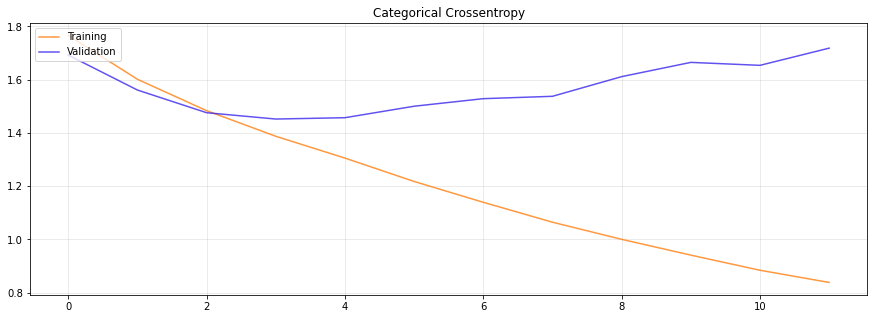

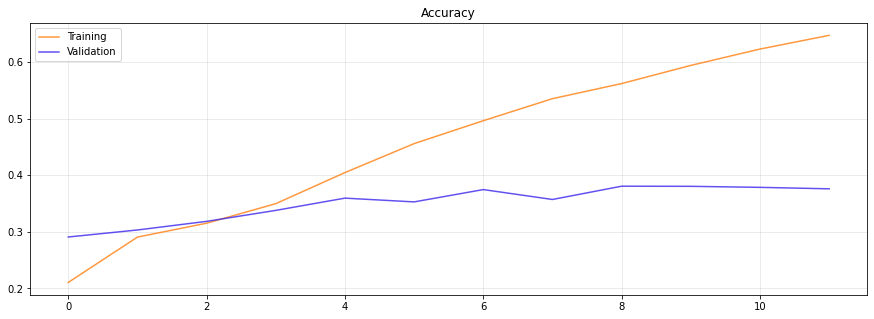

278/278 [==============================] - 1s 3ms/step
              precision    recall  f1-score   support

           0       0.60      0.40      0.48      1432
           1       0.33      0.31      0.32      1436
           2       0.25      0.35      0.29      1380
           3       0.49      0.38      0.43      1578
           4       0.32      0.22      0.26      1532
           5       0.40      0.61      0.48      1513

    accuracy                           0.38      8871
   macro avg       0.40      0.38      0.38      8871
weighted avg       0.40      0.38      0.38      8871



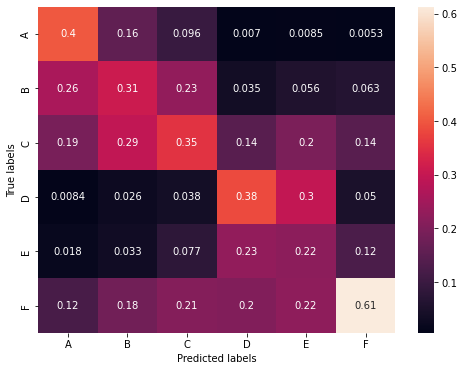

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.LSTM(64),
    tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### RNN

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_13 (Embedding)    (None, None, 64)          5289536   
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 64)                8256      
                                                                 
 dense_14 (Dense)            (None, 6)                 390       
                                                                 
Total params: 5,298,182
Trainable params: 5,298,182
Non-trainable params: 0
_________________________________________________________________
Epoch 1/3
278/278 [==============================] - 133s 477ms/step - loss: 1.7837 - accuracy: 0.1947 - val_loss: 1.7533 - val_accuracy: 0.2286
Epoch 2/3
278/278 [==============================] - 134s 484ms/step - loss: 1.6307 - accuracy: 0.3031 - val_loss: 1.5717 - val_accuracy: 0.3103
Epoch 3/3
278/278

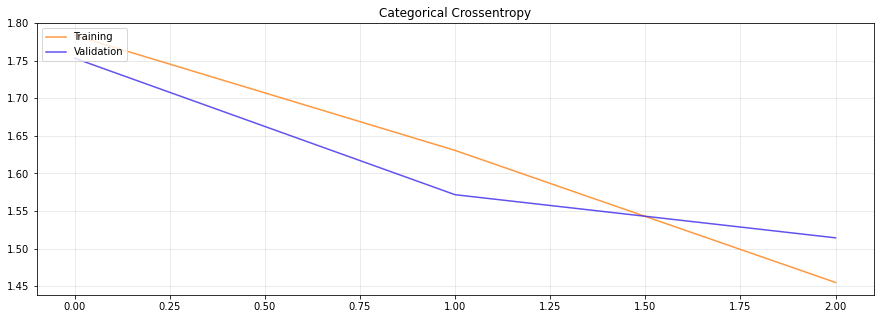

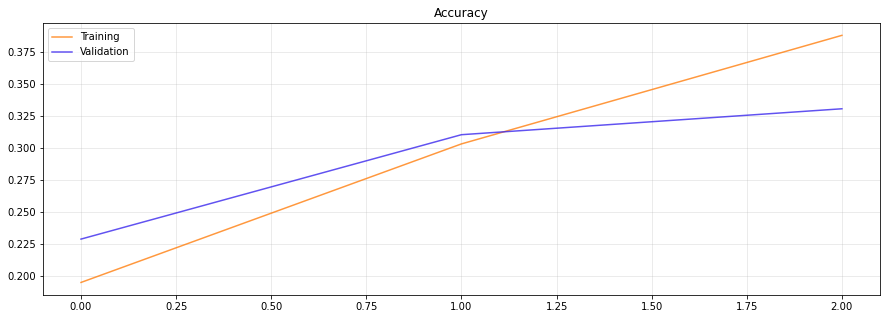

278/278 [==============================] - 15s 52ms/step
              precision    recall  f1-score   support

           0       0.35      0.71      0.47      1432
           1       0.27      0.17      0.20      1436
           2       0.26      0.09      0.14      1380
           3       0.36      0.24      0.29      1578
           4       0.32      0.24      0.27      1532
           5       0.33      0.53      0.41      1513

    accuracy                           0.33      8871
   macro avg       0.32      0.33      0.30      8871
weighted avg       0.32      0.33      0.30      8871



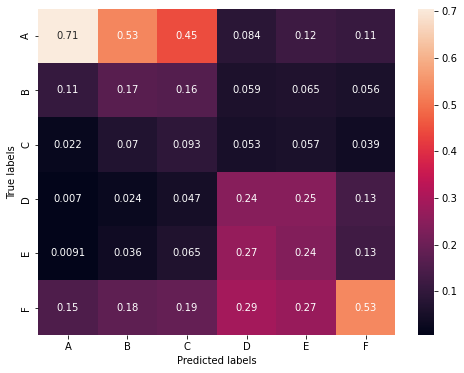

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64, mask_zero=True),
    tf.keras.layers.SimpleRNN(64),
    tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### GRU

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_14 (Embedding)    (None, None, 64)          5289536   
                                                                 
 gru_1 (GRU)                 (None, 64)                24960     
                                                                 
 dense_15 (Dense)            (None, 6)                 390       
                                                                 
Total params: 5,314,886
Trainable params: 5,314,886
Non-trainable params: 0
_________________________________________________________________
Epoch 1/3
278/278 [==============================] - 259s 925ms/step - loss: 1.6929 - accuracy: 0.2452 - val_loss: 1.5199 - val_accuracy: 0.3102
Epoch 2/3
278/278 [==============================] - 255s 916ms/step - loss: 1.4393 - accuracy: 0.3402 - val_loss: 1.4521 - val_accuracy: 0.3464
Epoch 3/3
278/278

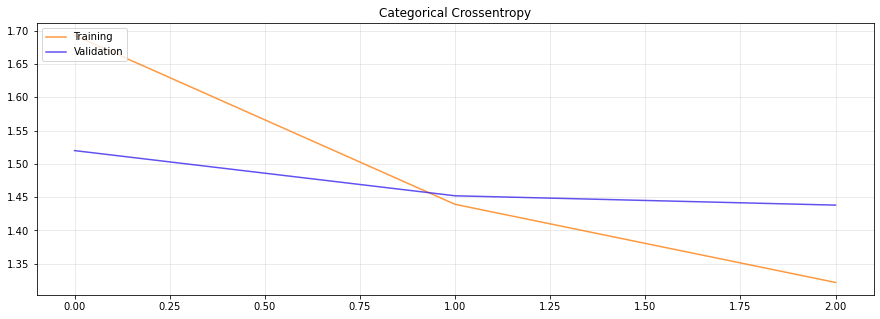

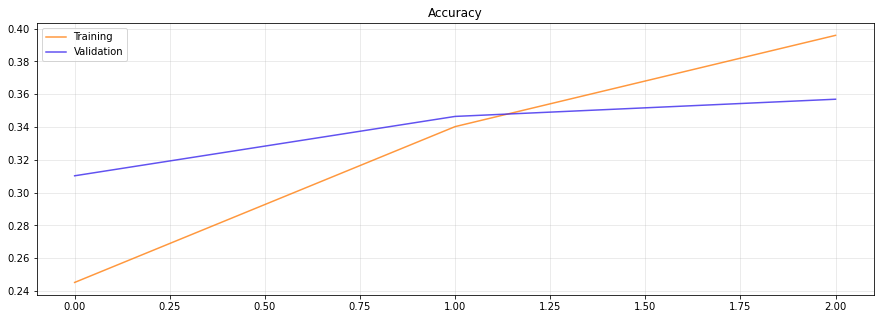

278/278 [==============================] - 48s 171ms/step
              precision    recall  f1-score   support

           0       0.44      0.67      0.53      1432
           1       0.32      0.07      0.11      1436
           2       0.26      0.26      0.26      1380
           3       0.43      0.55      0.48      1578
           4       0.34      0.08      0.13      1532
           5       0.29      0.50      0.37      1513

    accuracy                           0.36      8871
   macro avg       0.35      0.36      0.31      8871
weighted avg       0.35      0.36      0.32      8871



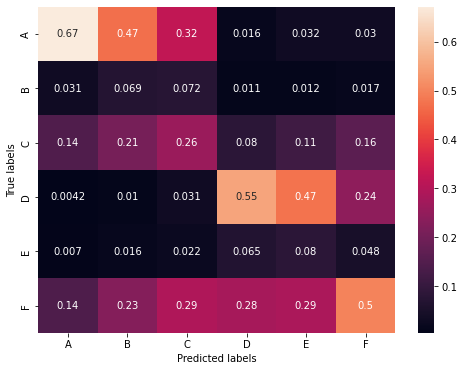

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64, mask_zero=True),
    tf.keras.layers.GRU(64),
    tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### Bidirectional LSTM

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_15 (Embedding)    (None, None, 64)          5289536   
                                                                 
 bidirectional_11 (Bidirecti  (None, 128)              66048     
 onal)                                                           
                                                                 
 dense_16 (Dense)            (None, 6)                 774       
                                                                 
Total params: 5,356,358
Trainable params: 5,356,358
Non-trainable params: 0
_________________________________________________________________
Epoch 1/3
278/278 [==============================] - 433s 2s/step - loss: 1.5788 - accuracy: 0.2887 - val_loss: 1.4255 - val_accuracy: 0.3566
Epoch 2/3
278/278 [==============================] - 429s 2s/step - loss: 1.3123 - accuracy: 0.4202

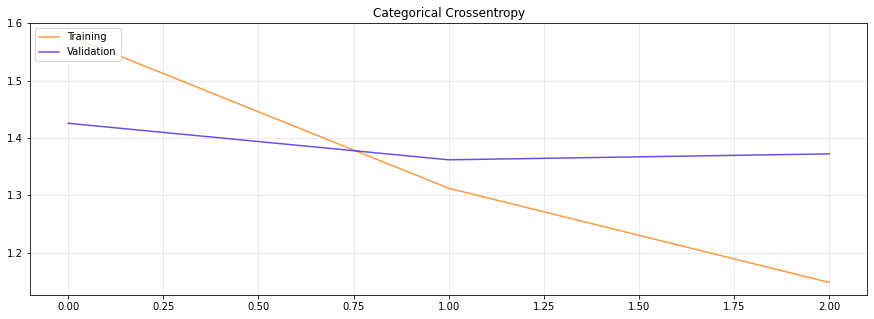

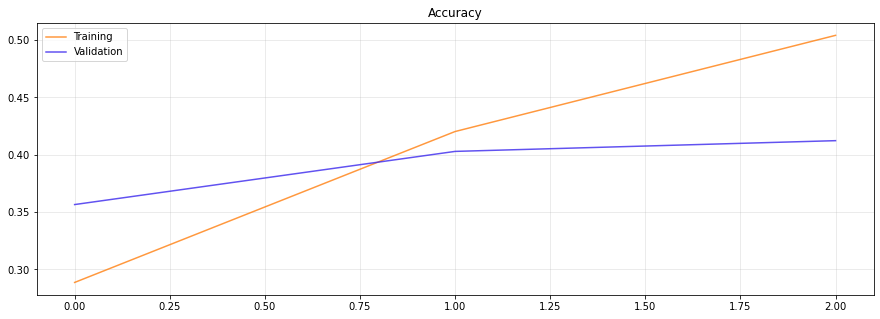

278/278 [==============================] - 72s 255ms/step
              precision    recall  f1-score   support

           0       0.57      0.51      0.54      1432
           1       0.32      0.22      0.26      1436
           2       0.30      0.46      0.37      1380
           3       0.51      0.39      0.44      1578
           4       0.37      0.22      0.27      1532
           5       0.43      0.68      0.52      1513

    accuracy                           0.41      8871
   macro avg       0.42      0.41      0.40      8871
weighted avg       0.42      0.41      0.40      8871



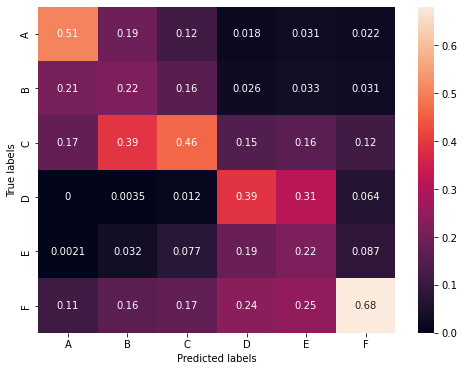

In [ ]:
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64, mask_zero=True),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### Data PreProcessing

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_19 (Embedding)    (None, None, 64)          3980288   
                                                                 
 bidirectional_15 (Bidirecti  (None, 128)              66048     
 onal)                                                           
                                                                 
 dense_22 (Dense)            (None, 6)                 774       
                                                                 
Total params: 4,047,110
Trainable params: 4,047,110
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
278/278 [==============================] - 9s 26ms/step - loss: 1.7339 - accuracy: 0.2347 - val_loss: 1.6239 - val_accuracy: 0.2960
Epoch 2/20
278/278 [==============================] - 7s 25ms/step - loss: 1.4797 - accuracy: 0.36

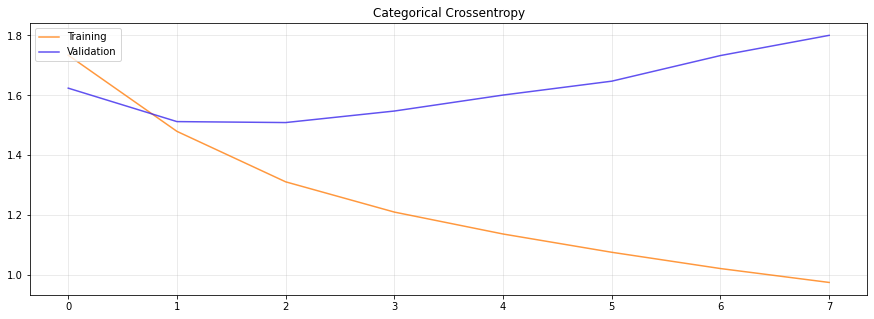

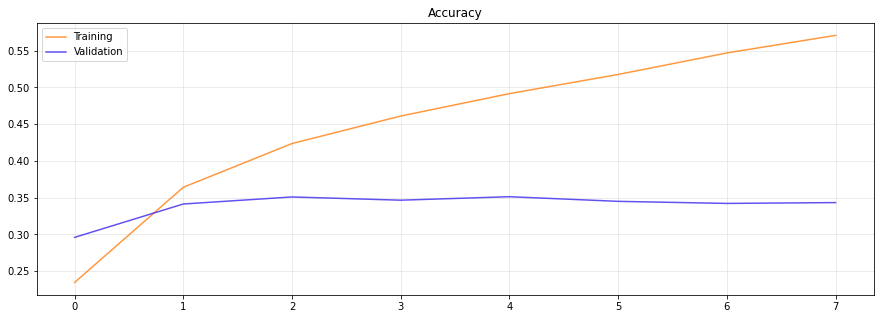

278/278 [==============================] - 2s 5ms/step
              precision    recall  f1-score   support

           0       0.43      0.39      0.41      1432
           1       0.25      0.13      0.17      1436
           2       0.22      0.33      0.26      1380
           3       0.39      0.37      0.38      1578
           4       0.28      0.21      0.24      1532
           5       0.47      0.68      0.55      1513

    accuracy                           0.35      8871
   macro avg       0.34      0.35      0.34      8871
weighted avg       0.34      0.35      0.34      8871



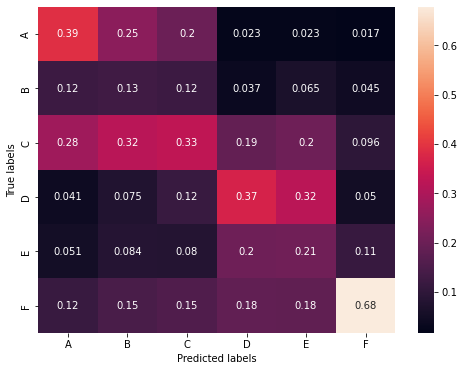

In [ ]:
# clean text
train_vector,test_vector,word_index = vectorize(x_clean_train,x_clean_test)

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_20 (Embedding)    (None, None, 64)          4060416   
                                                                 
 bidirectional_16 (Bidirecti  (None, 128)              66048     
 onal)                                                           
                                                                 
 dense_23 (Dense)            (None, 6)                 774       
                                                                 
Total params: 4,127,238
Trainable params: 4,127,238
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
278/278 [==============================] - 9s 26ms/step - loss: 1.6293 - accuracy: 0.2793 - val_loss: 1.5006 - val_accuracy: 0.3238
Epoch 2/20
278/278 [==============================] - 7s 24ms/step - loss: 1.4305 - accuracy: 0.35

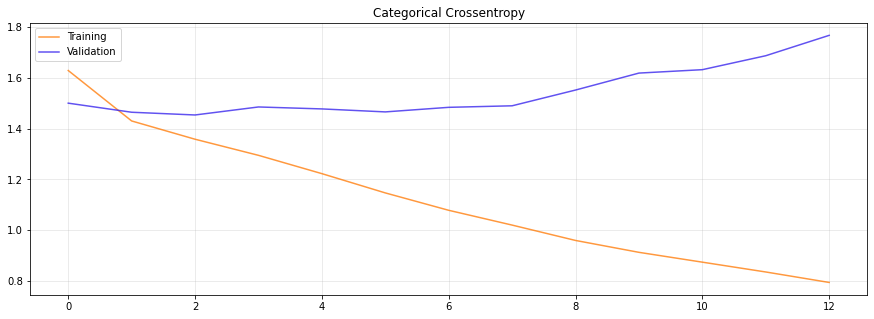

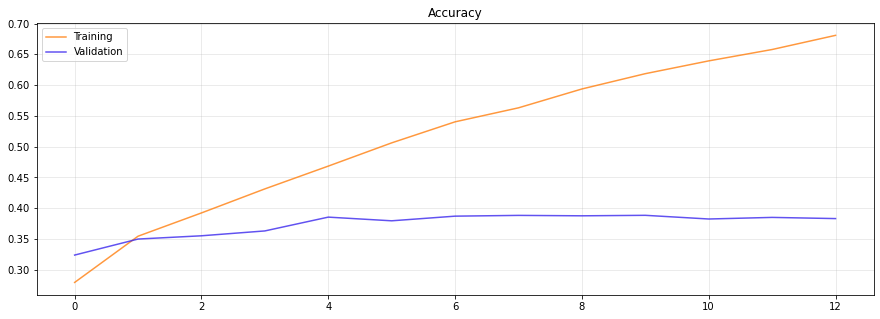

278/278 [==============================] - 2s 5ms/step
              precision    recall  f1-score   support

           0       0.64      0.40      0.49      1432
           1       0.34      0.31      0.32      1436
           2       0.23      0.31      0.27      1380
           3       0.51      0.37      0.43      1578
           4       0.29      0.30      0.29      1532
           5       0.47      0.63      0.54      1513

    accuracy                           0.39      8871
   macro avg       0.41      0.39      0.39      8871
weighted avg       0.41      0.39      0.39      8871



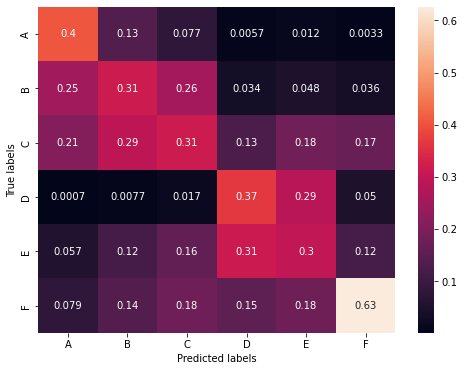

In [ ]:
# lemmatized text
train_vector,test_vector,word_index =rnn_vectorize(x_lemma_train,x_lemma_test)

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_21 (Embedding)    (None, None, 64)          4061120   
                                                                 
 bidirectional_17 (Bidirecti  (None, 128)              66048     
 onal)                                                           
                                                                 
 dense_24 (Dense)            (None, 6)                 774       
                                                                 
Total params: 4,127,942
Trainable params: 4,127,942
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
278/278 [==============================] - 9s 27ms/step - loss: 1.6389 - accuracy: 0.2858 - val_loss: 1.5039 - val_accuracy: 0.3460
Epoch 2/20
278/278 [==============================] - 7s 24ms/step - loss: 1.4267 - accuracy: 0.36

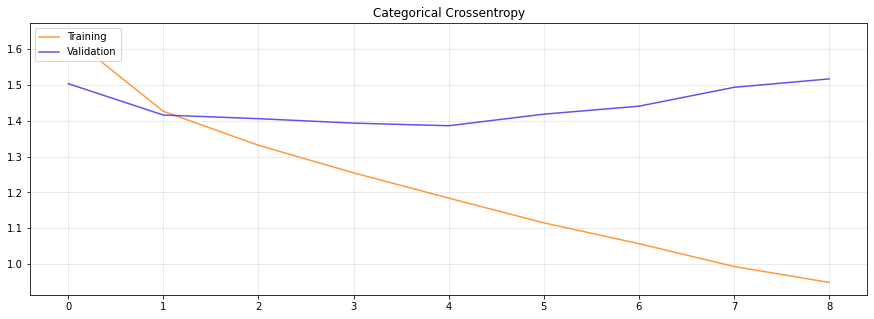

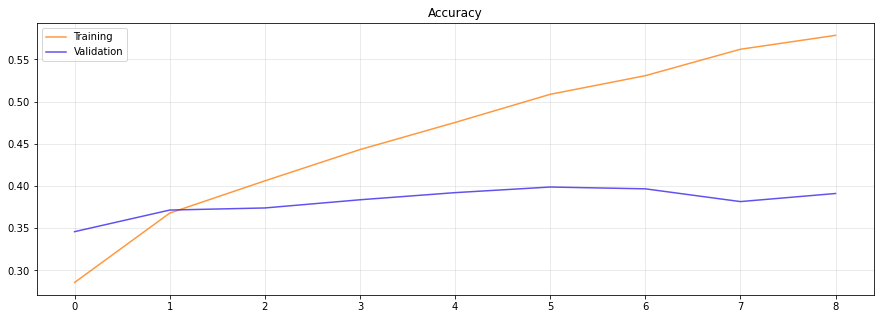

278/278 [==============================] - 2s 5ms/step
              precision    recall  f1-score   support

           0       0.55      0.49      0.52      1432
           1       0.36      0.30      0.33      1436
           2       0.29      0.36      0.32      1380
           3       0.42      0.59      0.49      1578
           4       0.28      0.10      0.15      1532
           5       0.43      0.55      0.48      1513

    accuracy                           0.40      8871
   macro avg       0.39      0.40      0.38      8871
weighted avg       0.39      0.40      0.38      8871



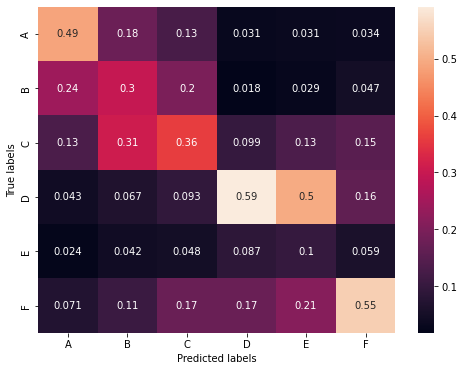

In [ ]:
# postag text
train_vector,test_vector,word_index = vectorize(x_pos_train,x_pos_test)

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_22 (Embedding)    (None, None, 64)          4061120   
                                                                 
 bidirectional_18 (Bidirecti  (None, 128)              66048     
 onal)                                                           
                                                                 
 dense_25 (Dense)            (None, 6)                 774       
                                                                 
Total params: 4,127,942
Trainable params: 4,127,942
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
278/278 [==============================] - 9s 26ms/step - loss: 1.6382 - accuracy: 0.2760 - val_loss: 1.5293 - val_accuracy: 0.3306
Epoch 2/20
278/278 [==============================] - 7s 24ms/step - loss: 1.4409 - accuracy: 0.35

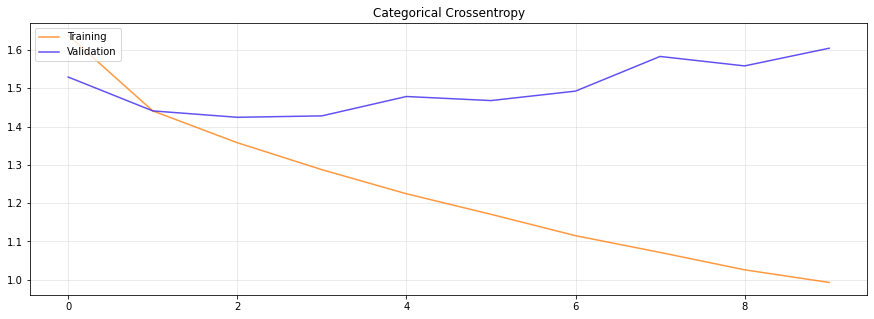

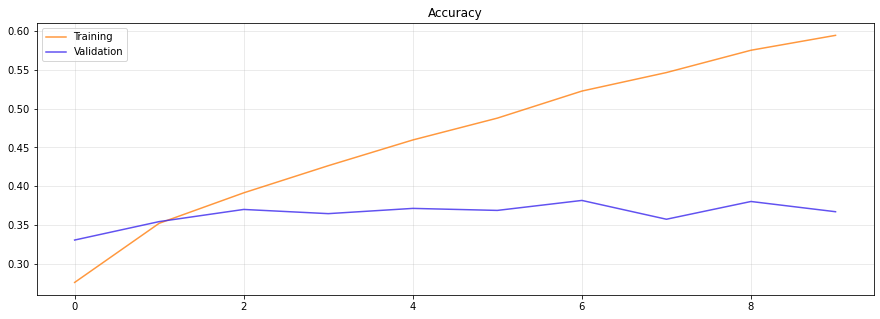

278/278 [==============================] - 2s 5ms/step
              precision    recall  f1-score   support

           0       0.46      0.61      0.53      1432
           1       0.34      0.19      0.25      1436
           2       0.30      0.29      0.30      1380
           3       0.48      0.40      0.43      1578
           4       0.36      0.21      0.26      1532
           5       0.34      0.58      0.43      1513

    accuracy                           0.38      8871
   macro avg       0.38      0.38      0.37      8871
weighted avg       0.38      0.38      0.37      8871



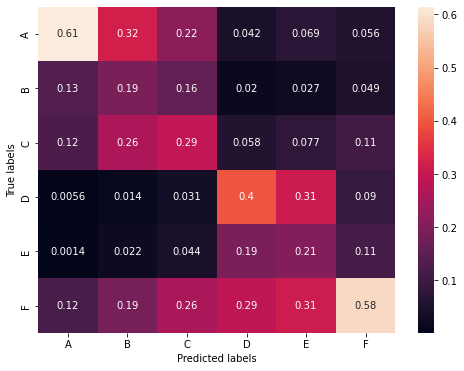

In [ ]:
# augmented data
train_vector,test_vector,word_index = vectorize(x_aug_train,x_aug_test)

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### More Features

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 202)]        0           []                               
                                                                                                  
 tf.__operators__.getitem (Slic  (None, 200)         0           ['Input[0][0]']                  
 ingOpLambda)                                                                                     
                                                                                                  
 embedding (Embedding)          (None, 200, 64)      4061120     ['tf.__operators__.getitem[0][0]'
                                                                 ]                                
                                                                                              

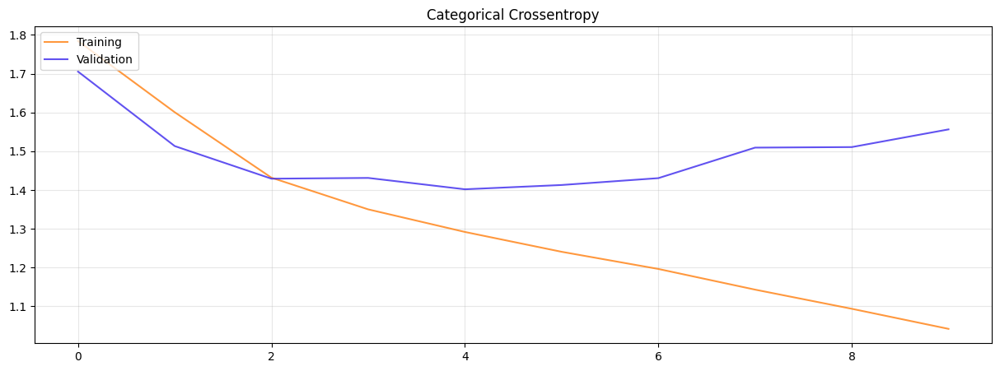

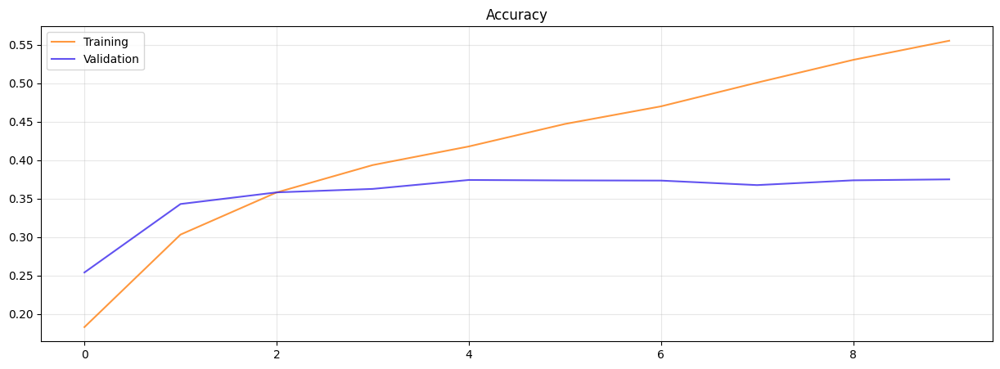

278/278 [==============================] - 2s 6ms/step
              precision    recall  f1-score   support

           0       0.52      0.46      0.49      1432
           1       0.34      0.27      0.30      1436
           2       0.29      0.34      0.31      1380
           3       0.42      0.56      0.48      1578
           4       0.29      0.11      0.16      1532
           5       0.35      0.51      0.42      1513

    accuracy                           0.37      8871
   macro avg       0.37      0.37      0.36      8871
weighted avg       0.37      0.37      0.36      8871



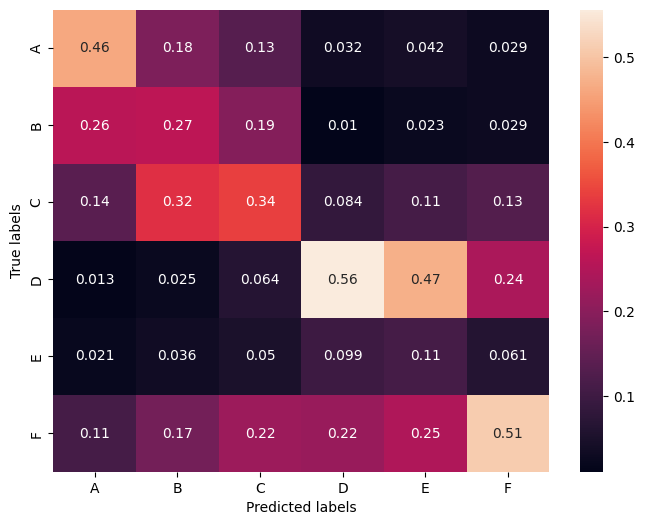

In [ ]:
def build_model_wfa(input_shape, text_dim=200):
    input_layer=tf.keras.Input(shape=input_shape,name='Input')
    input0,input1=input_layer[:,:text_dim],input_layer[:,text_dim:]
    # embedding=tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64, mask_zero=True)
    embedding=tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64)
    lstm=tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64))
    dense0=tf.keras.layers.Dense(32, activation='relu')
    dense1=tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
    layer=embedding(input0)
    layer=lstm(layer)
    layer=tf.concat((layer,input1),axis=1)
    layer=dense0(layer)
    layer=dense1(layer)
    model = tf.keras.Model(inputs=input_layer, outputs=layer, name='model')

    model.compile(loss=loss,optimizer=optimizer,metrics=['accuracy'])
    return model


train_vector,test_vector,word_index=vectorize(x_waf_train[:,0],x_waf_test[:,0])
train_vector=np.concatenate((train_vector,x_waf_train[:,1:].astype(np.float64)),axis=1)
test_vector=np.concatenate((test_vector,x_waf_test[:,1:].astype(np.float64)),axis=1)
model=build_model_wfa((202))
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### Deeper Network

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_25 (Embedding)    (None, None, 64)          4061120   
                                                                 
 bidirectional_21 (Bidirecti  (None, None, 128)        66048     
 onal)                                                           
                                                                 
 bidirectional_22 (Bidirecti  (None, None, 128)        98816     
 onal)                                                           
                                                                 
 bidirectional_23 (Bidirecti  (None, 128)              98816     
 onal)                                                           
                                                                 
 dense_29 (Dense)            (None, 6)                 774       
                                                     

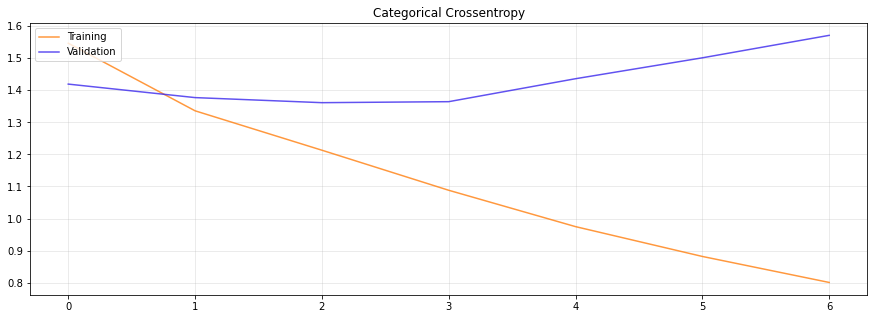

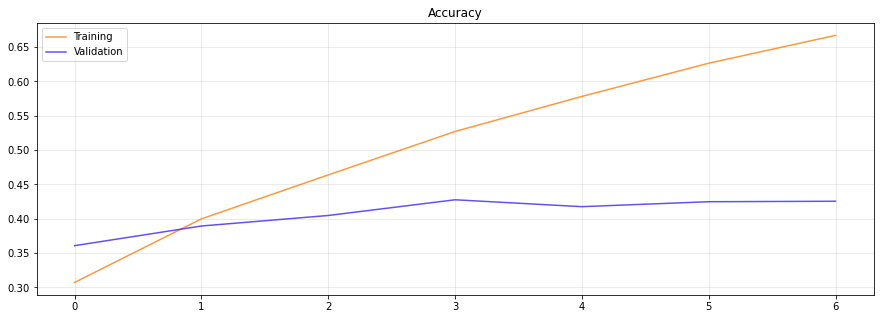

278/278 [==============================] - 11s 37ms/step
              precision    recall  f1-score   support

           0       0.61      0.49      0.54      1432
           1       0.35      0.31      0.33      1436
           2       0.30      0.39      0.34      1380
           3       0.46      0.40      0.43      1578
           4       0.35      0.33      0.34      1532
           5       0.53      0.64      0.58      1513

    accuracy                           0.43      8871
   macro avg       0.43      0.43      0.43      8871
weighted avg       0.43      0.43      0.43      8871



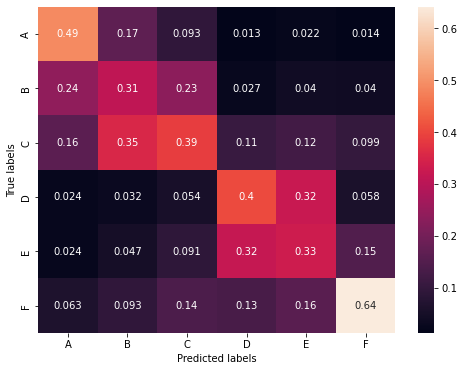

In [ ]:
train_vector,test_vector,word_index =vectorize(x_pos_train,x_pos_test)
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64,return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64,return_sequences=True)),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### Attention

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_26 (Embedding)    (None, None, 64)          4061120   
                                                                 
 bidirectional_24 (Bidirecti  (None, None, 128)        66048     
 onal)                                                           
                                                                 
 attention_2 (Attention)     (None, 128)               49152     
                                                                 
 dense_30 (Dense)            (None, 6)                 774       
                                                                 
Total params: 4,177,094
Trainable params: 4,177,094
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
278/278 [==============================] - 8s 25ms/step - loss: 1.5370 - accuracy: 0.3178 - val_lo

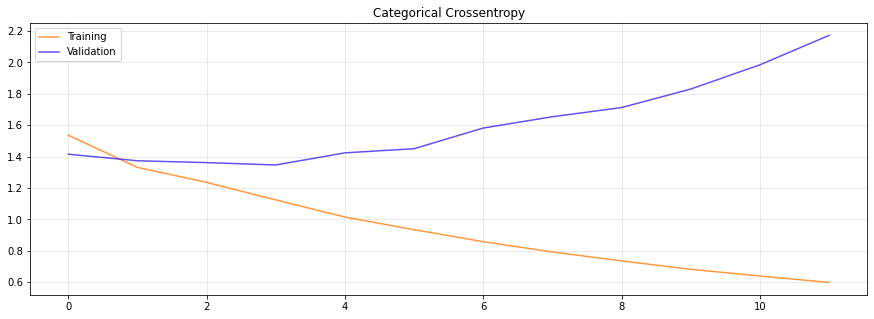

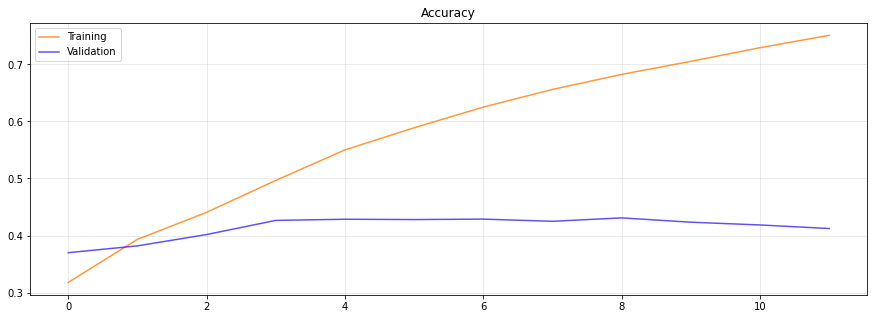

278/278 [==============================] - 2s 6ms/step
              precision    recall  f1-score   support

           0       0.52      0.47      0.49      1432
           1       0.34      0.35      0.35      1436
           2       0.29      0.30      0.30      1380
           3       0.49      0.45      0.47      1578
           4       0.34      0.26      0.29      1532
           5       0.55      0.75      0.63      1513

    accuracy                           0.43      8871
   macro avg       0.42      0.43      0.42      8871
weighted avg       0.42      0.43      0.42      8871



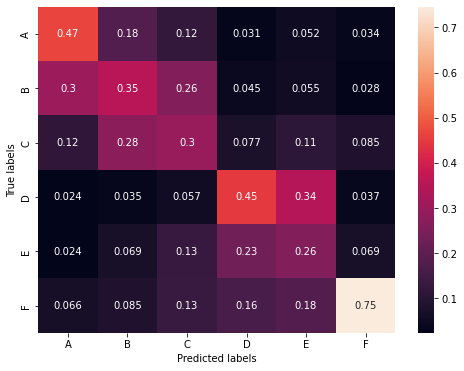

In [ ]:
train_vector,test_vector,word_index =vectorize(x_pos_train,x_pos_test)
model = tf.keras.Sequential([
    tf.keras.layers.Embedding(input_dim=len(word_index) +1, output_dim=64),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64,return_sequences=True)),
    Attention(),
    tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

### Precomputed Embeddings

0it [00:00, ?it/s]

Found 400000 word vectors.


  0%|          | 0/63454 [00:00<?, ?it/s]

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_27 (Embedding)    (None, 200, 100)          6345500   
                                                                 
 bidirectional_25 (Bidirecti  (None, 128)              84480     
 onal)                                                           
                                                                 
 dense_31 (Dense)            (None, 6)                 774       
                                                                 
Total params: 6,430,754
Trainable params: 6,430,754
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
278/278 [==============================] - 10s 32ms/step - loss: 1.6536 - accuracy: 0.2750 - val_loss: 1.5391 - val_accuracy: 0.3346
Epoch 2/20
278/278 [==============================] - 9s 31ms/step - loss: 1.5007 - accuracy: 0.3

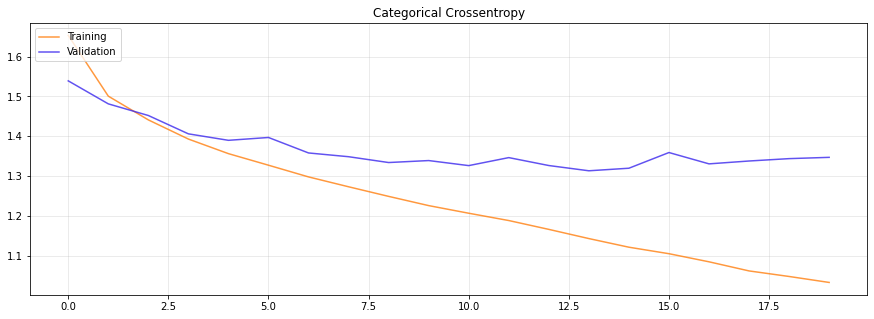

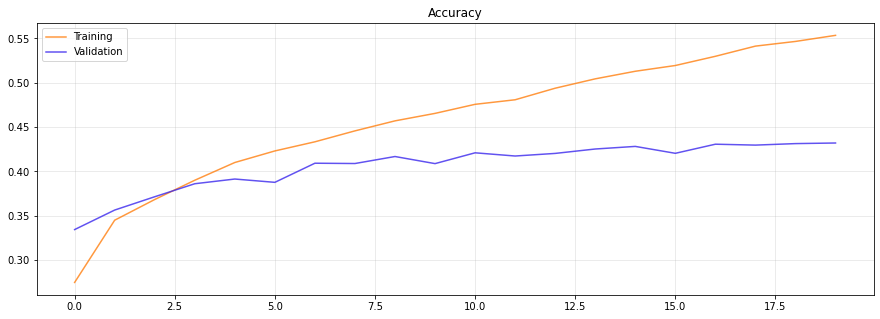

278/278 [==============================] - 2s 5ms/step
              precision    recall  f1-score   support

           0       0.51      0.60      0.55      1432
           1       0.35      0.31      0.33      1436
           2       0.30      0.34      0.32      1380
           3       0.47      0.43      0.45      1578
           4       0.35      0.27      0.31      1532
           5       0.56      0.63      0.60      1513

    accuracy                           0.43      8871
   macro avg       0.42      0.43      0.43      8871
weighted avg       0.43      0.43      0.43      8871



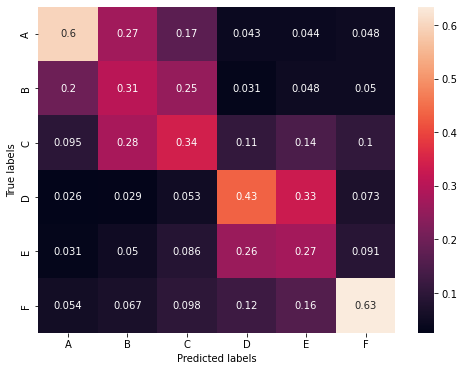

In [ ]:
train_vector,test_vector,word_index =vectorize(x_pos_train,x_pos_test)
embeddings_index = {}
f = open('embeddings/glove.6B.100d.txt','r',encoding='utf-8')
for line in tqdm(f):
    values = line.split(' ')
    word = values[0]
    coefs = np.asarray([float(val) for val in values[1:]])
    embeddings_index[word] = coefs
f.close()

print('Found %s word vectors.' % len(embeddings_index))

embedding_matrix = np.zeros((len(word_index) + 1, 100))
for word, i in tqdm(word_index.items()):
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

model = tf.keras.Sequential([
    tf.keras.layers.Embedding(len(word_index) + 1,
                     100,
                     weights=[embedding_matrix],
                     input_length=200,
                     trainable=True),
    tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64)),
    tf.keras.layers.Dense(len(classes_names), activation='sigmoid')
])
model.compile(
    loss=loss,
    metrics=['accuracy'],
    optimizer=optimizer
)
model.summary()
evaluate(model,train_vector,y_train,test_vector,y_test)

## Transformer
Also in Subtask 2 we decide to adopt the bert-base-multilingual-uncased model for the classification.

In [ ]:
def bert_encode(data, maximum_length,tokenizer) :
    input_ids = []
    attention_masks = []
    for text in data:
        encoded = tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=maximum_length,
            padding='max_length',
            truncation=True,
            return_attention_mask=True,
        )
        input_ids.append(encoded['input_ids'])
        attention_masks.append(encoded['attention_mask'])

    return np.array(input_ids),np.array(attention_masks)

def create_model(bert_model):

    input_ids = tf.keras.Input(shape=(200,),dtype='int32')
    attention_masks = tf.keras.Input(shape=(200,),dtype='int32')

    output = bert_model([input_ids,attention_masks])
    output = output[1]
    output = tf.keras.layers.Dense(len(classes_names),activation='sigmoid')(output)

    model = tf.keras.models.Model(inputs = [input_ids,attention_masks],outputs = output)

    model.compile(optimizer=transformers.AdamWeightDecay(learning_rate=1e-5,weight_decay_rate=0.004), loss=loss, metrics=['accuracy'])
    return model

In [ ]:
model_name='bert-base-multilingual-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)
train_input_ids, train_attention_masks = bert_encode(x_train,200,tokenizer)
test_input_ids, test_attention_masks = bert_encode(x_test,200,tokenizer)
train_input_ids.shape,train_attention_masks.shape,test_input_ids.shape,test_attention_masks.shape

((35480, 200), (35480, 200), (8871, 200), (8871, 200))

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200)]        0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 200)]        0           []                               
                                                                                                  
 tf_bert_model (TFBertModel)    TFBaseModelOutputWi  167356416   ['input_1[0][0]',                
                                thPoolingAndCrossAt               'input_2[0][0]']                
                                tentions(last_hidde                                               
                                n_state=(None, 200,                                           

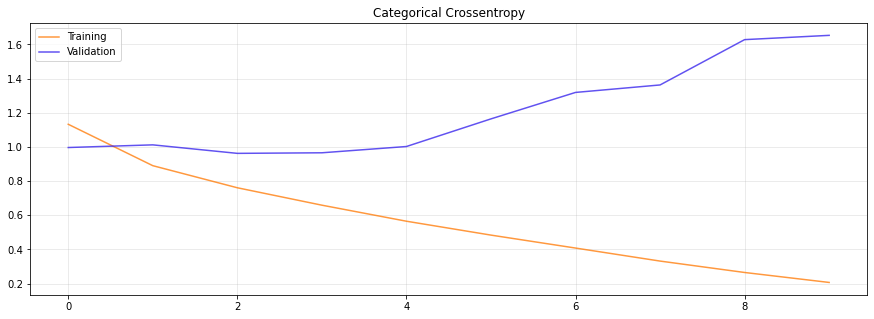

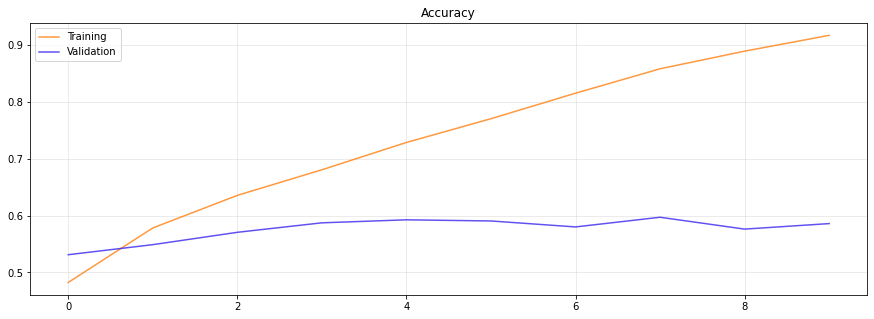

278/278 [==============================] - 52s 182ms/step
              precision    recall  f1-score   support

           0       0.77      0.57      0.66      1432
           1       0.45      0.51      0.48      1436
           2       0.51      0.54      0.53      1380
           3       0.55      0.59      0.57      1578
           4       0.51      0.40      0.44      1532
           5       0.74      0.90      0.81      1513

    accuracy                           0.59      8871
   macro avg       0.59      0.59      0.58      8871
weighted avg       0.59      0.59      0.58      8871



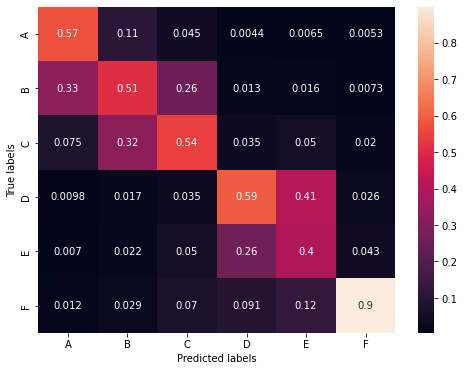

In [ ]:
bert_model = TFBertModel.from_pretrained(model_name)
model = create_model(bert_model)
model.summary()
evaluate(model,[train_input_ids,train_attention_masks],y_train,[test_input_ids,test_attention_masks],y_test,batch_size=8,patience=3,epochs=10)

## Transformer with augmented data

In [ ]:
dataset_dir = 'subtask_2'
languages = ['en','es']
df = pd.read_csv('subtask_2_translated_data.tsv', sep='\t')
datasets = [df] 
for language in languages:
  df = pd.read_csv('{}/{}/train.tsv'.format(dataset_dir, language), sep='\t')
  df['language'] = language
  datasets.append(df)
dataset = pd.concat(datasets,axis=0)
classes=dict(zip(['A','B','C','D','E','F'],range(6)))
classes_names=['A','B','C','D','E','F']
dataset.shape
dataset.info()
dataset.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 83208 entries, 0 to 21934
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        83208 non-null  object
 1   text      83208 non-null  object
 2   label     83208 non-null  object
 3   language  83208 non-null  object
dtypes: object(4)
memory usage: 3.2+ MB


,id,text,label,language
0,es_9255,"Luego, los usuarios pueden anclar estas imágen...",F,es
1,es_1674,Las mejores canciones son aquellas con las que...,B,es
2,es_5001,Encontré este libro mal escrito. Fue escrito d...,D,es
3,es_20779,Regula la aplicación de los contingentes aranc...,E,es
4,es_16154,Mantenga artículos como televisores de pantall...,E,es


In [ ]:
model_name='bert-base-multilingual-uncased'
tokenizer = BertTokenizer.from_pretrained(model_name)

y = np.asarray(dataset['label'].apply(lambda i : classes[i])).astype(int)
x = dataset.text

x_aug_train, x_aug_test, y_aug_train, y_aug_test = train_test_split(
    x,
    y,
    test_size=0.2,
    random_state=seed
)

train_input_ids, train_attention_masks = bert_encode(x_aug_train,200,tokenizer)
test_input_ids, test_attention_masks = bert_encode(x_aug_test,200,tokenizer)

train_input_ids.shape,train_attention_masks.shape,test_input_ids.shape,test_attention_masks.shape

((66566, 200), (66566, 200), (16642, 200), (16642, 200))

In [ ]:
bert_model = TFBertModel.from_pretrained(model_name, num_labels=len(classes_names))

Some layers from the model checkpoint at bert-base-multilingual-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-multilingual-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [ ]:
model = create_model(bert_model)
#model = tf.keras.models.load_model(
#    './subtask_2_models/bert-base-multilingual-uncased',
#    custom_objects={"TFBertModel": bert_model},
#    #compile=False
#)
#model.compile(
#    optimizer=tf.keras.optimizers.Adam(learning_rate=5e-5),
#    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
#    metrics=['accuracy']
#)
model.summary()


Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200)]        0           []                               
                                                                                                  
 input_2 (InputLayer)           [(None, 200)]        0           []                               
                                                                                                  
 tf_bert_model (TFBertModel)    TFBaseModelOutputWi  167356416   ['input_1[0][0]',                
                                thPoolingAndCrossAt               'input_2[0][0]']                
                                tentions(last_hidde                                               
                                n_state=(None, 200,                                           

In [ ]:
evaluate(
    model,
    [train_input_ids,train_attention_masks],
    y_aug_train, #y_train,
    [test_input_ids,test_attention_masks],
    y_aug_test, #y_test,
    batch_size=16,
    patience=1,
    epochs=1,
    path="./subtask_2_models/augmented_bert-base-multilingual-uncased")

4161/4161 [==============================] - 3081s 724ms/step - loss: 1.2354 - accuracy: 0.4439 - val_loss: 1.0954 - val_accuracy: 0.4976


521/521 [==============================] - 232s 438ms/step
              precision    recall  f1-score   support

           0       0.61      0.64      0.63      2475
           1       0.45      0.23      0.31      2515
           2       0.41      0.47      0.43      2583
           3       0.00      0.00      0.00      3056
           4       0.41      0.75      0.53      2983
           5       0.61      0.88      0.72      3030

    accuracy                           0.50     16642
   macro avg       0.42      0.50      0.44     16642
weighted avg       0.41      0.50      0.43     16642



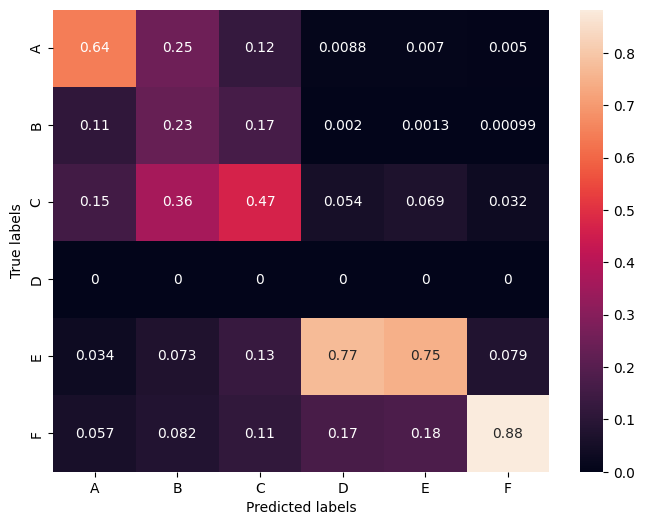

In [ ]:
pred_y = model.predict([test_input_ids,test_attention_masks])
pred_y = pred_y.argmax(1)
print(sklearn.metrics.classification_report(y_aug_test, pred_y))
cm = confusion_matrix(y_aug_test, pred_y, normalize='true')
# Plot the confusion matrix
plt.figure(figsize=(8,6))
sns.heatmap(cm.T, annot=True, xticklabels=classes_names, yticklabels=classes_names)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.show()

## **Results and comments Subtask 2**

On average, all the models cannot reach accuracy higher than 0.6. This is due to the amount of data that we have: with just a few data and many classes the models can't generalize enough. In fact, as we see in the plots of the neural networks, the validation accuracy always differ from the training accuracy by a wide margin, leading to the conclusion that the models overfit.

From the clusters and the ngrams we also can deduce that dataset sentences are very similar in structure and words even if they belong to different classes. We can also see from the confusion matrices that the accuracy on classes 'A' and 'F' are always higher than the accuracies on the other classes: this phenomenon is coherent with the clusters. We've found as two of them are pretty distinguishable, while the others four are almost unseparable as they all overlap in a single region
 
One way to cope with overfitting is increasing the size of the dataset. We tried data augmentation by translating spanish sentences to english and english sentences to spanish, doubling in this way the dataset. We trained an additional transformer on the augmented data, leading to a similar accuracy of ~0.6. We can deduce that this kind of augmentation does not improve the models - both english and spanish sentences from the original dataset share similar phrase structure and meaning. 